# PROJECT OVERVIEW

# LOAD & PROCESS RAW STOCK DATA

In [1]:
## Import Custom Functions and 
import functions_combined_BEST as ji
from functions_combined_BEST import ihelp, ihelp_menu,\
reload, inspect_variables

## IMPORT BS_DS PACKAGES
import bs_ds as bs
from bs_ds.imports import *
from pprint import pprint


# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Set pd.set_options for tweet visibility
# pd.set_option('display.max_colwidth',100)

# Reload modules in case files have been updated
reload(ji)

bs_ds  v0.8.9 loaded.  Read the docs: https://bs-ds.readthedocs.io/en/latest/index.html
For convenient loading of standard modules use: from bs_ds.imports import *



Package,Handle,Description
bs_ds,bs,Custom data science bootcamp student package
matplotlib,mpl,Matplotlib's base OOP module with formatting artists
matplotlib.pyplot,plt,Matplotlib's matlab-like plotting module
numpy,np,scientific computing with Python
pandas,pd,High performance data structures and tools
seaborn,sns,High-level data visualization library based on matplotlib


In [2]:
# DISPLAY CODE TO BE USED BELOW TO LOAD AND PROCESS STOCK DATA
functions_used=['ji.load_processed_stock_data', # This script combines the oriignal 4 used:
                'ji.load_raw_stock_data_from_txt',
                'ji.set_timeindex_freq','ji.custom_BH_freq',
               'ji.get_technical_indicators']

ji.ihelp_menu(functions_used)

interactive(children=(Checkbox(value=False, description='show_help'), Checkbox(value=True, description='show_s…

In [3]:
df = pd.read_csv('data/IVE_bidask1min_08_23_2019.csv',parse_dates=True)
df.set_index('date_time_index',inplace=True)
df.sort_index(ascending=False, inplace=True)
df.head()

,Date,Time,BidOpen,BidHigh,BidLow,BidClose,AskOpen,AskHigh,AskLow,AskClose
date_time_index,,,,,,,,,,
2019-08-23 16:00:00,08/23/2019,16:00,112.29,112.29,112.29,112.29,112.33,112.33,112.33,112.33
2019-08-23 15:59:00,08/23/2019,15:59,112.03,112.30,111.99,112.28,112.05,112.33,112.01,112.32
2019-08-23 15:58:00,08/23/2019,15:58,111.87,111.97,111.87,111.96,111.89,111.99,111.89,111.99
2019-08-23 15:57:00,08/23/2019,15:57,111.75,111.85,111.75,111.82,111.78,111.87,111.77,111.84
2019-08-23 15:56:00,08/23/2019,15:56,111.78,111.85,111.72,111.77,111.81,111.87,111.76,111.80


In [4]:
## Load in raw text file with minute-resolutin S&P 500 prices
reload(ji)
raw_stock_df = ji.load_raw_stock_data_from_txt(verbose=2)

[i] Loading data/IVE_bidask1min_08_23_2019.csv...

[i] Exlcuding data earlier than 2016-12-01.
[i] Cleaning 0 values: replaced 12 zeroes in "BidClose" with np.nan ...".
	- dropping null values (`fill_or_drop_null`).
[i] Converting the datetimeindex to `freq` "CBH"
	- addressing resulting null values using fill_method ffill...


,date_time_index,Date,Time,BidOpen,BidHigh,BidLow,BidClose,AskOpen,AskHigh,AskLow,AskClose,filled_timebin
date_time_index,,,,,,,,,,,,
2019-08-23 15:30:00,2019-08-23 15:30:00,08/23/2019,15:30,112.5,112.54,112.45,112.45,112.53,112.57,112.46,112.46,False
2019-08-23 14:30:00,2019-08-23 14:30:00,08/23/2019,14:30,112.91,112.91,112.91,112.91,112.95,112.95,112.95,112.95,False
2019-08-23 13:30:00,2019-08-23 13:30:00,08/23/2019,13:30,112.74,112.74,112.71,112.72,112.77,112.77,112.75,112.76,False
2019-08-23 12:30:00,2019-08-23 12:30:00,08/23/2019,12:30,113.19,113.19,113.11,113.11,113.21,113.21,113.14,113.14,False
2019-08-23 11:30:00,2019-08-23 11:30:00,08/23/2019,11:30,113.52,113.55,113.51,113.51,113.57,113.6,113.57,113.57,False




------------------------------------------------------------
INDEX REPORT:
------------------------------------------------------------
* Index Endpoints:
	2016-12-01 09:30:00 -- to -- 2019-08-23 15:30:00
* Index Freq:
	<CustomBusinessHour: CBH=09:30-16:30>




In [5]:
stock_df = ji.get_technical_indicators(raw_stock_df,make_price_from='BidClose')
del raw_stock_df

# SELECT DESIRED COLUMNS
stock_df = stock_df[[
    'price','ma7','ma21','26ema','12ema','MACD','20sd',
    'upper_band','lower_band','ema','momentum','Date','filled_timebin']]#,'filled_timebin'

# Make stock_price for twitter functions
stock_df.dropna(inplace=True)
ji.index_report(stock_df)
display(stock_df.head(3))



------------------------------------------------------------
INDEX REPORT:
------------------------------------------------------------
* Index Endpoints:
	2016-12-29 15:30:00 -- to -- 2019-08-23 15:30:00
* Index Freq:
	<CustomBusinessHour: CBH=09:30-16:30>




,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Date,filled_timebin
date_time_index,,,,,,,,,,,,,
2016-12-29 15:30:00,96.27,96.864898,96.277007,96.573856,96.730494,0.156639,1.002051,98.281110,94.272904,96.263988,89.27,12/29/2016,False
2016-12-30 09:30:00,96.38,96.850204,96.293537,96.571218,96.721997,0.150779,0.980655,98.254848,94.332227,96.341329,89.38,12/30/2016,False
2016-12-30 10:30:00,96.21,96.831633,96.307891,96.566317,96.709593,0.143275,0.959724,98.227340,94.388442,96.253776,89.21,12/30/2016,False


In [6]:
stock_df.to_csv('data/_stock_df_with_technical_indicators_08_23_2019.csv')

In [7]:
ji.disp_df_head_tail(stock_df)

,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Date,filled_timebin
date_time_index,,,,,,,,,,,,,
2016-12-29 15:30:00,96.27,96.8649,96.277,96.5739,96.7305,0.156639,1.00205,98.2811,94.2729,96.264,89.27,12/29/2016,False
2016-12-30 09:30:00,96.38,96.8502,96.2935,96.5712,96.722,0.150779,0.980655,98.2548,94.3322,96.3413,89.38,12/30/2016,False
2016-12-30 10:30:00,96.21,96.8316,96.3079,96.5663,96.7096,0.143275,0.959724,98.2273,94.3884,96.2538,89.21,12/30/2016,False


,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Date,filled_timebin
date_time_index,,,,,,,,,,,,,
2019-08-23 13:30:00,112.72,114.303,115.583,115.479,114.785,-0.694321,2.36254,120.308,110.858,112.944,105.72,08/23/2019,False
2019-08-23 14:30:00,112.91,114.315,115.54,115.451,114.74,-0.710353,2.3435,120.227,110.853,112.921,105.91,08/23/2019,False
2019-08-23 15:30:00,112.45,114.323,115.495,115.418,114.687,-0.73145,2.32481,120.144,110.845,112.607,105.45,08/23/2019,False


In [8]:
fig = ji.plotly_time_series(stock_df['price'])

In [9]:
# Plot technical indicators to be used
fig = ji.plotly_technical_indicators(stock_df);

## Checking for Stationarity and Trends

In [10]:
fun_used=['stationarity_check', 'adf_test']
ihelp_menu(fun_used)

interactive(children=(Checkbox(value=False, description='show_help'), Checkbox(value=True, description='show_s…

Results of Dickey-Fuller Test:
	If p<.05 then timeseries IS stationary.
Test Statistic                   -2.070187
p-value                           0.256670
#Lags Used                       32.000000
Number of Observations Used    4805.000000
Critical Value (1%)              -3.431712
Critical Value (5%)              -2.862142
Critical Value (10%)             -2.567090
dtype: float64


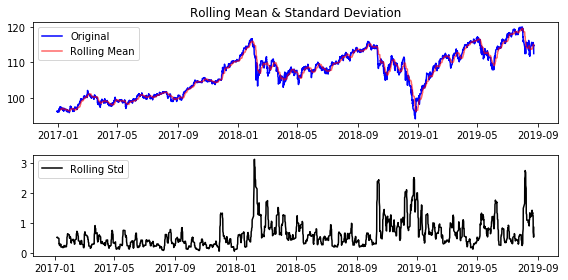

In [11]:
## STATIONARITY CHECK
# Check if stationary 
ji.stationarity_check(stock_df,  window=35, col='price',freq=ji.custom_BH_freq())

In [12]:
## SEASONAL DECOMPOSITION
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(stock_df['price'], freq=35)#35=1 business week

# with plt.rc_context({'figure.figsize': (8,5)}):
#     result.plot();

## Interactive plot of seasonal decomposition
stock_observed = result.observed.rename('true price')
stock_trend = result.trend.rename('trend')
stock_seasonal = result.seasonal.rename('seasonal')
stock_residual = result.resid.rename('residual')

## Concatenate decomposition components
df_decomp = pd.concat([stock_observed,stock_trend, stock_seasonal, stock_residual],axis=1)

# Plotly Plot of Result
my_layout = ji.def_my_layout_solar_theme()
df_decomp.iplot(asDates=True,subplots=True,shape=(4,1), layout=my_layout,shared_xaxes=True)

# Get ADF Stationarity Check for all components
for col in df_decomp.columns:
    print('---'*20)
    print(f"Column: {col}")
    print('---'*10)
    ji.adf_test(df_decomp[col])
    print('---'*20,'\n')

------------------------------------------------------------
Column: true price
------------------------------
Augmented Dickey-Fuller Test: 
ADF test statistic        -2.070187
p-value                    0.256670
# lags used               32.000000
# observations          4805.000000
critical value (1%)       -3.431712
critical value (5%)       -2.862142
critical value (10%)      -2.567090
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary
------------------------------------------------------------ 

------------------------------------------------------------
Column: trend
------------------------------
Augmented Dickey-Fuller Test: 
ADF test statistic        -1.754465
p-value                    0.403291
# lags used               32.000000
# observations          4771.000000
critical value (1%)       -3.431721
critical value (5%)       -2.862146
critical value (10%)      -2.567093
Weak evidence against the null hyp

# INITIAL MODEL 

In [13]:
skip=True
## VISUALIZE PACF AND ACF FUNCTIONS
if skip==False:
    ## VISUALIZE PACF AND ACF FUNCTIONS
    from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
    plot_df = stock_df['price']

    # Create subplots 
    fig,ax = plt.subplots(nrows=3,ncols=1, figsize=(12,6),sharex=False)
    plot_df.plot(ax=ax[0])
    
    ## Set labels for subplot axes
    ax[-1].set(xlabel='Date')
    x_labels = ['Date','Lags','Lags']
    y_labels = ['Price','Auto Corr.','Partial Auto Corr.']
    ax_labels = list(zip(x_labels,y_labels))
    
    for i, (x_label,y_label) in enumerate(ax_labels):
        ax[i].set(ylabel=y_label, xlabel=x_label)

    # Plot acf and pacf
    num_lags = 70
    plot_acf(plot_df,ax=ax[1] , lags=num_lags);
    plot_pacf(plot_df,ax=ax[2],lags=num_lags);
    plt.tight_layout()


## Pyramind ARIMA GridSearch 
#### **Using `pmdarima` to grid search for best ARIMA model type and orders**

- Using `auto_arima` from `pmdarima`

- SARIMA involves multiple sets of hyperparameters:
    - For base model: a set of p,d,q parameters
    - For seasonal model:a set of P,D,Q for the seasonal components.
    - m = the number of time periods to include in the season 
    
- Set start and max values for each parameter
    - i.e. `start_p=0, max_p = 10`
- For seasonal data, setting `m` indicates how many periods should be considered part of the season.


- **Below is from ["Predicitng the Sotck Market Using Machine Learning and Deep Learning."](https://www.analyticsvidhya.com/blog/2018/10/predicting-stock-price-machine-learningnd-deep-learning-techniques-python/):**
> Below are the steps you should follow for implementing auto ARIMA:
    1. Load the data: This step will be the same. Load the data into your notebook
    2. Preprocessing data: The input should be univariate, hence drop the other columns
    3. Fit Auto ARIMA: Fit the model on the univariate series
    4. Predict values on validation set: Make predictions on the validation set
    5. Calculate RMSE: Check the performance of the model using the predicted values against the actual values

In [14]:
stock_df.head()

,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Date,filled_timebin
date_time_index,,,,,,,,,,,,,
2016-12-29 15:30:00,96.27,96.864898,96.277007,96.573856,96.730494,0.156639,1.002051,98.281110,94.272904,96.263988,89.27,12/29/2016,False
2016-12-30 09:30:00,96.38,96.850204,96.293537,96.571218,96.721997,0.150779,0.980655,98.254848,94.332227,96.341329,89.38,12/30/2016,False
2016-12-30 10:30:00,96.21,96.831633,96.307891,96.566317,96.709593,0.143275,0.959724,98.227340,94.388442,96.253776,89.21,12/30/2016,False
2016-12-30 11:30:00,96.34,96.814286,96.322653,96.563255,96.700645,0.137390,0.938272,98.199196,94.446110,96.311259,89.34,12/30/2016,False
2016-12-30 12:30:00,96.25,96.794694,96.336531,96.559027,96.689742,0.130715,0.912397,98.161325,94.511736,96.270420,89.25,12/30/2016,False


In [15]:
skip=True


if skip==False:
    ## PREPARE DATA FOR PMD_ARIMA
    arima_model_params={}

    ## Set params for number of days in dataset
    number_of_days_in_data = len(stock_df['Date'].unique())
    num_test_days=10
    num_train_days = number_of_days_in_data - (num_test_days+1)

    arima_model_params['data_params'] = ji.def_data_params(df_decomp,
                                                           num_test_days=num_test_days,
                                                           num_train_days=num_train_days,
                                                           days_for_x_window=5, verbose=2)

    ###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######
    dp = arima_model_params['data_params']
    df_train, df_test = ji.train_test_split_by_last_days(df_decomp,
                                                         periods_per_day = dp['periods_per_day'], 
                                                         num_test_days   =  dp['num_test_days'],
                                                         num_train_days  =  dp['num_train_days'],
                                                         verbose=0,plot_col='true price', iplot=True)

    display(df_train.head(2).style.set_caption('df_train'),df_test.head(2).style.set_caption('df_test'))

In [16]:
## RUN AUTO ARIMA GRID SEARCH
skip=True
if skip==False:
    auto_arima_clock = bs.Clock()
    auto_arima_clock.tic()
    from pmdarima.arima import auto_arima
    train_data=df_train['true price'].values
    
    auto_arima_model = auto_arima(train_data, start_p=1, start_q=1, D=1, max_p=2,max_q=2,
                       trace=True,seasonal=True,m=35,)
    auto_arima_clock.toc()
    
    display(auto_arima_model.summary())


___
**Results of the Auto-Arima searching with training data set:**
- Training Set= all data less the last 90 days:

`Model:		SARIMAX(1, 0, 0)x(0, 1, 1, 35)`(08/24/2019)
~~(0, 1, 0)x(1, 0, 1, 35)~~
- **New Result (08/06)**
    - `order= (0,1,0),seasonal_order=(0,1,1,35)`
- So what is this really saying?
    - p,d,q = (0,1,0)
        - AR (p) = 0
        - Difference=1
        - MA order(q)=0 
        
    - P,D,Q,m = (1,0,1,35)
        - Seasonal AR(P) = 1
        - Seasonal Differencing =0
        - Seasonal MA(Q)
        - Steps per season (m) = 35 (set by user)

`statsmodels` version of SARIMA called SARIMAX adds an eXogenous variable to the regression.
- Read this: https://www.analyticsvidhya.com/blog/2018/08/auto-arima-time-series-modeling-python-r/


- WHEN I SWITCH TO DAILY DATA:
`Model:	SARIMAX(1, 1, 1)x(1, 0, 1, 5)`
 
### Now implement suggested SARIMAX model

In [17]:
## IMPLEMENT SUGGESTED SARIMAX MODEL
skip=True
if skip==False:
    clock_sarimax = bs.Clock()
    
    train_data = df_train['true price'].values.reshape(-1,1)
    exog_data = df_train['trend'].values.reshape(-1,1)
    print(exog_data.shape, train_data.shape)
    
    from statsmodels.tsa.statespace.sarimax import SARIMAX
    
    clock_sarimax.tic()
    # Fit ARIMA: order=(1, 0, 0) seasonal_order=(1, 1, 0, 35); AIC=2881.238, BIC=2905.991, Fit time=52.449 seconds
    sarimax_model = SARIMAX(train_data, 
                            order= (1,0,0),
                            seasonal_order=(0,1,1,35),
                            enforce_invertibility=False)#,trend=exog_data) 
    results=sarimax_model.fit()
    clock_sarimax.toc()
    display(results.summary())
    

In [18]:
skip=True
if skip==False:
    # Get test and train data 
    test_data = df_test['true price']
    train_data = df_train
    
    ## EVALUATE MODEL
    from sklearn.metrics import mean_absolute_error, mean_squared_error
    
    # Get predictions
    start = len(train_data)
    end = start + len(test_data) - 1
    
    predictions =results.predict(start=start,end=end)#).rename('SARIMA Model')
    days_per_period=7
    
#     # Run custom regression evaluation function
#     res_df = ji.evaluate_regression(test_data,predictions, metrics=['r2','RMSE','MAE','U'])

    
    # Combine preds and true into one df
    df_predictions_sarima = pd.concat([test_data,pd.Series(predictions, 
                                                           index=test_data.index,
                                                           name='predicted_price')],axis=1)
    df_predictions_sarima.dropna(inplace=True)

    
    # Calculate  rmse
    rmse_sarima = np.sqrt(mean_squared_error(df_predictions_sarima['true price'],df_predictions_sarima['predicted_price']))
    print(f"RMSE: {rmse_sarima.round(3)}")

    
    def plot_arima_preds(train_data, df_predictions_sarima):
    ## Plot results
        fig, ax  = plt.subplots(nrows=1,ncols=2, figsize=(10,4))

        ax[0].plot(train_data['true price'].iloc[-120*days_per_period:], color='orange',label='Training Price')#.plot(label='price - train')
        ax[0].plot(df_predictions_sarima['true price'], label='True Price', color='blue')
        ax[0].plot(df_predictions_sarima['predicted_price'], label='Predicted Price',color='green')

        ax[0].set_ylabel('Stock Price')
        ax[0].set_xlabel('Business Day - Hour Resolution')

        ax[1].plot(df_predictions_sarima['true price'],color='blue', label='True Price')
        ax[1].plot(df_predictions_sarima['predicted_price'], color='green',label='Predicted Price')    

        ax[0].xaxis.set_tick_params(rotation=30)
        ax[1].xaxis.set_tick_params(rotation=30)

        plt.suptitle('SARIMAX Model',y=1.01)
        plt.legend()
        plt.tight_layout()
        #     plt.text('2018-10-01',113,f"RMSE: {rmse_sarima.round(3)}", fontdict={'fontsize':10, 'fontweight':'medium'})
        plt.show()
        return fig, ax
    # Run custom regression evaluation function
    res_df = ji.evaluate_regression(test_data,predictions, metrics=['r2','RMSE','MAE','U'], display_thiels_u_info=True)
    display(res_df)
    plot_arima_preds(train_data,df_predictions_sarima)

## File Saving Infrastructure

In [208]:
## For each model need
#1) df_model for true_vs_preds_subplots
#2) df_results for tables (if cant use html export) (includes time_Shifted_metrics)
#3) df_shifted with traces for all shifts (maybe plot)
#4) save normal true_vs_pred_subplots 
file_dict = {}

for i in ['0A','0B','1','2','3']:
                  
    file_dict[f"model{i}"] ={}
    
    file_dict[f'model{i}']['df_model'] = f'assets/model{i}_df_model_true_vs_preds.csv'
    file_dict[f'model{i}']['df_results'] = f'assets/model{i}_df_results.csv' 
    file_dict[f'model{i}']['df_shifted'] = f'assets/model{i}_df_shifted.csv'
    
    file_dict[f'model{i}']['fig'] = f'assets/model{i}_true_vs_preds'
    file_dict[f'model{i}']['fig_shifted'] = f'assets/model{i}_true_vs_preds_shifted'
                  

pprint(file_dict)

# export = [df_model1,dfs_results,df_shifted]
how_to_use="""
save_model_dfs(file_dict,'model1',
               df_model=df_model1,
              df_results=dfs_results1,
              df_shifted=df_shifted1)
"""                  

{'model0A': {'df_model': 'assets/model0A_df_model_true_vs_preds.csv',
             'df_results': 'assets/model0A_df_results.csv',
             'df_shifted': 'assets/model0A_df_shifted.csv',
             'fig': 'assets/model0A_true_vs_preds',
             'fig_shifted': 'assets/model0A_true_vs_preds_shifted'},
 'model0B': {'df_model': 'assets/model0B_df_model_true_vs_preds.csv',
             'df_results': 'assets/model0B_df_results.csv',
             'df_shifted': 'assets/model0B_df_shifted.csv',
             'fig': 'assets/model0B_true_vs_preds',
             'fig_shifted': 'assets/model0B_true_vs_preds_shifted'},
 'model1': {'df_model': 'assets/model1_df_model_true_vs_preds.csv',
            'df_results': 'assets/model1_df_results.csv',
            'df_shifted': 'assets/model1_df_shifted.csv',
            'fig': 'assets/model1_true_vs_preds',
            'fig_shifted': 'assets/model1_true_vs_preds_shifted'},
 'model2': {'df_model': 'assets/model2_df_model_true_vs_preds.csv',
         

# NLP PROCESSING OF TRUMP's TWEETS

In [19]:
ji.reload(ji)
ji.ihelp_menu([ji.load_raw_twitter_file,
               ji.full_twitter_df_processing, ji.full_sentiment_analysis])

interactive(children=(Checkbox(value=False, description='show_help'), Checkbox(value=True, description='show_s…

In [20]:
## Load in raw csv of twitter_data, create date_time_index, rename columns
ji.reload([ji])
twitter_df = ji.load_raw_twitter_file(filename='data/trumptwitterarchive_export_iphone_only__08_23_2019.csv', 
                         date_as_index=True,
                         rename_map={'text': 'content',
                                     'created_at': 'date'})

## Create list of stopwords for twitter processing
stop_words = ji.make_stopwords_list(incl_punc=True, incl_nums=True,
                                    add_custom=['http','https',
                                                '...','…','``',
                                                'co','“','“','’','‘','”',
                                                "n't","''",'u','s',"'s",
                                                '|','\\|','amp',"i'm"])

## Process twitter data: 
# 1. create minimally cleaned column `content_min_clean` with urls
twitter_df = ji.full_twitter_df_processing(twitter_df,
                                           raw_tweet_col='content',
                                           name_for_cleaned_tweet_col='content_cleaned',
                                           name_for_stopped_col='cleaned_stopped_content', 
                                           name_for_tokenzied_stopped_col='cleaned_stopped_tokens',
                                           use_col_for_case_ratio='content_min_clean', 
                                           use_col_for_sentiment='content_min_clean',
                                           RT=True, urls=True, hashtags=True, mentions=True,
                                           str_tags_mentions=True,
                                           stopwords_list=stop_words, force=False)
twitter_df.head(3)

[i] stopped text column:  cleaned_stopped_content
[i] tokenized stopped text column:  cleaned_stopped_tokens


,source,content,date,retweet_count,favorite_count,is_retweet,id_str,has_RT,starts_RT,content_starts_RT,...,mention_strings,cleaned_stopped_content,cleaned_stopped_tokens,case_ratio,sentiment_scores,compound_score,sentiment_class,neg,neu,pos
date,,,,,,,,,,,,,,,,,,,,,
2016-12-01 14:37:57,Twitter for iPhone,My thoughts and prayers are with those affecte...,2016-12-01 14:37:57,12077,65724,False,804333718999539712,False,False,[],...,,thoughts prayers affected tragic storms tornad...,"[thoughts, prayers, affected, tragic, storms, ...",0.03906,"{'neg': 0.167, 'neu': 0.616, 'pos': 0.217, 'co...",0.3382,pos,0.167,0.616,0.217
2016-12-01 22:52:10,Twitter for iPhone,Heading to U.S. Bank Arena in Cincinnati Ohio ...,2016-12-01 22:52:10,5564,31256,False,804458095569158144,False,False,[],...,,heading bank arena cincinnati ohio pm rally jo...,"[heading, bank, arena, cincinnati, ohio, pm, r...",0.10976,"{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'comp...",0.3595,pos,0.000,0.839,0.161
2016-12-02 02:45:18,Twitter for iPhone,Thank you Ohio! Together we made history – and...,2016-12-02 02:45:18,17283,72196,False,804516764562374656,False,False,[],...,,thank ohio together made history real work beg...,"[thank, ohio, together, made, history, real, w...",0.03670,"{'neg': 0.0, 'neu': 0.712, 'pos': 0.288, 'comp...",0.7568,pos,0.000,0.712,0.288


In [21]:
idx_keep_tf = ji.check_length_string_column(twitter_df)
idx_keep_tf.value_counts()

twitter_df = twitter_df[ji.check_length_string_column]
twitter_df.head()



------------------------------------------------------------
STRING LENGTH REPORT:
------------------------------------------------------------
Found 2 # of strings above cutoff of 350 chars.


,count,mean,std,min,25%,50%,75%,max
content,9322,169.732,218.557,2,119,140,254,19888




------------------------------------------------------------
STRING LENGTH REPORT:
------------------------------------------------------------
Found 2 # of strings above cutoff of 350 chars.


,count,mean,std,min,25%,50%,75%,max
content,9322,169.732,218.557,2,119,140,254,19888


,source,content,date,retweet_count,favorite_count,is_retweet,id_str,has_RT,starts_RT,content_starts_RT,...,mention_strings,cleaned_stopped_content,cleaned_stopped_tokens,case_ratio,sentiment_scores,compound_score,sentiment_class,neg,neu,pos
date,,,,,,,,,,,,,,,,,,,,,
2016-12-01 14:37:57,Twitter for iPhone,My thoughts and prayers are with those affecte...,2016-12-01 14:37:57,12077,65724,False,804333718999539712,False,False,[],...,,thoughts prayers affected tragic storms tornad...,"[thoughts, prayers, affected, tragic, storms, ...",0.03906,"{'neg': 0.167, 'neu': 0.616, 'pos': 0.217, 'co...",0.3382,pos,0.167,0.616,0.217
2016-12-01 22:52:10,Twitter for iPhone,Heading to U.S. Bank Arena in Cincinnati Ohio ...,2016-12-01 22:52:10,5564,31256,False,804458095569158144,False,False,[],...,,heading bank arena cincinnati ohio pm rally jo...,"[heading, bank, arena, cincinnati, ohio, pm, r...",0.10976,"{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'comp...",0.3595,pos,0.000,0.839,0.161
2016-12-02 02:45:18,Twitter for iPhone,Thank you Ohio! Together we made history – and...,2016-12-02 02:45:18,17283,72196,False,804516764562374656,False,False,[],...,,thank ohio together made history real work beg...,"[thank, ohio, together, made, history, real, w...",0.03670,"{'neg': 0.0, 'neu': 0.712, 'pos': 0.288, 'comp...",0.7568,pos,0.000,0.712,0.288
2016-12-03 19:09:40,Twitter for iPhone,State Treasurer John Kennedy is my choice for ...,2016-12-03 19:09:40,9800,39057,False,805126876779913216,False,False,[],...,,state treasurer john kennedy choice us senator...,"[state, treasurer, john, kennedy, choice, us, ...",0.08621,"{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'comp...",0.1280,pos,0.000,0.919,0.081
2016-12-03 19:13:01,Twitter for iPhone,Our great VPE @mike_pence is in Louisiana camp...,2016-12-03 19:13:01,9224,39351,False,805127720749383680,False,False,[],...,@mike_pence,great vpe louisiana campaigning john kennedy u...,"[great, vpe, louisiana, campaigning, john, ken...",0.08759,"{'neg': 0.0, 'neu': 0.755, 'pos': 0.245, 'comp...",0.7783,pos,0.000,0.755,0.245


In [22]:
# ## Deal with any duplicates columns
# twitter_df = twitter_df.loc[:,~twitter_df.columns.duplicated()]
# twitter_df.columns.duplicated()          

# ## Remove bizarre super-long tweet
# idx_too_long = check_length_string_column(twitter_df)
# twitter_df = twitter_df.loc[twitter_df.loc[~idx_too_long]

# twitter_df.head(3)

### Preview Tweets and Search for Specific Words

In [23]:
twitter_df.columns

Index(['source', 'content', 'date', 'retweet_count', 'favorite_count',
       'is_retweet', 'id_str', 'has_RT', 'starts_RT', 'content_starts_RT',
       'content_cleaned', 'content_min_clean', 'content_hashtags',
       'hashtag_strings', 'content_mentions', 'mention_strings',
       'cleaned_stopped_content', 'cleaned_stopped_tokens', 'case_ratio',
       'sentiment_scores', 'compound_score', 'sentiment_class', 'neg', 'neu',
       'pos'],
      dtype='object')

In [24]:
## Preview all processed versions of the same tweet to preview NLP result

# if index=None, tweet is random. if index= datetime_index, display specific tweet
# if index=a date(no time) shows all tweets from that day
ji.display_same_tweet_diff_cols(twitter_df, index=None,
                                 columns=['content',
                                          'content_min_clean',
                                          'cleaned_stopped_content',
                                          'cleaned_stopped_tokens'],as_df=True)

2019-02-17T18:29:40.000000000


,tweet
column,
content,https://t.co/r8N9m5vQlF
content_min_clean,
cleaned_stopped_content,
cleaned_stopped_tokens,[]


In [25]:
## Search all tweets for occurances of spe
idx_russia_tweets = ji.search_for_tweets_with_word(twitter_df, word ='russia',
                                     n=10, from_column='content',
                                     return_index=True, display_df=True)

date,content,retweet_count,favorite_count,source,compound_score,sentiment_class
2019-08-18 18:24:39,RT @MariaBartiromo: Lindsey Graham on IG investigation into Russia probe: I want the American people to see what happened https://t.co/gM0y…,8753,0,Twitter for iPhone,0.0772,pos
2019-08-18 12:22:55,The Failing New York Times in one of the most devastating portrayals of bad journalism in history got caught by a leaker that they are shifting from their Phony Russian Collusion Narrative (the Mueller Report & his testimony were a total disaster) to a Racism Witch Hunt.....,27580,113527,Twitter for iPhone,-0.9583,neg
2019-08-17 22:03:57,RT @steph93065: In 2016 Trump voters were DeplorableIn 2017 Trump voters were RussiansIn 2018 Trump voters were NazisIn 2019 Trum…,23902,0,Twitter for iPhone,0,pos
2019-08-12 21:26:32,The United States is learning much from the failed missile explosion in Russia. We have similar though more advanced technology. The Russian “Skyfall” explosion has people worried about the air around the facility and far beyond. Not good!,18836,77730,Twitter for iPhone,-0.4775,neg
2019-07-31 14:08:05,Such a great victory in court yesterday on the Russian Hoax the greatest political scam in the history of our Country. TREASON! Hopefully the Attorney Generel of the United States and all of those working with him will find out in great detail what happened. NEVER AGAIN!!!!,26216,105241,Twitter for iPhone,0.8918,pos
2019-07-30 23:26:26,....vindication & exoneration from the Russian WikiLeaks and every other form of HOAX perpetrated by the DNC Radical Democrats and others. This is really big “stuff” especially coming from a highly respected judge who was appointed by President Clinton. The Witch Hunt Ends!,26745,119495,Twitter for iPhone,-0.3031,neg
2019-07-30 16:26:27,RT @senatemajldr: I spoke on the Senate floor today about my extensive record of standing up to Russia election security and why we won’t…,8119,0,Twitter for iPhone,0.34,pos
2019-07-28 04:02:25,The Democrats are still doing the Russians dirty work as they continue to push the fake crime. Media credibility is now shot Democrat credibility is shot they’ve wasted over 100 hearings on a Hoax they’ve done nothing on Infrastructure drug prices trade....@JesseBWatters,17249,68311,Twitter for iPhone,-0.93,neg
2019-07-24 17:24:00,"RT @RepMattGaetz: Gaetz: ""Can you state with confidence the Steele dossier was not part of Russia's disinformation campaign?""Mueller: ""Wi…",31314,0,Twitter for iPhone,0.5106,pos
2019-07-13 12:12:21,RT @JudicialWatch: @TomFitton: Why Didn't Mueller Investigate Clinton Campaign Getting Anti-Trump Dirt from Russians? https://t.co/bHMktH5F…,6752,0,Twitter for iPhone,-0.34,neg


	 * there are 383 tweets not shown. Next index = 2019-07-06 22:59:38


In [26]:
twitter_df.head()

,source,content,date,retweet_count,favorite_count,is_retweet,id_str,has_RT,starts_RT,content_starts_RT,...,mention_strings,cleaned_stopped_content,cleaned_stopped_tokens,case_ratio,sentiment_scores,compound_score,sentiment_class,neg,neu,pos
date,,,,,,,,,,,,,,,,,,,,,
2016-12-01 14:37:57,Twitter for iPhone,My thoughts and prayers are with those affecte...,2016-12-01 14:37:57,12077,65724,False,804333718999539712,False,False,[],...,,thoughts prayers affected tragic storms tornad...,"[thoughts, prayers, affected, tragic, storms, ...",0.03906,"{'neg': 0.167, 'neu': 0.616, 'pos': 0.217, 'co...",0.3382,pos,0.167,0.616,0.217
2016-12-01 22:52:10,Twitter for iPhone,Heading to U.S. Bank Arena in Cincinnati Ohio ...,2016-12-01 22:52:10,5564,31256,False,804458095569158144,False,False,[],...,,heading bank arena cincinnati ohio pm rally jo...,"[heading, bank, arena, cincinnati, ohio, pm, r...",0.10976,"{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'comp...",0.3595,pos,0.000,0.839,0.161
2016-12-02 02:45:18,Twitter for iPhone,Thank you Ohio! Together we made history – and...,2016-12-02 02:45:18,17283,72196,False,804516764562374656,False,False,[],...,,thank ohio together made history real work beg...,"[thank, ohio, together, made, history, real, w...",0.03670,"{'neg': 0.0, 'neu': 0.712, 'pos': 0.288, 'comp...",0.7568,pos,0.000,0.712,0.288
2016-12-03 19:09:40,Twitter for iPhone,State Treasurer John Kennedy is my choice for ...,2016-12-03 19:09:40,9800,39057,False,805126876779913216,False,False,[],...,,state treasurer john kennedy choice us senator...,"[state, treasurer, john, kennedy, choice, us, ...",0.08621,"{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'comp...",0.1280,pos,0.000,0.919,0.081
2016-12-03 19:13:01,Twitter for iPhone,Our great VPE @mike_pence is in Louisiana camp...,2016-12-03 19:13:01,9224,39351,False,805127720749383680,False,False,[],...,@mike_pence,great vpe louisiana campaigning john kennedy u...,"[great, vpe, louisiana, campaigning, john, ken...",0.08759,"{'neg': 0.0, 'neu': 0.755, 'pos': 0.245, 'comp...",0.7783,pos,0.000,0.755,0.245


### NLP FIGURES 

In [27]:
## add stock_price for twitter_df
reload(ji)
twitter_df = ji.load_twitter_df_stock_price(twitter_df, 
                                           get_stock_prices_per_tweet=True,
                                           price_mins_after_tweet=60)

loading stock_price


,source,content,date,retweet_count,favorite_count,is_retweet,id_str,has_RT,starts_RT,content_starts_RT,...,mention_strings,cleaned_stopped_content,cleaned_stopped_tokens,case_ratio,sentiment_scores,compound_score,sentiment_class,neg,neu,pos
date,,,,,,,,,,,,,,,,,,,,,
2016-12-01 14:37:57,Twitter for iPhone,My thoughts and prayers are with those affecte...,2016-12-01 14:37:57,12077,65724,False,804333718999539712,False,False,[],...,,thoughts prayers affected tragic storms tornad...,"[thoughts, prayers, affected, tragic, storms, ...",0.03906,"{'neg': 0.167, 'neu': 0.616, 'pos': 0.217, 'co...",0.3382,pos,0.167,0.616,0.217
2016-12-01 22:52:10,Twitter for iPhone,Heading to U.S. Bank Arena in Cincinnati Ohio ...,2016-12-01 22:52:10,5564,31256,False,804458095569158144,False,False,[],...,,heading bank arena cincinnati ohio pm rally jo...,"[heading, bank, arena, cincinnati, ohio, pm, r...",0.10976,"{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'comp...",0.3595,pos,0.000,0.839,0.161
2016-12-02 02:45:18,Twitter for iPhone,Thank you Ohio! Together we made history – and...,2016-12-02 02:45:18,17283,72196,False,804516764562374656,False,False,[],...,,thank ohio together made history real work beg...,"[thank, ohio, together, made, history, real, w...",0.03670,"{'neg': 0.0, 'neu': 0.712, 'pos': 0.288, 'comp...",0.7568,pos,0.000,0.712,0.288
2016-12-03 19:09:40,Twitter for iPhone,State Treasurer John Kennedy is my choice for ...,2016-12-03 19:09:40,9800,39057,False,805126876779913216,False,False,[],...,,state treasurer john kennedy choice us senator...,"[state, treasurer, john, kennedy, choice, us, ...",0.08621,"{'neg': 0.0, 'neu': 0.919, 'pos': 0.081, 'comp...",0.1280,pos,0.000,0.919,0.081
2016-12-03 19:13:01,Twitter for iPhone,Our great VPE @mike_pence is in Louisiana camp...,2016-12-03 19:13:01,9224,39351,False,805127720749383680,False,False,[],...,@mike_pence,great vpe louisiana campaigning john kennedy u...,"[great, vpe, louisiana, campaigning, john, ken...",0.08759,"{'neg': 0.0, 'neu': 0.755, 'pos': 0.245, 'comp...",0.7783,pos,0.000,0.755,0.245


2016-12-01 09:30:00 2019-08-23 16:00:00
2016-12-01 14:37:57 2019-08-24 03:58:32
Adding stock_price data for tweets using `get_stock_prices_for_twitter_data`...
Limiting twitter_df timeindex to match stock_price.


In [28]:
display(twitter_df.head())
twitter_df.columns

,source,content,date,retweet_count,favorite_count,is_retweet,id_str,has_RT,starts_RT,content_starts_RT,...,null_results,B_ts_rounded,pre_tweet_price,mins_after_tweet,B_ts_post_tweet,post_tweet_price,delta_time,delta_price,delta_price_class,delta_price_class_int
date,,,,,,,,,,,,,,,,,,,,,
2016-12-01 14:37:57,Twitter for iPhone,My thoughts and prayers are with those affecte...,2016-12-01 14:37:57,12077,65724,False,804333718999539712,False,False,[],...,False,2016-12-01 14:38:00,93.97,60.0,2016-12-01 15:38:00,93.82,01:00:00,-0.15,neg,0
2016-12-01 22:52:10,Twitter for iPhone,Heading to U.S. Bank Arena in Cincinnati Ohio ...,2016-12-01 22:52:10,5564,31256,False,804458095569158144,False,False,[],...,False,2016-12-02 09:30:00,93.97,60.0,2016-12-02 10:30:00,94.03,01:00:00,0.06,pos,1
2016-12-02 02:45:18,Twitter for iPhone,Thank you Ohio! Together we made history – and...,2016-12-02 02:45:18,17283,72196,False,804516764562374656,False,False,[],...,False,2016-12-02 09:30:00,93.97,60.0,2016-12-02 10:30:00,94.03,01:00:00,0.06,pos,1
2016-12-03 19:09:40,Twitter for iPhone,State Treasurer John Kennedy is my choice for ...,2016-12-03 19:09:40,9800,39057,False,805126876779913216,False,False,[],...,False,2016-12-05 09:30:00,94.29,60.0,2016-12-05 10:30:00,94.46,01:00:00,0.17,pos,1
2016-12-03 19:13:01,Twitter for iPhone,Our great VPE @mike_pence is in Louisiana camp...,2016-12-03 19:13:01,9224,39351,False,805127720749383680,False,False,[],...,False,2016-12-05 09:30:00,94.29,60.0,2016-12-05 10:30:00,94.46,01:00:00,0.17,pos,1


Index(['source', 'content', 'date', 'retweet_count', 'favorite_count',
       'is_retweet', 'id_str', 'has_RT', 'starts_RT', 'content_starts_RT',
       'content_cleaned', 'content_min_clean', 'content_hashtags',
       'hashtag_strings', 'content_mentions', 'mention_strings',
       'cleaned_stopped_content', 'cleaned_stopped_tokens', 'case_ratio',
       'sentiment_scores', 'compound_score', 'sentiment_class', 'neg', 'neu',
       'pos', 'day', 'time', 'dayofweek', 'B_day', 'B_shifted', 'B_time',
       'B_dt_index', 'time_shift', 'B_dt_minutes', 'stock_price_results',
       'null_results', 'B_ts_rounded', 'pre_tweet_price', 'mins_after_tweet',
       'B_ts_post_tweet', 'post_tweet_price', 'delta_time', 'delta_price',
       'delta_price_class', 'delta_price_class_int'],
      dtype='object')

In [29]:
# Generate wordclouds
reload(ji)
ji.get_group_texts_for_word_cloud
display(twitter_df.head(2))
print(twitter_df.columns)


,source,content,date,retweet_count,favorite_count,is_retweet,id_str,has_RT,starts_RT,content_starts_RT,...,null_results,B_ts_rounded,pre_tweet_price,mins_after_tweet,B_ts_post_tweet,post_tweet_price,delta_time,delta_price,delta_price_class,delta_price_class_int
date,,,,,,,,,,,,,,,,,,,,,
2016-12-01 14:37:57,Twitter for iPhone,My thoughts and prayers are with those affecte...,2016-12-01 14:37:57,12077,65724,False,804333718999539712,False,False,[],...,False,2016-12-01 14:38:00,93.97,60.0,2016-12-01 15:38:00,93.82,01:00:00,-0.15,neg,0
2016-12-01 22:52:10,Twitter for iPhone,Heading to U.S. Bank Arena in Cincinnati Ohio ...,2016-12-01 22:52:10,5564,31256,False,804458095569158144,False,False,[],...,False,2016-12-02 09:30:00,93.97,60.0,2016-12-02 10:30:00,94.03,01:00:00,0.06,pos,1


Index(['source', 'content', 'date', 'retweet_count', 'favorite_count',
       'is_retweet', 'id_str', 'has_RT', 'starts_RT', 'content_starts_RT',
       'content_cleaned', 'content_min_clean', 'content_hashtags',
       'hashtag_strings', 'content_mentions', 'mention_strings',
       'cleaned_stopped_content', 'cleaned_stopped_tokens', 'case_ratio',
       'sentiment_scores', 'compound_score', 'sentiment_class', 'neg', 'neu',
       'pos', 'day', 'time', 'dayofweek', 'B_day', 'B_shifted', 'B_time',
       'B_dt_index', 'time_shift', 'B_dt_minutes', 'stock_price_results',
       'null_results', 'B_ts_rounded', 'pre_tweet_price', 'mins_after_tweet',
       'B_ts_post_tweet', 'post_tweet_price', 'delta_time', 'delta_price',
       'delta_price_class', 'delta_price_class_int'],
      dtype='object')


In [30]:
twitter_df_groups,twitter_group_text = ji.get_group_texts_for_word_cloud(twitter_df, 
                                                                      text_column='cleaned_stopped_content', 
                                                                      groupby_column='delta_price_class')

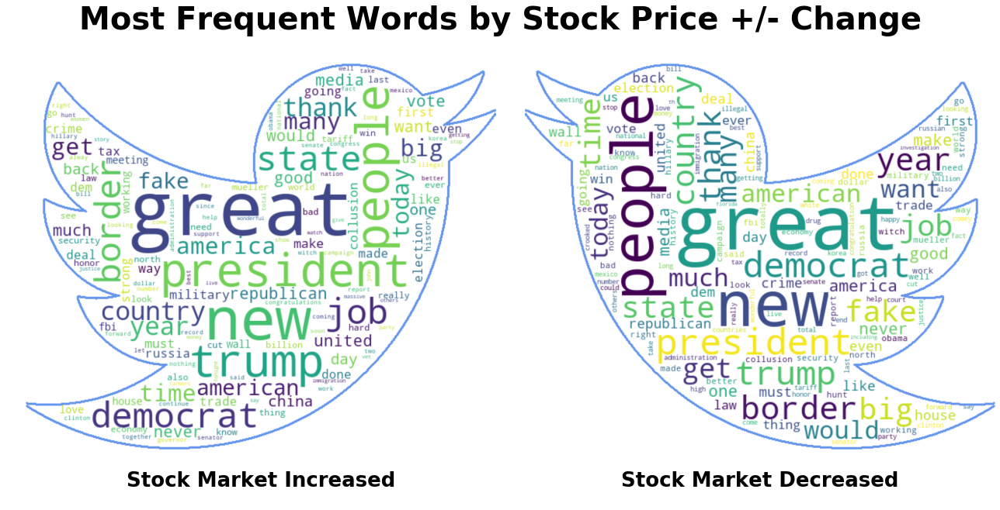

figured saved as figures/Most Frequent Words by Stock Price +_- Change.png


In [31]:
ji.compare_word_clouds(text1=twitter_df_groups['pos']['joined'],
                       label1='Stock Market Increased',
                       text2= twitter_df_groups['neg']['joined'],
                       label2='Stock Market Decreased',
                       twitter_shaped = True,
                       suptitle_y_loc=0.75, suptitle_text='Most Frequent Words by Stock Price +/- Change',
                       save_file=True,filepath_folder='figures/',
                      **{'subplot_titles_fontdict':
                         {'fontsize':26,
                         'fontweight':'bold'
                         },
                        'suptitle_fontdict':{
                         'fontsize':40,
                         'fontweight':'bold'
                        }
                        });

In [32]:
reload(ji)
df_pos_words, df_neg_words = ji.compare_freq_dists_unique_words(text1=twitter_df_groups['pos']['text_tokens'],
                                                                label1='Price Increased',
                                                                text2=twitter_df_groups['neg']['text_tokens'],
                                                                label2='Price Decreased',
                                                                top_n=20, display_dfs=True,
                                                                return_as_dicts=False)

pos_freq_dict, neg_freq_dict = ji.compare_freq_dists_unique_words(text1=twitter_df_groups['pos']['text_tokens'],
                                                                label1='Price Increased',
                                                                text2=twitter_df_groups['neg']['text_tokens'],
                                                                label2='Price Decreased',
                                                                top_n=20, display_dfs=False,
                                                                return_as_dicts=True)


Unique Text1 Words,Frequency
roll,7
epa,7
sri,6
cousy,6
concrete,6
lanka,6
ht,5
ally,5
recipients,5
seized,5


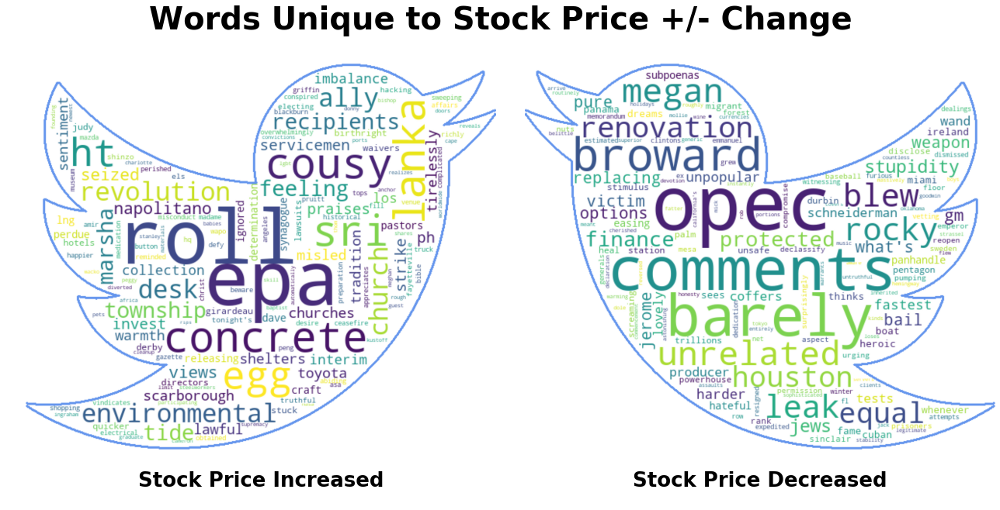

figured saved as figures/Words Unique to Stock Price +_- Change.png


In [33]:
## WORDCLOUD OF WORDS UNIQUE TO TWEETS THAT INCREASED VS DECREASED STOCK PRICE
ji.reload(ji)
ji.compare_word_clouds(text1= pos_freq_dict,label1='Stock Price Increased',
                      text2=neg_freq_dict, label2='Stock Price Decreased',
                      twitter_shaped=True, from_freq_dicts=True,suptitle_y_loc=0.75,
                      suptitle_text='Words Unique to Stock Price +/- Change',
                       save_file=True,filepath_folder='figures/',
                      **{'subplot_titles_fontdict':
                         {'fontsize':26,
                         'fontweight':'bold'
                         },
                        'suptitle_fontdict':{
                         'fontsize':40,
                         'fontweight':'bold'
                        }
                        });

In [34]:
## Word Cloud for unique words.
# - need to create body of test 

In [35]:
# display_df=True
# text1=twitter_df_groups['pos']['text_tokens']
# label1='Stock Market Increased'
# text2= twitter_df_groups['neg']['text_tokens']
# label2='Stock Market Decreased'
# top_n=25

# from nltk import FreqDist
# import pandas as pd
# from IPython.display import display
# freq_1 = FreqDist(text1)
# freq_2 = FreqDist(text2)

# df_compare=pd.DataFrame()
# df_compare[label1] = freq_1.most_common(top_n)
# df_compare[label2] = freq_2.most_common(top_n)
# if display_df:
#     display(df_compare)

# ## Plot dists
# import matplotlib.pyplot as plt
# import matplotlib as mpl 
# style='seaborn-poster'
# with plt.style.context(style):
#     mpl.rcParams['figure.figsize']=(12,6)
#     plt.title(f'{top_n} Most Frequent Words - {label1}')
#     freq_1.plot(25)
#     plt.title(f'{top_n} Most Frequent Words - {label2}')
#     freq_2.plot(25)


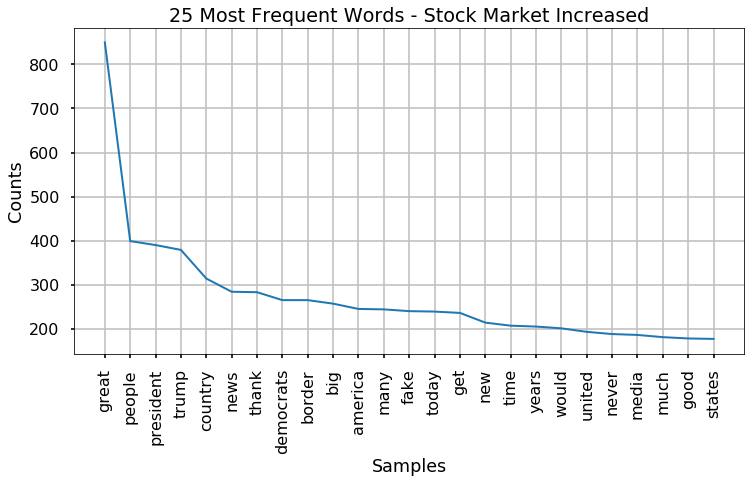

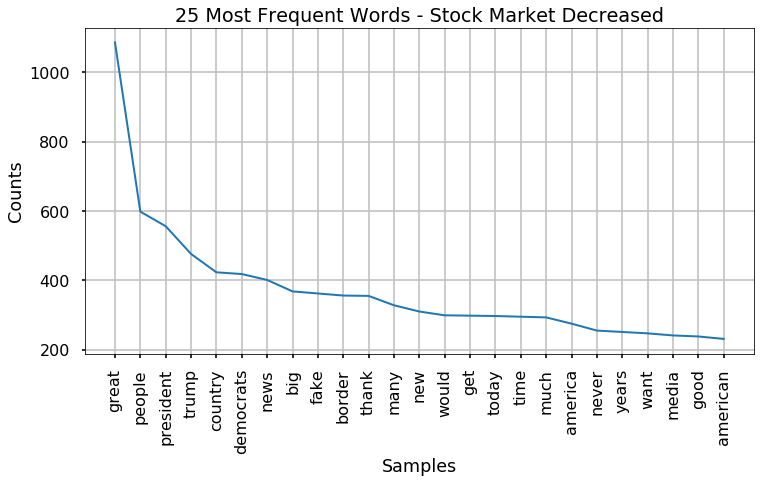

In [36]:
reload([ji])
ji.compare_freq_dists(text1=twitter_df_groups['pos']['text_tokens'],
                       label1='Stock Market Increased',
                       text2= twitter_df_groups['neg']['text_tokens'],
                       label2='Stock Market Decreased',
                       top_n=25)

In [37]:
## Clean up memory after section
for x in ['df_neg_words', 'df_pos_words', 'neg_freq_dict', 'pos_freq_dict']:

    try:
        exec(f"del {x}")
        print(f'deleted {x}')
    except:
        print(f'[!] {x} does not exist. ')

deleted df_neg_words
deleted df_pos_words
deleted neg_freq_dict
deleted pos_freq_dict


In [38]:
ji.inspect_variables(locals())

,type,size
variable,,
df,DataFrame,63121681
twitter_df,DataFrame,26165390
stock_df,DataFrame,793456
df_decomp,DataFrame,357384
stock_observed,Series,241272
idx_keep_tf,Series,83922
stock_seasonal,Series,77432
stock_trend,Series,77432
stock_residual,Series,77432


# KERAS NLP CLASSIFICATION

In [39]:
reload(ji)
ihelp_menu([ji.load_twitter_df_stock_price,ji.load_stock_price_series])

interactive(children=(Checkbox(value=False, description='show_help'), Checkbox(value=True, description='show_s…

In [40]:
## Load in twitter data and stock_price in minute resolution
twitter_df = ji.load_twitter_df_stock_price(twitter_df,
                                            get_stock_prices_per_tweet=True,
                                            price_mins_after_tweet=60)                                          

loading stock_price


,source,content,date,retweet_count,favorite_count,is_retweet,id_str,has_RT,starts_RT,content_starts_RT,...,null_results,B_ts_rounded,pre_tweet_price,mins_after_tweet,B_ts_post_tweet,post_tweet_price,delta_time,delta_price,delta_price_class,delta_price_class_int
date,,,,,,,,,,,,,,,,,,,,,
2016-12-01 14:37:57,Twitter for iPhone,My thoughts and prayers are with those affecte...,2016-12-01 14:37:57,12077,65724,False,804333718999539712,False,False,[],...,False,2016-12-01 14:38:00,93.97,60.0,2016-12-01 15:38:00,93.82,01:00:00,-0.15,neg,0
2016-12-01 22:52:10,Twitter for iPhone,Heading to U.S. Bank Arena in Cincinnati Ohio ...,2016-12-01 22:52:10,5564,31256,False,804458095569158144,False,False,[],...,False,2016-12-02 09:30:00,93.97,60.0,2016-12-02 10:30:00,94.03,01:00:00,0.06,pos,1
2016-12-02 02:45:18,Twitter for iPhone,Thank you Ohio! Together we made history – and...,2016-12-02 02:45:18,17283,72196,False,804516764562374656,False,False,[],...,False,2016-12-02 09:30:00,93.97,60.0,2016-12-02 10:30:00,94.03,01:00:00,0.06,pos,1
2016-12-03 19:09:40,Twitter for iPhone,State Treasurer John Kennedy is my choice for ...,2016-12-03 19:09:40,9800,39057,False,805126876779913216,False,False,[],...,False,2016-12-05 09:30:00,94.29,60.0,2016-12-05 10:30:00,94.46,01:00:00,0.17,pos,1
2016-12-03 19:13:01,Twitter for iPhone,Our great VPE @mike_pence is in Louisiana camp...,2016-12-03 19:13:01,9224,39351,False,805127720749383680,False,False,[],...,False,2016-12-05 09:30:00,94.29,60.0,2016-12-05 10:30:00,94.46,01:00:00,0.17,pos,1


2016-12-01 09:30:00 2019-08-23 16:00:00
2016-12-01 14:37:57 2019-08-23 14:59:05
Adding stock_price data for tweets using `get_stock_prices_for_twitter_data`...
Limiting twitter_df timeindex to match stock_price.


In [41]:
twitter_df = ji.check_for_duplicated_columns(twitter_df, remove=True)



------------------------------------------------------------
DUPLCATE COLUMNS REPORT:
------------------------------------------------------------
Duplicate columns to remove:
 -  Index(['B_ts_rounded', 'pre_tweet_price', 'mins_after_tweet',
       'B_ts_post_tweet', 'post_tweet_price', 'delta_time', 'delta_price'],
      dtype='object')

[i] Removing duplicated columns (since remove==True)
>> returning cleaned df...
>> returning original df...


In [42]:
# stop

NameError: name 'stop' is not defined

In [43]:
ji.index_report(twitter_df)



------------------------------------------------------------
INDEX REPORT:
------------------------------------------------------------
* Index Endpoints:
	2016-12-01 14:37:57 -- to -- 2019-08-23 14:59:05
* Index Freq:
	None




In [44]:
twitter_df.to_csv('data/_twitter_df_with_stock_price.csv')

## BOOKMARK- CAN LOAD CSV HERE

In [ ]:
# stop

In [55]:
## REPLACE THIS CELL WITH USE OF FULL_TWITTER_PROCESSING OR TEXT CLASS
# Import some functions directly
from functions_combined_BEST import ihelp, ihelp_menu, reload


## IMPORT STANDARD PACKAGES
import bs_ds as bs
from bs_ds.imports import *
from pprint import pprint

# Import my custom functions 
import functions_combined_BEST as ji
import my_keras_functions as jik
# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()


bs.big_pandas()
# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Reload modules in case files have been updated
reload(ji)

display.max_columns=None
display.expand_frame_repr=False
display.max_rows=None
display.max_info_columns=500
display.precision=4


In [56]:
reload(ji)
load_me=True
if load_me:
    filename = 'data/_twitter_df_with_stock_price.csv'
    twitter_df = pd.read_csv(filename,index_col=0,parse_dates=True)
    print(f'twitter_df loaded from {filename}')
    display(twitter_df.head(3))
#     print(twitter_df.columns)

ji.index_report(twitter_df)
twitter_df = ji.check_for_duplicated_columns(twitter_df)

ji.check_length_string_column(twitter_df, 'content_min_clean',return_idx=False);

twitter_df loaded from data/_twitter_df_with_stock_price.csv


,source,content,date.1,retweet_count,favorite_count,is_retweet,id_str,has_RT,starts_RT,content_starts_RT,content_cleaned,content_min_clean,content_hashtags,hashtag_strings,content_mentions,mention_strings,cleaned_stopped_content,cleaned_stopped_tokens,case_ratio,sentiment_scores,compound_score,sentiment_class,neg,neu,pos,day,time,dayofweek,B_day,B_shifted,B_time,B_dt_index,time_shift,B_dt_minutes,stock_price_results,null_results,B_ts_rounded,pre_tweet_price,mins_after_tweet,B_ts_post_tweet,post_tweet_price,delta_time,delta_price,delta_price_class,delta_price_class_int
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-12-01 14:37:57,Twitter for iPhone,My thoughts and prayers are with those affecte...,2016-12-01 14:37:57,12077,65724,False,804333718999539712,False,False,[],My thoughts and prayers are with those affecte...,My thoughts and prayers are with those affecte...,[],,[],,thoughts prayers affected tragic storms tornad...,"['thoughts', 'prayers', 'affected', 'tragic', ...",0.0391,"{'neg': 0.167, 'neu': 0.616, 'pos': 0.217, 'co...",0.3382,pos,0.167,0.616,0.217,2016-12-01,14:37:57,Thursday,2016-12-01,False,14:37:57,2016-12-01 14:37:57,0 days 00:00:00.000000000,2016-12-01 14:38:00,{'B_ts_rounded': Timestamp('2016-12-01 14:38:0...,False,2016-12-01 14:38:00,93.97,60.0,2016-12-01 15:38:00,93.82,0 days 01:00:00.000000000,-0.15,neg,0
2016-12-01 22:52:10,Twitter for iPhone,Heading to U.S. Bank Arena in Cincinnati Ohio ...,2016-12-01 22:52:10,5564,31256,False,804458095569158144,False,False,[],Heading to U.S. Bank Arena in Cincinnati Ohio ...,Heading to U.S. Bank Arena in Cincinnati Ohio ...,[],,[],,heading bank arena cincinnati ohio pm rally jo...,"['heading', 'bank', 'arena', 'cincinnati', 'oh...",0.1098,"{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'comp...",0.3595,pos,0.000,0.839,0.161,2016-12-01,22:52:10,Thursday,2016-12-01,False,22:52:10,2016-12-01 22:52:10,0 days 00:00:00.000000000,2016-12-01 22:52:00,{'B_ts_rounded': Timestamp('2016-12-02 09:30:0...,False,2016-12-02 09:30:00,93.97,60.0,2016-12-02 10:30:00,94.03,0 days 01:00:00.000000000,0.06,pos,1
2016-12-02 02:45:18,Twitter for iPhone,Thank you Ohio! Together we made history – and...,2016-12-02 02:45:18,17283,72196,False,804516764562374656,False,False,[],Thank you Ohio! Together we made history – and...,Thank you Ohio! Together we made history – and...,[],,[],,thank ohio together made history real work beg...,"['thank', 'ohio', 'together', 'made', 'history...",0.0367,"{'neg': 0.0, 'neu': 0.712, 'pos': 0.288, 'comp...",0.7568,pos,0.000,0.712,0.288,2016-12-02,02:45:18,Friday,2016-12-02,False,02:45:18,2016-12-02 02:45:18,0 days 00:00:00.000000000,2016-12-02 02:45:00,{'B_ts_rounded': Timestamp('2016-12-02 09:30:0...,False,2016-12-02 09:30:00,93.97,60.0,2016-12-02 10:30:00,94.03,0 days 01:00:00.000000000,0.06,pos,1




------------------------------------------------------------
INDEX REPORT:
------------------------------------------------------------
* Index Endpoints:
	2016-12-01 14:37:57 -- to -- 2019-08-23 14:59:05
* Index Freq:
	None




------------------------------------------------------------
DUPLCATE COLUMNS REPORT:
------------------------------------------------------------
[i] No duplicate columns.
>> returning original df...


------------------------------------------------------------
STRING LENGTH REPORT:
------------------------------------------------------------
Found 0 # of strings above cutoff of 350 chars.


,count,mean,std,min,25%,50%,75%,max
content_min_clean,9294,158.4,83.77,1,103,136,251,310


In [209]:
## Select smaller subset of twitter_df for df_tokenize
columns_for_model_0 = ['delta_price_class','delta_price','pre_tweet_price',
                       'post_tweet_price','delta_time','B_ts_rounded','B_ts_post_tweet','content',
                       'content_min_clean','cleaned_stopped_content','cleaned_stopped_tokens','delta_price_class_int']

df_tokenize=twitter_df[columns_for_model_0].copy()
df_tokenize['content_min_clean'] =   df_tokenize['content_min_clean'].apply(lambda x: x.replace('@',' ').replace('#',' '))

# df_tokenize.to_csv('assets/_twitter_df_for_model0.csv')

## Create integer version of 'delta_price_class'
# df_tokenize['delta_price_class_int']=df_tokenize['delta_price_class'].apply(lambda x: 1 if x=='pos' else 0) #y = [1 if x=='pos' else 0  for x in df_sampled['delta_price_class']]
display(df_tokenize.head(2))

class_counts = df_tokenize['delta_price_class'].value_counts()
print(class_counts)

,delta_price_class,delta_price,pre_tweet_price,post_tweet_price,delta_time,B_ts_rounded,B_ts_post_tweet,content,content_min_clean,cleaned_stopped_content,cleaned_stopped_tokens,delta_price_class_int
date,,,,,,,,,,,,
2016-12-01 14:37:57,neg,-0.15,93.97,93.82,0 days 01:00:00.000000000,2016-12-01 14:38:00,2016-12-01 15:38:00,My thoughts and prayers are with those affecte...,My thoughts and prayers are with those affecte...,thoughts prayers affected tragic storms tornad...,"['thoughts', 'prayers', 'affected', 'tragic', ...",0
2016-12-01 22:52:10,pos,0.06,93.97,94.03,0 days 01:00:00.000000000,2016-12-02 09:30:00,2016-12-02 10:30:00,Heading to U.S. Bank Arena in Cincinnati Ohio ...,Heading to U.S. Bank Arena in Cincinnati Ohio ...,heading bank arena cincinnati ohio pm rally jo...,"['heading', 'bank', 'arena', 'cincinnati', 'oh...",1


neg    5318
pos    3976
Name: delta_price_class, dtype: int64


In [210]:
# print('Class Value Counts -  Before Filtering Out >1 day delta_time')
ji.check_class_balance(df_tokenize, col='delta_price_class',note='')
print('--'*30)
ji.check_class_balance(df_tokenize, col='delta_price_class_int',note='')



----------------------------------------
CLASS VALUE COUNTS FOR COL "delta_price_class":
----------------------------------------
class by %:
 neg    0.5722
pos    0.4278
Name: delta_price_class, dtype: float64


class raw counts:
 neg    5318
pos    3976
Name: delta_price_class, dtype: int64
------------------------------------------------------------


----------------------------------------
CLASS VALUE COUNTS FOR COL "delta_price_class_int":
----------------------------------------
class by %:
 0    0.5722
1    0.4278
Name: delta_price_class_int, dtype: float64


class raw counts:
 0    5318
1    3976
Name: delta_price_class_int, dtype: int64


In [211]:
## RESAMPLING AND RESTRICTING TIME DELTAS FOR MODEL
remove_delta_time_tweets=True
undersample = True
show_tweet_versions = True

## REMOVE TWEETS BASED ON TIME BETWEEN TWEET AND STOCK PRICE VALUE
if remove_delta_time_tweets:
    ## SAMPLE ONLY TWEETS WITHIN 1 DAY OF STOCK MARKET PRICE DATA
    df_sampled = df_tokenize.loc[df_tokenize['delta_time']<'1 day']
    print(f"# of days removed by 'delta_time' = {df_tokenize.shape[0]-df_sampled.shape[0]}")

    ji.check_class_balance(df_sampled, col='delta_price_class_int')
else:
    print('[!] Skipping removing tweets by time_delta')
    df_sampled = df_tokenize

## UNDERSAMPLE FROM UNBALANCED CLASSES
if undersample:
    df_sampled = ji.undersample_df_to_match_classes(df_sampled, class_column='delta_price_class_int')
else:
    print('[!] Skipping balancing classes')

if show_tweet_versions:
    ji.display_same_tweet_diff_cols(df_sampled,
                                    columns = ['content' ,'content_min_clean',
                                               'cleaned_stopped_content',
                                               'cleaned_stopped_tokens'],as_md=True) 

# of days removed by 'delta_time' = 2419


----------------------------------------
CLASS VALUE COUNTS FOR COL "delta_price_class_int":
----------------------------------------
class by %:
 1    0.5767
0    0.4233
Name: delta_price_class_int, dtype: float64


class raw counts:
 1    3965
0    2910
Name: delta_price_class_int, dtype: int64
Initial Class Value Counts:
%:  1    0.5767
0    0.4233
Name: delta_price_class_int, dtype: float64


----------------------------------------
CLASS VALUE COUNTS FOR COL "delta_price_class_int":
----------------------------------------
class by %:
 1    0.5
0    0.5
Name: delta_price_class_int, dtype: float64


class raw counts:
 1    2910
0    2910
Name: delta_price_class_int, dtype: int64
2018-05-29T10:49:23.000000000


#### TWEET FROM 05-29-2018 10:49:23:

* **["content"] column:**<p><blockquote>***"“This investigation involved far more surveillance than we ever had any idea about. It wasn’t just a wiretap against a campaign aide...it was secretly gathering information on the Trump Campaign...people call that Spying...this is unprecedented and  scandalous.” Mollie Hemingway"***

* **["content_min_clean"] column:**<p><blockquote>***"“This investigation involved far more surveillance than we ever had any idea about. It wasn’t just a wiretap against a campaign aide...it was secretly gathering information on the Trump Campaign...people call that Spying...this is unprecedented and  scandalous.” Mollie Hemingway"***

* **["cleaned_stopped_content"] column:**<p><blockquote>***"investigation involved far surveillance ever idea wiretap campaign aide secretly gathering information trump campaign people call spying unprecedented scandalous mollie hemingway"***

* **["cleaned_stopped_tokens"] column:**<p><blockquote>***"['investigation', 'involved', 'far', 'surveillance', 'ever', 'idea', 'wiretap', 'campaign', 'aide', 'secretly', 'gathering', 'information', 'trump', 'campaign', 'people', 'call', 'spying', 'unprecedented', 'scandalous', 'mollie', 'hemingway']"***

### Word2Vec

In [200]:
# def check_y_class_balance(data=['y_train','y_test'],var_list=locals(),
#                          as_percent=True, as_raw=True):
#     if isinstance(data, list)==False:
#         data=[data]
#     if isinstance(data[0], str)==False:
#         raise Exception('Data must be strings')

#     for y in data:
#         ## CHECKING CLSS BALANCE IN Y_TEST
#         var = var_list[y]
#         df_check_class = pd.DataFrame(data=var,columns=[y])
#         ji.check_class_balance(df_check_class,y,as_percent=as_percent, as_raw=as_raw)

In [212]:
## REMOVING @ symbols, not tex FROM ADDING NEW CONTENT MIN CLEAN COL'
df_sampled['content_min_clean']=df_sampled['content_min_clean'].apply(lambda x: x.replace('@',' '))
df_sampled.head()

,delta_price_class,delta_price,pre_tweet_price,post_tweet_price,delta_time,B_ts_rounded,B_ts_post_tweet,content,content_min_clean,cleaned_stopped_content,cleaned_stopped_tokens,delta_price_class_int
date,,,,,,,,,,,,
2016-12-01 14:37:57,neg,-0.15,93.97,93.82,0 days 01:00:00.000000000,2016-12-01 14:38:00,2016-12-01 15:38:00,My thoughts and prayers are with those affecte...,My thoughts and prayers are with those affecte...,thoughts prayers affected tragic storms tornad...,"['thoughts', 'prayers', 'affected', 'tragic', ...",0
2016-12-03 19:13:01,pos,0.17,94.29,94.46,0 days 01:00:00.000000000,2016-12-05 09:30:00,2016-12-05 10:30:00,Our great VPE @mike_pence is in Louisiana camp...,Our great VPE mike_pence is in Louisiana camp...,great vpe louisiana campaigning john kennedy u...,"['great', 'vpe', 'louisiana', 'campaigning', '...",1
2016-12-05 13:53:11,neg,-0.06,94.33,94.27,0 days 01:00:00.000000000,2016-12-05 13:53:00,2016-12-05 14:53:00,I am thrilled to nominate Dr. @RealBenCarson a...,I am thrilled to nominate Dr. RealBenCarson a...,thrilled nominate dr next secretary us dept ho...,"['thrilled', 'nominate', 'dr', 'next', 'secret...",0
2016-12-05 23:06:43,neg,-0.18,94.44,94.26,0 days 01:00:00.000000000,2016-12-06 09:30:00,2016-12-06 10:30:00,#ThankYouTour2016 12/6- North Carolinahttps://...,ThankYouTour2016 12/6- North Carolina /8- Iow...,north carolina iowa michiga,"['north', 'carolina', 'iowa', 'michiga']",0
2016-12-06 16:45:27,pos,0.32,94.76,95.08,0 days 01:00:00.000000000,2016-12-07 09:30:00,2016-12-07 10:30:00,Join me tonight in Fayetteville North Carolina...,Join me tonight in Fayetteville North Carolina...,join tonight fayetteville north carolina pm ti...,"['join', 'tonight', 'fayetteville', 'north', '...",1


In [286]:
check_df = df_tokenize[['cleaned_stopped_content','delta_price_class']].head()

check_df.loc[check_df.apply(['cleaned_stopped_content']

,cleaned_stopped_content,delta_price_class
date,,
2016-12-01 14:37:57,thoughts prayers affected tragic storms tornad...,neg
2016-12-01 22:52:10,heading bank arena cincinnati ohio pm rally jo...,pos
2016-12-02 02:45:18,thank ohio together made history real work beg...,pos
2016-12-03 19:09:40,state treasurer john kennedy choice us senator...,pos
2016-12-03 19:13:01,great vpe louisiana campaigning john kennedy u...,pos


In [273]:
ji.display_same_tweet_diff_cols(df_tokenize,columns=['content_min_clean','cleaned_stopped_content'], as_md=True)
# df_tokenize['cleaned_stopped_content'][:10]

2019-02-04T20:13:35.000000000


#### TWEET FROM 02-04-2019 20:13:35:

* **["content_min_clean"] column:**<p><blockquote>***"I am pleased to announce that David Bernhardt Acting Secretary of the Interior will be nominated as Secretary of the Interior. David has done a fantastic job from the day he arrived and we look forward to having his nomination officially confirmed!"***

* **["cleaned_stopped_content"] column:**<p><blockquote>***"pleased announce david bernhardt acting secretary interior nominated secretary interior david done fantastic job day arrived look forward nomination officially confirmed"***

In [284]:
# ji.check_length_string_column(df_tokenize,'cleaned_stopped_content')
df_tokenize.dtypes

delta_price_class           object
delta_price                float64
pre_tweet_price            float64
post_tweet_price           float64
delta_time                  object
B_ts_rounded                object
B_ts_post_tweet             object
content                     object
content_min_clean           object
cleaned_stopped_content     object
cleaned_stopped_tokens      object
delta_price_class_int        int64
dtype: object

In [287]:
from gensim.models import Word2Vec, WordEmbeddingSimilarityIndex

# def prep_w2v(x):
#     from nltk import regexp_tokenize
#     x.lower()
#     regex_pattern ="([a-zA-Z]+(?:'[a-z]+)?)
#     regexp_tokenize(x,regex_pattern)
    
    
w2vec = Word2Vec(sentences = df_tokenize['cleaned_stopped_tokens'].apply(lambda x: regexp_tokenize(x,regex_pattern)).values,
                 window=3,min_count=2,sg=1, 
                hs=0,negative=5)

In [289]:
w2vec.most_similar_cosmul(positive=['trump'],negative=['obama'])
# ihelp(Word2Vec)

[('honor', 1.0869218111038208),
 ('today', 1.0714952945709229),
 ('great', 1.065768837928772),
 ('welcome', 1.0629984140396118),
 ('tonight', 1.0629802942276),
 ('prime', 1.0598481893539429),
 ('thank', 1.0596585273742676),
 ('minister', 1.0537693500518799),
 ('white', 1.0521926879882812),
 ('state', 1.04923677444458)]

In [294]:
ihelp(Word2Vec)

------------------------------------------------------------------------------------
------ HELP ------------------------------------------------------------------------

Help on class Word2Vec in module gensim.models.word2vec:

class Word2Vec(gensim.models.base_any2vec.BaseWordEmbeddingsModel)
 |  Train, use and evaluate neural networks described in https://code.google.com/p/word2vec/.
 |  
 |  Once you're finished training a model (=no more updates, only querying)
 |  store and use only the :class:`~gensim.models.keyedvectors.KeyedVectors` instance in `self.wv` to reduce memory.
 |  
 |  The model can be stored/loaded via its :meth:`~gensim.models.word2vec.Word2Vec.save` and
 |  :meth:`~gensim.models.word2vec.Word2Vec.load` methods.
 |  
 |  The trained word vectors can also be stored/loaded from a format compatible with the
 |  original word2vec implementation via `self.wv.save_word2vec_format`
 |  and :meth:`gensim.models.keyedvectors.KeyedVectors.load_word2vec_format`.
 |  
 |  So

```python
class Word2Vec(BaseWordEmbeddingsModel):
    """Train, use and evaluate neural networks described in https://code.google.com/p/word2vec/.

    Once you're finished training a model (=no more updates, only querying)
    store and use only the :class:`~gensim.models.keyedvectors.KeyedVectors` instance in `self.wv` to reduce memory.

    The model can be stored/loaded via its :meth:`~gensim.models.word2vec.Word2Vec.save` and
    :meth:`~gensim.models.word2vec.Word2Vec.load` methods.

    The trained word vectors can also be stored/loaded from a format compatible with the
    original word2vec implementation via `self.wv.save_word2vec_format`
    and :meth:`gensim.models.keyedvectors.KeyedVectors.load_word2vec_format`.

    Some important attributes are the following:

    Attributes
    ----------
    wv : :class:`~gensim.models.keyedvectors.Word2VecKeyedVectors`
        This object essentially contains the mapping between words and embeddings. After training, it can be used
        directly to query those embeddings in various ways. See the module level docstring for examples.

    vocabulary : :class:`~gensim.models.word2vec.Word2VecVocab`
        This object represents the vocabulary (sometimes called Dictionary in gensim) of the model.
        Besides keeping track of all unique words, this object provides extra functionality, such as
        constructing a huffman tree (frequent words are closer to the root), or discarding extremely rare words.

    trainables : :class:`~gensim.models.word2vec.Word2VecTrainables`
        This object represents the inner shallow neural network used to train the embeddings. The semantics of the
        network differ slightly in the two available training modes (CBOW or SG) but you can think of it as a NN with
        a single projection and hidden layer which we train on the corpus. The weights are then used as our embeddings
        (which means that the size of the hidden layer is equal to the number of features `self.size`).

    """

    def __init__(self, sentences=None, corpus_file=None, size=100, alpha=0.025, window=5, min_count=5,
                 max_vocab_size=None, sample=1e-3, seed=1, workers=3, min_alpha=0.0001,
                 sg=0, hs=0, negative=5, ns_exponent=0.75, cbow_mean=1, hashfxn=hash, iter=5, null_word=0,
                 trim_rule=None, sorted_vocab=1, batch_words=MAX_WORDS_IN_BATCH, compute_loss=False, callbacks=(),
                 max_final_vocab=None):
        """

        Parameters
        ----------
        sentences : iterable of iterables, optional
            The `sentences` iterable can be simply a list of lists of tokens, but for larger corpora,
            consider an iterable that streams the sentences directly from disk/network.
            See :class:`~gensim.models.word2vec.BrownCorpus`, :class:`~gensim.models.word2vec.Text8Corpus`
            or :class:`~gensim.models.word2vec.LineSentence` in :mod:`~gensim.models.word2vec` module for such examples.
            See also the `tutorial on data streaming in Python
            <https://rare-technologies.com/data-streaming-in-python-generators-iterators-iterables/>`_.
            If you don't supply `sentences`, the model is left uninitialized -- use if you plan to initialize it
            in some other way.
        corpus_file : str, optional
            Path to a corpus file in :class:`~gensim.models.word2vec.LineSentence` format.
            You may use this argument instead of `sentences` to get performance boost. Only one of `sentences` or
            `corpus_file` arguments need to be passed (or none of them, in that case, the model is left uninitialized).
        size : int, optional
            Dimensionality of the word vectors.
        window : int, optional
            Maximum distance between the current and predicted word within a sentence.
        min_count : int, optional
            Ignores all words with total frequency lower than this.
        workers : int, optional
            Use these many worker threads to train the model (=faster training with multicore machines).
        sg : {0, 1}, optional
            Training algorithm: 1 for skip-gram; otherwise CBOW.
        hs : {0, 1}, optional
            If 1, hierarchical softmax will be used for model training.
            If 0, and `negative` is non-zero, negative sampling will be used.
        negative : int, optional
            If > 0, negative sampling will be used, the int for negative specifies how many "noise words"
            should be drawn (usually between 5-20).
            If set to 0, no negative sampling is used.
        ns_exponent : float, optional
            The exponent used to shape the negative sampling distribution. A value of 1.0 samples exactly in proportion
            to the frequencies, 0.0 samples all words equally, while a negative value samples low-frequency words more
            than high-frequency words. The popular default value of 0.75 was chosen by the original Word2Vec paper.
            More recently, in https://arxiv.org/abs/1804.04212, Caselles-Dupré, Lesaint, & Royo-Letelier suggest that
            other values may perform better for recommendation applications.
        cbow_mean : {0, 1}, optional
            If 0, use the sum of the context word vectors. If 1, use the mean, only applies when cbow is used.
        alpha : float, optional
            The initial learning rate.
        min_alpha : float, optional
            Learning rate will linearly drop to `min_alpha` as training progresses.
        seed : int, optional
            Seed for the random number generator. Initial vectors for each word are seeded with a hash of
            the concatenation of word + `str(seed)`. Note that for a fully deterministically-reproducible run,
            you must also limit the model to a single worker thread (`workers=1`), to eliminate ordering jitter
            from OS thread scheduling. (In Python 3, reproducibility between interpreter launches also requires
            use of the `PYTHONHASHSEED` environment variable to control hash randomization).
        max_vocab_size : int, optional
            Limits the RAM during vocabulary building; if there are more unique
            words than this, then prune the infrequent ones. Every 10 million word types need about 1GB of RAM.
            Set to `None` for no limit.
        max_final_vocab : int, optional
            Limits the vocab to a target vocab size by automatically picking a matching min_count. If the specified
            min_count is more than the calculated min_count, the specified min_count will be used.
            Set to `None` if not required.
        sample : float, optional
            The threshold for configuring which higher-frequency words are randomly downsampled,
            useful range is (0, 1e-5).
        hashfxn : function, optional
            Hash function to use to randomly initialize weights, for increased training reproducibility.
        iter : int, optional
            Number of iterations (epochs) over the corpus.
        trim_rule : function, optional
            Vocabulary trimming rule, specifies whether certain words should remain in the vocabulary,
            be trimmed away, or handled using the default (discard if word count < min_count).
            Can be None (min_count will be used, look to :func:`~gensim.utils.keep_vocab_item`),
            or a callable that accepts parameters (word, count, min_count) and returns either
            :attr:`gensim.utils.RULE_DISCARD`, :attr:`gensim.utils.RULE_KEEP` or :attr:`gensim.utils.RULE_DEFAULT`.
            The rule, if given, is only used to prune vocabulary during build_vocab() and is not stored as part of the
            model.

            The input parameters are of the following types:
                * `word` (str) - the word we are examining
                * `count` (int) - the word's frequency count in the corpus
                * `min_count` (int) - the minimum count threshold.
        sorted_vocab : {0, 1}, optional
            If 1, sort the vocabulary by descending frequency before assigning word indexes.
            See :meth:`~gensim.models.word2vec.Word2VecVocab.sort_vocab()`.
        batch_words : int, optional
            Target size (in words) for batches of examples passed to worker threads (and
            thus cython routines).(Larger batches will be passed if individual
            texts are longer than 10000 words, but the standard cython code truncates to that maximum.)
        compute_loss: bool, optional
            If True, computes and stores loss value which can be retrieved using
            :meth:`~gensim.models.word2vec.Word2Vec.get_latest_training_loss`.
        callbacks : iterable of :class:`~gensim.models.callbacks.CallbackAny2Vec`, optional
            Sequence of callbacks to be executed at specific stages during training.

        Examples
        --------
        Initialize and train a :class:`~gensim.models.word2vec.Word2Vec` model

        .. sourcecode:: pycon

            >>> from gensim.models import Word2Vec
            >>> sentences = [["cat", "say", "meow"], ["dog", "say", "woof"]]
            >>> model = Word2Vec(sentences, min_count=1)

        """
        self.max_final_vocab = max_final_vocab

        self.callbacks = callbacks
        self.load = call_on_class_only

        self.wv = Word2VecKeyedVectors(size)
        self.vocabulary = Word2VecVocab(
            max_vocab_size=max_vocab_size, min_count=min_count, sample=sample, sorted_vocab=bool(sorted_vocab),
            null_word=null_word, max_final_vocab=max_final_vocab, ns_exponent=ns_exponent)
        self.trainables = Word2VecTrainables(seed=seed, vector_size=size, hashfxn=hashfxn)

        super(Word2Vec, self).__init__(
            sentences=sentences, corpus_file=corpus_file, workers=workers, vector_size=size, epochs=iter,
            callbacks=callbacks, batch_words=batch_words, trim_rule=trim_rule, sg=sg, alpha=alpha, window=window,
            seed=seed, hs=hs, negative=negative, cbow_mean=cbow_mean, min_alpha=min_alpha, compute_loss=compute_loss,
            fast_version=FAST_VERSION)

    def _do_train_epoch(self, corpus_file, thread_id, offset, cython_vocab, thread_private_mem, cur_epoch,
                        total_examples=None, total_words=None, **kwargs):
        work, neu1 = thread_private_mem

        if self.sg:
            examples, tally, raw_tally = train_epoch_sg(self, corpus_file, offset, cython_vocab, cur_epoch,
                                                        total_examples, total_words, work, neu1, self.compute_loss)
        else:
            examples, tally, raw_tally = train_epoch_cbow(self, corpus_file, offset, cython_vocab, cur_epoch,
                                                          total_examples, total_words, work, neu1, self.compute_loss)

        return examples, tally, raw_tally

    def _do_train_job(self, sentences, alpha, inits):
        """Train the model on a single batch of sentences.

        Parameters
        ----------
        sentences : iterable of list of str
            Corpus chunk to be used in this training batch.
        alpha : float
            The learning rate used in this batch.
        inits : (np.ndarray, np.ndarray)
            Each worker threads private work memory.

        Returns
        -------
        (int, int)
             2-tuple (effective word count after ignoring unknown words and sentence length trimming, total word count).

        """
        work, neu1 = inits
        tally = 0
        if self.sg:
            tally += train_batch_sg(self, sentences, alpha, work, self.compute_loss)
        else:
            tally += train_batch_cbow(self, sentences, alpha, work, neu1, self.compute_loss)
        return tally, self._raw_word_count(sentences)

    def _clear_post_train(self):
        """Remove all L2-normalized word vectors from the model."""
        self.wv.vectors_norm = None

    def _set_train_params(self, **kwargs):
        if 'compute_loss' in kwargs:
            self.compute_loss = kwargs['compute_loss']
        self.running_training_loss = 0

    def train(self, sentences=None, corpus_file=None, total_examples=None, total_words=None,
              epochs=None, start_alpha=None, end_alpha=None, word_count=0,
              queue_factor=2, report_delay=1.0, compute_loss=False, callbacks=()):
        """Update the model's neural weights from a sequence of sentences.

        Notes
        -----
        To support linear learning-rate decay from (initial) `alpha` to `min_alpha`, and accurate
        progress-percentage logging, either `total_examples` (count of sentences) or `total_words` (count of
        raw words in sentences) **MUST** be provided. If `sentences` is the same corpus
        that was provided to :meth:`~gensim.models.word2vec.Word2Vec.build_vocab` earlier,
        you can simply use `total_examples=self.corpus_count`.

        Warnings
        --------
        To avoid common mistakes around the model's ability to do multiple training passes itself, an
        explicit `epochs` argument **MUST** be provided. In the common and recommended case
        where :meth:`~gensim.models.word2vec.Word2Vec.train` is only called once, you can set `epochs=self.iter`.

        Parameters
        ----------
        sentences : iterable of list of str
            The `sentences` iterable can be simply a list of lists of tokens, but for larger corpora,
            consider an iterable that streams the sentences directly from disk/network.
            See :class:`~gensim.models.word2vec.BrownCorpus`, :class:`~gensim.models.word2vec.Text8Corpus`
            or :class:`~gensim.models.word2vec.LineSentence` in :mod:`~gensim.models.word2vec` module for such examples.
            See also the `tutorial on data streaming in Python
            <https://rare-technologies.com/data-streaming-in-python-generators-iterators-iterables/>`_.
        corpus_file : str, optional
            Path to a corpus file in :class:`~gensim.models.word2vec.LineSentence` format.
            You may use this argument instead of `sentences` to get performance boost. Only one of `sentences` or
            `corpus_file` arguments need to be passed (not both of them).
        total_examples : int
            Count of sentences.
        total_words : int
            Count of raw words in sentences.
        epochs : int
            Number of iterations (epochs) over the corpus.
        start_alpha : float, optional
            Initial learning rate. If supplied, replaces the starting `alpha` from the constructor,
            for this one call to`train()`.
            Use only if making multiple calls to `train()`, when you want to manage the alpha learning-rate yourself
            (not recommended).
        end_alpha : float, optional
            Final learning rate. Drops linearly from `start_alpha`.
            If supplied, this replaces the final `min_alpha` from the constructor, for this one call to `train()`.
            Use only if making multiple calls to `train()`, when you want to manage the alpha learning-rate yourself
            (not recommended).
        word_count : int, optional
            Count of words already trained. Set this to 0 for the usual
            case of training on all words in sentences.
        queue_factor : int, optional
            Multiplier for size of queue (number of workers * queue_factor).
        report_delay : float, optional
            Seconds to wait before reporting progress.
        compute_loss: bool, optional
            If True, computes and stores loss value which can be retrieved using
            :meth:`~gensim.models.word2vec.Word2Vec.get_latest_training_loss`.
        callbacks : iterable of :class:`~gensim.models.callbacks.CallbackAny2Vec`, optional
            Sequence of callbacks to be executed at specific stages during training.

        Examples
        --------
        .. sourcecode:: pycon

            >>> from gensim.models import Word2Vec
            >>> sentences = [["cat", "say", "meow"], ["dog", "say", "woof"]]
            >>>
            >>> model = Word2Vec(min_count=1)
            >>> model.build_vocab(sentences)  # prepare the model vocabulary
            >>> model.train(sentences, total_examples=model.corpus_count, epochs=model.iter)  # train word vectors
            (1, 30)

        """
        return super(Word2Vec, self).train(
            sentences=sentences, corpus_file=corpus_file, total_examples=total_examples, total_words=total_words,
            epochs=epochs, start_alpha=start_alpha, end_alpha=end_alpha, word_count=word_count,
            queue_factor=queue_factor, report_delay=report_delay, compute_loss=compute_loss, callbacks=callbacks)

    def score(self, sentences, total_sentences=int(1e6), chunksize=100, queue_factor=2, report_delay=1):
        """Score the log probability for a sequence of sentences.
        This does not change the fitted model in any way (see :meth:`~gensim.models.word2vec.Word2Vec.train` for that).

        Gensim has currently only implemented score for the hierarchical softmax scheme,
        so you need to have run word2vec with `hs=1` and `negative=0` for this to work.

        Note that you should specify `total_sentences`; you'll run into problems if you ask to
        score more than this number of sentences but it is inefficient to set the value too high.

        See the `article by Matt Taddy: "Document Classification by Inversion of Distributed Language Representations"
        <https://arxiv.org/pdf/1504.07295.pdf>`_ and the
        `gensim demo <https://github.com/piskvorky/gensim/blob/develop/docs/notebooks/deepir.ipynb>`_ for examples of
        how to use such scores in document classification.

        Parameters
        ----------
        sentences : iterable of list of str
            The `sentences` iterable can be simply a list of lists of tokens, but for larger corpora,
            consider an iterable that streams the sentences directly from disk/network.
            See :class:`~gensim.models.word2vec.BrownCorpus`, :class:`~gensim.models.word2vec.Text8Corpus`
            or :class:`~gensim.models.word2vec.LineSentence` in :mod:`~gensim.models.word2vec` module for such examples.
        total_sentences : int, optional
            Count of sentences.
        chunksize : int, optional
            Chunksize of jobs
        queue_factor : int, optional
            Multiplier for size of queue (number of workers * queue_factor).
        report_delay : float, optional
            Seconds to wait before reporting progress.

        """
        if FAST_VERSION < 0:
            warnings.warn(
                "C extension compilation failed, scoring will be slow. "
                "Install a C compiler and reinstall gensim for fastness."
            )

        logger.info(
            "scoring sentences with %i workers on %i vocabulary and %i features, "
            "using sg=%s hs=%s sample=%s and negative=%s",
            self.workers, len(self.wv.vocab), self.trainables.layer1_size, self.sg, self.hs,
            self.vocabulary.sample, self.negative
        )

        if not self.wv.vocab:
            raise RuntimeError("you must first build vocabulary before scoring new data")

        if not self.hs:
            raise RuntimeError(
                "We have currently only implemented score for the hierarchical softmax scheme, "
                "so you need to have run word2vec with hs=1 and negative=0 for this to work."
            )

        def worker_loop():
            """Compute log probability for each sentence, lifting lists of sentences from the jobs queue."""
            work = zeros(1, dtype=REAL)  # for sg hs, we actually only need one memory loc (running sum)
            neu1 = matutils.zeros_aligned(self.trainables.layer1_size, dtype=REAL)
            while True:
                job = job_queue.get()
                if job is None:  # signal to finish
                    break
                ns = 0
                for sentence_id, sentence in job:
                    if sentence_id >= total_sentences:
                        break
                    if self.sg:
                        score = score_sentence_sg(self, sentence, work)
                    else:
                        score = score_sentence_cbow(self, sentence, work, neu1)
                    sentence_scores[sentence_id] = score
                    ns += 1
                progress_queue.put(ns)  # report progress

        start, next_report = default_timer(), 1.0
        # buffer ahead only a limited number of jobs.. this is the reason we can't simply use ThreadPool :(
        job_queue = Queue(maxsize=queue_factor * self.workers)
        progress_queue = Queue(maxsize=(queue_factor + 1) * self.workers)

        workers = [threading.Thread(target=worker_loop) for _ in range(self.workers)]
        for thread in workers:
            thread.daemon = True  # make interrupting the process with ctrl+c easier
            thread.start()

        sentence_count = 0
        sentence_scores = matutils.zeros_aligned(total_sentences, dtype=REAL)

        push_done = False
        done_jobs = 0
        jobs_source = enumerate(utils.grouper(enumerate(sentences), chunksize))

        # fill jobs queue with (id, sentence) job items
        while True:
            try:
                job_no, items = next(jobs_source)
                if (job_no - 1) * chunksize > total_sentences:
                    logger.warning(
                        "terminating after %i sentences (set higher total_sentences if you want more).",
                        total_sentences
                    )
                    job_no -= 1
                    raise StopIteration()
                logger.debug("putting job #%i in the queue", job_no)
                job_queue.put(items)
            except StopIteration:
                logger.info("reached end of input; waiting to finish %i outstanding jobs", job_no - done_jobs + 1)
                for _ in range(self.workers):
                    job_queue.put(None)  # give the workers heads up that they can finish -- no more work!
                push_done = True
            try:
                while done_jobs < (job_no + 1) or not push_done:
                    ns = progress_queue.get(push_done)  # only block after all jobs pushed
                    sentence_count += ns
                    done_jobs += 1
                    elapsed = default_timer() - start
                    if elapsed >= next_report:
                        logger.info(
                            "PROGRESS: at %.2f%% sentences, %.0f sentences/s",
                            100.0 * sentence_count, sentence_count / elapsed
                        )
                        next_report = elapsed + report_delay  # don't flood log, wait report_delay seconds
                else:
                    # loop ended by job count; really done
                    break
            except Empty:
                pass  # already out of loop; continue to next push

        elapsed = default_timer() - start
        self.clear_sims()
        logger.info(
            "scoring %i sentences took %.1fs, %.0f sentences/s",
            sentence_count, elapsed, sentence_count / elapsed
        )
        return sentence_scores[:sentence_count]

    def clear_sims(self):
        """Remove all L2-normalized word vectors from the model, to free up memory.

        You can recompute them later again using the :meth:`~gensim.models.word2vec.Word2Vec.init_sims` method.

        """
        self.wv.vectors_norm = None

    def intersect_word2vec_format(self, fname, lockf=0.0, binary=False, encoding='utf8', unicode_errors='strict'):
        """Merge in an input-hidden weight matrix loaded from the original C word2vec-tool format,
        where it intersects with the current vocabulary.

        No words are added to the existing vocabulary, but intersecting words adopt the file's weights, and
        non-intersecting words are left alone.

        Parameters
        ----------
        fname : str
            The file path to load the vectors from.
        lockf : float, optional
            Lock-factor value to be set for any imported word-vectors; the
            default value of 0.0 prevents further updating of the vector during subsequent
            training. Use 1.0 to allow further training updates of merged vectors.
        binary : bool, optional
            If True, `fname` is in the binary word2vec C format.
        encoding : str, optional
            Encoding of `text` for `unicode` function (python2 only).
        unicode_errors : str, optional
            Error handling behaviour, used as parameter for `unicode` function (python2 only).

        """
        overlap_count = 0
        logger.info("loading projection weights from %s", fname)
        with utils.smart_open(fname) as fin:
            header = utils.to_unicode(fin.readline(), encoding=encoding)
            vocab_size, vector_size = (int(x) for x in header.split())  # throws for invalid file format
            if not vector_size == self.wv.vector_size:
                raise ValueError("incompatible vector size %d in file %s" % (vector_size, fname))
                # TOCONSIDER: maybe mismatched vectors still useful enough to merge (truncating/padding)?
            if binary:
                binary_len = dtype(REAL).itemsize * vector_size
                for _ in range(vocab_size):
                    # mixed text and binary: read text first, then binary
                    word = []
                    while True:
                        ch = fin.read(1)
                        if ch == b' ':
                            break
                        if ch != b'\n':  # ignore newlines in front of words (some binary files have)
                            word.append(ch)
                    word = utils.to_unicode(b''.join(word), encoding=encoding, errors=unicode_errors)
                    weights = fromstring(fin.read(binary_len), dtype=REAL)
                    if word in self.wv.vocab:
                        overlap_count += 1
                        self.wv.vectors[self.wv.vocab[word].index] = weights
                        self.trainables.vectors_lockf[self.wv.vocab[word].index] = lockf  # lock-factor: 0.0=no changes
            else:
                for line_no, line in enumerate(fin):
                    parts = utils.to_unicode(line.rstrip(), encoding=encoding, errors=unicode_errors).split(" ")
                    if len(parts) != vector_size + 1:
                        raise ValueError("invalid vector on line %s (is this really the text format?)" % line_no)
                    word, weights = parts[0], [REAL(x) for x in parts[1:]]
                    if word in self.wv.vocab:
                        overlap_count += 1
                        self.wv.vectors[self.wv.vocab[word].index] = weights
                        self.trainables.vectors_lockf[self.wv.vocab[word].index] = lockf  # lock-factor: 0.0=no changes
        logger.info("merged %d vectors into %s matrix from %s", overlap_count, self.wv.vectors.shape, fname)

    @deprecated("Method will be removed in 4.0.0, use self.wv.__getitem__() instead")
    def __getitem__(self, words):
        """Deprecated. Use `self.wv.__getitem__` instead.
        Refer to the documentation for :meth:`~gensim.models.keyedvectors.Word2VecKeyedVectors.__getitem__`.

        """
        return self.wv.__getitem__(words)

    @deprecated("Method will be removed in 4.0.0, use self.wv.__contains__() instead")
    def __contains__(self, word):
        """Deprecated. Use `self.wv.__contains__` instead.
        Refer to the documentation for :meth:`~gensim.models.keyedvectors.Word2VecKeyedVectors.__contains__`.

        """
        return self.wv.__contains__(word)

    def predict_output_word(self, context_words_list, topn=10):
        """Get the probability distribution of the center word given context words.

        Parameters
        ----------
        context_words_list : list of str
            List of context words.
        topn : int, optional
            Return `topn` words and their probabilities.

        Returns
        -------
        list of (str, float)
            `topn` length list of tuples of (word, probability).

        """
        if not self.negative:
            raise RuntimeError(
                "We have currently only implemented predict_output_word for the negative sampling scheme, "
                "so you need to have run word2vec with negative > 0 for this to work."
            )

        if not hasattr(self.wv, 'vectors') or not hasattr(self.trainables, 'syn1neg'):
            raise RuntimeError("Parameters required for predicting the output words not found.")

        word_vocabs = [self.wv.vocab[w] for w in context_words_list if w in self.wv.vocab]
        if not word_vocabs:
            warnings.warn("All the input context words are out-of-vocabulary for the current model.")
            return None

        word2_indices = [word.index for word in word_vocabs]

        l1 = np_sum(self.wv.vectors[word2_indices], axis=0)
        if word2_indices and self.cbow_mean:
            l1 /= len(word2_indices)

        # propagate hidden -> output and take softmax to get probabilities
        prob_values = exp(dot(l1, self.trainables.syn1neg.T))
        prob_values /= sum(prob_values)
        top_indices = matutils.argsort(prob_values, topn=topn, reverse=True)
        # returning the most probable output words with their probabilities
        return [(self.wv.index2word[index1], prob_values[index1]) for index1 in top_indices]

    def init_sims(self, replace=False):
        """Deprecated. Use `self.wv.init_sims` instead.
        See :meth:`~gensim.models.keyedvectors.Word2VecKeyedVectors.init_sims`.

        """
        if replace and hasattr(self.trainables, 'syn1'):
            del self.trainables.syn1
        return self.wv.init_sims(replace)

    def reset_from(self, other_model):
        """Borrow shareable pre-built structures from `other_model` and reset hidden layer weights.

        Structures copied are:
            * Vocabulary
            * Index to word mapping
            * Cumulative frequency table (used for negative sampling)
            * Cached corpus length

        Useful when testing multiple models on the same corpus in parallel.

        Parameters
        ----------
        other_model : :class:`~gensim.models.word2vec.Word2Vec`
            Another model to copy the internal structures from.

        """
        self.wv.vocab = other_model.wv.vocab
        self.wv.index2word = other_model.wv.index2word
        self.vocabulary.cum_table = other_model.vocabulary.cum_table
        self.corpus_count = other_model.corpus_count
        self.trainables.reset_weights(self.hs, self.negative, self.wv)

    @staticmethod
    def log_accuracy(section):
        """Deprecated. Use `self.wv.log_accuracy` instead.
        See :meth:`~gensim.models.word2vec.Word2VecKeyedVectors.log_accuracy`.

        """
        return Word2VecKeyedVectors.log_accuracy(section)

    @deprecated("Method will be removed in 4.0.0, use self.wv.evaluate_word_analogies() instead")
    def accuracy(self, questions, restrict_vocab=30000, most_similar=None, case_insensitive=True):
        """Deprecated. Use `self.wv.accuracy` instead.
        See :meth:`~gensim.models.word2vec.Word2VecKeyedVectors.accuracy`.

        """
        most_similar = most_similar or Word2VecKeyedVectors.most_similar
        return self.wv.accuracy(questions, restrict_vocab, most_similar, case_insensitive)

    def __str__(self):
        """Human readable representation of the model's state.

        Returns
        -------
        str
            Human readable representation of the model's state, including the vocabulary size, vector size
            and learning rate.

        """
        return "%s(vocab=%s, size=%s, alpha=%s)" % (
            self.__class__.__name__, len(self.wv.index2word), self.wv.vector_size, self.alpha
        )

    def delete_temporary_training_data(self, replace_word_vectors_with_normalized=False):
        """Discard parameters that are used in training and scoring, to save memory.

        Warnings
        --------
        Use only if you're sure you're done training a model.

        Parameters
        ----------
        replace_word_vectors_with_normalized : bool, optional
            If True, forget the original (not normalized) word vectors and only keep
            the L2-normalized word vectors, to save even more memory.

        """
        if replace_word_vectors_with_normalized:
            self.init_sims(replace=True)
        self._minimize_model()

    def save(self, *args, **kwargs):
        """Save the model.
        This saved model can be loaded again using :func:`~gensim.models.word2vec.Word2Vec.load`, which supports
        online training and getting vectors for vocabulary words.

        Parameters
        ----------
        fname : str
            Path to the file.

        """
        # don't bother storing the cached normalized vectors, recalculable table
        kwargs['ignore'] = kwargs.get('ignore', ['vectors_norm', 'cum_table'])
        super(Word2Vec, self).save(*args, **kwargs)

    def get_latest_training_loss(self):
        """Get current value of the training loss.

        Returns
        -------
        float
            Current training loss.

        """
        return self.running_training_loss

    @deprecated(
        "Method will be removed in 4.0.0, keep just_word_vectors = model.wv to retain just the KeyedVectors instance"
    )
    def _minimize_model(self, save_syn1=False, save_syn1neg=False, save_vectors_lockf=False):
        if save_syn1 and save_syn1neg and save_vectors_lockf:
            return
        if hasattr(self.trainables, 'syn1') and not save_syn1:
            del self.trainables.syn1
        if hasattr(self.trainables, 'syn1neg') and not save_syn1neg:
            del self.trainables.syn1neg
        if hasattr(self.trainables, 'vectors_lockf') and not save_vectors_lockf:
            del self.trainables.vectors_lockf
        self.model_trimmed_post_training = True

    @classmethod
    def load_word2vec_format(
            cls, fname, fvocab=None, binary=False, encoding='utf8', unicode_errors='strict',
            limit=None, datatype=REAL):
        """Deprecated. Use :meth:`gensim.models.KeyedVectors.load_word2vec_format` instead."""
        raise DeprecationWarning("Deprecated. Use gensim.models.KeyedVectors.load_word2vec_format instead.")

    def save_word2vec_format(self, fname, fvocab=None, binary=False):
        """Deprecated. Use `model.wv.save_word2vec_format` instead.
        See :meth:`gensim.models.KeyedVectors.save_word2vec_format`.

        """
        raise DeprecationWarning("Deprecated. Use model.wv.save_word2vec_format instead.")

    @classmethod
    def load(cls, *args, **kwargs):
        """Load a previously saved :class:`~gensim.models.word2vec.Word2Vec` model.

        See Also
        --------
        :meth:`~gensim.models.word2vec.Word2Vec.save`
            Save model.

        Parameters
        ----------
        fname : str
            Path to the saved file.

        Returns
        -------
        :class:`~gensim.models.word2vec.Word2Vec`
            Loaded model.

        """
        try:
            model = super(Word2Vec, cls).load(*args, **kwargs)

            # for backward compatibility for `max_final_vocab` feature
            if not hasattr(model, 'max_final_vocab'):
                model.max_final_vocab = None
                model.vocabulary.max_final_vocab = None

            return model
        except AttributeError:
            logger.info('Model saved using code from earlier Gensim Version. Re-loading old model in a compatible way.')
            from gensim.models.deprecated.word2vec import load_old_word2vec
            return load_old_word2vec(*args, **kwargs)

```

In [297]:
reload(ji)

In [304]:
########################################################################################    
## FITING WORD2VEC AND TOKENIZER    
text_column='cleaned_stopped_tokens'

## using df_tokenize for full body of a text for word2vec
w2v_model = ji.make_word2vec_model(df_tokenize,text_column=text_column,
                                   window=4, min_count=1, 
                                   return_full=False,**{'sg':1,
                                                       'hs':0,
                                                       'negative':5,
                                                       'ns_exponent':0.75})

## Get X_sequences and y data
tokenizer, X_sequences = ji.get_tokenizer_and_text_sequences(w2v_model, df_sampled[text_column])
print('X_sequences shape=',X_sequences.shape)
y = df_sampled['delta_price_class_int'].values


## Get training/test split
X_train, X_test, y_train, y_test = ji.train_test_val_split(X_sequences, y, test_size=0.1, val_size=0)

check_y_class_balance(data=['y_train','y_test'])
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)
del X_sequences

# i = np.random.choice(range(len(X_train)))
# back2text = tokenizer.sequences_to_texts(X_train)
# print(X_train[i],'\n')
# print(back2text[i])

{'sg': 1, 'hs': 0, 'negative': 5, 'ns_exponent': 0.75}
Word2Vec model trained using:   min_count=1, window=4, over 10 epochs.
There are 11088 words the vocabulary, with a vector size 300.
- output is model.wv
X_sequences shape= (5820, 34)


----------------------------------------
CLASS VALUE COUNTS FOR COL "y_train":
----------------------------------------
class by %:
 0    0.5027
1    0.4973
Name: y_train, dtype: float64


----------------------------------------
CLASS VALUE COUNTS FOR COL "y_test":
----------------------------------------
class by %:
 1    0.5241
0    0.4759
Name: y_test, dtype: float64
(5238, 34) (5238,)
(582, 34) (582,)


In [302]:
## add some arithmetic
wv = w2v_model.wv

In [292]:
# def check_y_class_balance(data=['y_train','y_test'],var_list=locals()):
#     if isinstance(data, list)==False:
#         data=[data]
#     if isinstance(data[0], str)==False:
#         raise Exception('Data must be strings')

#     for y in data:
#         ## CHECKING CLSS BALANCE IN Y_TEST
#         var = var_list[y]
#         df_check_class = pd.DataFrame(data=var,columns=[y])
#         ji.check_class_balance(df_check_class,y,as_percent=True, as_raw=False)
                        
# ji.check_y_class_balance(data=['y_train','y_test'])

### Model 0: LSTM

In [305]:
# CREATING CALLBACKS
from keras import callbacks
filepath = 'models/checkpoints/twitterNLP/twitterBLP_model1_weights.ep{epoch:02d}-acc{acc:.2f}.hdf5'
ji.create_required_folders(filepath)

checkpoint = callbacks.ModelCheckpoint(filepath=filepath, monitor='acc',mode='min',
                                       save_best_only=True, verbose=1)
early_stop = callbacks.EarlyStopping(monitor='acc',mode='min',patience=1,min_delta=.001,verbose=1)
callbacks = [checkpoint]#,early_stop]

## MAKE NLP KERAS MODEL
from keras import models, layers, optimizers, regularizers

model0 = models.Sequential()

## Get and add embedding_layer
embedding_layer = ji.make_keras_embedding_layer(w2v_model, X_train)
model0.add(embedding_layer)

model0.add(layers.LSTM(units=100, return_sequences=True,dropout=0.2,recurrent_dropout=0.2)) #kernel_regularizer=regularizers.l2(.01)))#return_sequences=False))#,
model0.add(layers.LSTM(units=100, return_sequences=False,dropout=0.2, recurrent_dropout=0.2)) 
# model0.add(layers.LSTM(units=100, return_sequences=False))#return_sequences=False))#, kernel_regularizer=regularizers.l2(.01)))

# model0.add(layers.GlobalMaxPooling1D())
# model0.add(layers.Dropout(0.2))
# model0.add(layers.Dense(units=10, activation='relu'))#, activation='tan' # activation='relu'))#removed 08/21

model0.add(layers.Dense(1, activation='sigmoid'))

model0.compile(loss='binary_crossentropy',optimizer="adam",metrics=['acc'])#,'val_acc'])#, callbacks=callbacks)
model0.summary()

Finished. All required folders have been created.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_14 (Embedding)     (None, 34, 300)           3326700   
_________________________________________________________________
lstm_35 (LSTM)               (None, 34, 100)           160400    
_________________________________________________________________
lstm_36 (LSTM)               (None, 100)               80400     
_________________________________________________________________
dense_21 (Dense)             (None, 1)                 101       
Total params: 3,567,601
Trainable params: 240,901
Non-trainable params: 3,326,700
_________________________________________________________________


In [306]:
reload(ji)
run_me=True
if run_me:
    clock = bs.Clock()
    print('---'*40)
    print('\tFITTING MODEL:')
    print('---'*40,'\n')
    clock.tic('starting keras .fit')

    num_epochs = 5
    history0 = model0.fit(X_train, y_train, epochs=num_epochs,verbose=True, 
                          validation_split=0.1, batch_size=300)#, validation_data=(X_val))
    
    
    clock.toc(f'completed {num_epochs} epochs')
#     ji.evaluate_classification(model0,history0, X_train, X_test,y_train, y_test)

------------------------------------------------------------------------------------------------------------------------
	FITTING MODEL:
------------------------------------------------------------------------------------------------------------------------ 

--- CLOCK STARTED @:    08/26/19 - 12:03:08 AM           Label: starting keras .fit --- 
Train on 4714 samples, validate on 524 samples
Epoch 1/5
4714/4714 [==============================] - 30s 6ms/step - loss: 0.6964 - acc: 0.4972 - val_loss: 0.6946 - val_acc: 0.4885
Epoch 2/5
4714/4714 [==============================] - 25s 5ms/step - loss: 0.6924 - acc: 0.5178 - val_loss: 0.6955 - val_acc: 0.4637
Epoch 3/5
4714/4714 [==============================] - 25s 5ms/step - loss: 0.6921 - acc: 0.5142 - val_loss: 0.6968 - val_acc: 0.4905
Epoch 4/5
4714/4714 [==============================] - 25s 5ms/step - loss: 0.6922 - acc: 0.5172 - val_loss: 0.6974 - val_acc: 0.4542
Epoch 5/5
4714/4714 [==============================] - 25s 5ms/step 

Lap #,Start Time,Duration,Label
TOTAL,08/26/19 - 12:03:08 AM,"2 min, 11.310 sec",completed 5 epochs


------------------------------------------------------------------------------------------
	TRAINING HISTORY:
------------------------------------------------------------------------------------------


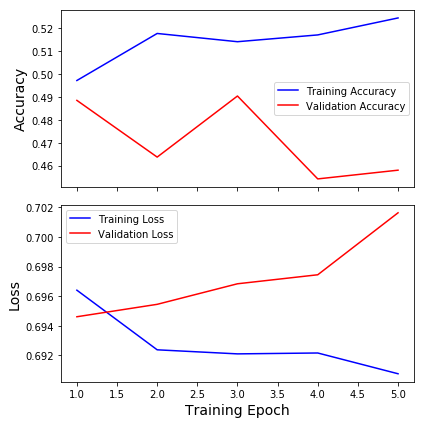



------------------------------------------------------------------------------------------
	EVALUATE MODEL:
------------------------------------------------------------------------------------------

- Evaluating Training Data:
5238/5238 [==============================] - 4s 785us/step
    - Accuracy:0.5279
    - Loss:0.6898

- Evaluating Test Data:
582/582 [==============================] - 0s 802us/step
    - Accuracy:0.4948
    - Loss:0.6965

------------------------------------------------------------------------------------------
	CLASSIFICATION REPORT:
------------------------------------------------------------------------------------------


index,precision,recall,f1-score,support
0,0.4684,0.4549,0.4615,277
1,0.5176,0.5311,0.5243,305
macro avg,0.493,0.493,0.4929,582
micro avg,0.4948,0.4948,0.4948,582
weighted avg,0.4942,0.4948,0.4944,582


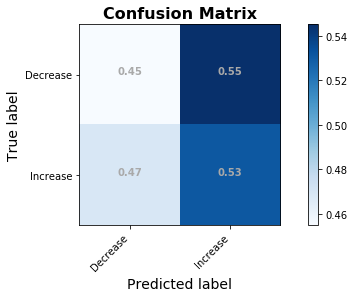

In [307]:
ji.reload([jik,ji])
fname = file_dict['model0A']['fig']
df_class_report0A,fig0A=ji.evaluate_classification(model0,history0,
                                                   X_train, X_test,y_train, y_test,
                                                   normalize_conf_matrix=True, 
                                                   save_conf_matrix_png=False,png_filename=fname+'.png')

In [308]:
ji.reload([jik,ji])
ji.save_model_weights_params(model0,filename_prefix='models/_twitter_lstm100x2_d10_d1')

Model saved as models/_twitter_lstm100x2_d10_d1_08-26-2019_0205am.json
Weights saved as models/_twitter_lstm100x2_d10_d1_08-26-2019_0205am_weights.h5


['models/_twitter_lstm100x2_d10_d1_08-26-2019_0205am',
 'models/_twitter_lstm100x2_d10_d1_08-26-2019_0205am_weights.h5',
 'models/_twitter_lstm100x2_d10_d1_08-26-2019_0205am_model_layers.xlsx',
 '']

### Model 0B: GRU

In [309]:
## GRU Model
from keras import models, layers, optimizers, regularizers

model0B = models.Sequential()

## Get and add embedding_layer
embedding_layer = ji.make_keras_embedding_layer(w2v_model, X_train)
model0B.add(embedding_layer)

model0B.add(layers.GRU(units=50, dropout=0.5, recurrent_dropout=0.2,return_sequences=True)) 
model0B.add(layers.GRU(units=100, dropout=0.5, recurrent_dropout=0.2))

# model0.add(layers.Dense(units=50, activation='relu'))#, activation='tan' # activation='relu'))#removed 08/21

model0B.add(layers.Dense(1, activation='sigmoid'))

model0B.compile(loss='binary_crossentropy',optimizer="adam",metrics=['acc'])#,'val_acc'])#, callbacks=callbacks)
model0B.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_15 (Embedding)     (None, 34, 300)           3326700   
_________________________________________________________________
gru_4 (GRU)                  (None, 34, 50)            52650     
_________________________________________________________________
gru_5 (GRU)                  (None, 100)               45300     
_________________________________________________________________
dense_22 (Dense)             (None, 1)                 101       
Total params: 3,424,751
Trainable params: 98,051
Non-trainable params: 3,326,700
_________________________________________________________________


--- CLOCK STARTED @:    08/26/19 - 02:05:24 AM --- 
Train on 4714 samples, validate on 524 samples
Epoch 1/5
4714/4714 [==============================] - 16s 3ms/step - loss: 0.6979 - acc: 0.4979 - val_loss: 0.6945 - val_acc: 0.5019

Epoch 00001: acc improved from inf to 0.49788, saving model to models/checkpoints/twitterNLP/twitterBLP_model1_weights.ep01-acc0.50.hdf5
Epoch 2/5
4714/4714 [==============================] - 10s 2ms/step - loss: 0.6953 - acc: 0.5023 - val_loss: 0.6935 - val_acc: 0.4981

Epoch 00002: acc did not improve from 0.49788
Epoch 3/5
4714/4714 [==============================] - 10s 2ms/step - loss: 0.6933 - acc: 0.5146 - val_loss: 0.6939 - val_acc: 0.4656

Epoch 00003: acc did not improve from 0.49788
Epoch 4/5
4714/4714 [==============================] - 10s 2ms/step - loss: 0.6918 - acc: 0.5223 - val_loss: 0.6946 - val_acc: 0.5076

Epoch 00004: acc did not improve from 0.49788
Epoch 5/5
4714/4714 [==============================] - 10s 2ms/step - loss: 0.6944 - a

Lap #,Start Time,Duration,Label
TOTAL,08/26/19 - 02:05:24 AM,"1 min, 3.412 sec",--


------------------------------------------------------------------------------------------
	TRAINING HISTORY:
------------------------------------------------------------------------------------------


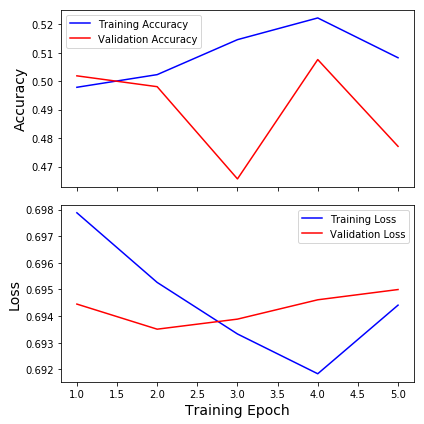



------------------------------------------------------------------------------------------
	EVALUATE MODEL:
------------------------------------------------------------------------------------------

- Evaluating Training Data:
5238/5238 [==============================] - 3s 482us/step
    - Accuracy:0.5202
    - Loss:0.6917

- Evaluating Test Data:
582/582 [==============================] - 0s 505us/step
    - Accuracy:0.5361
    - Loss:0.6920

------------------------------------------------------------------------------------------
	CLASSIFICATION REPORT:
------------------------------------------------------------------------------------------


index,precision,recall,f1-score,support
0,0.5393,0.1733,0.2623,277
1,0.5355,0.8656,0.6617,305
macro avg,0.5374,0.5194,0.462,582
micro avg,0.5361,0.5361,0.5361,582
weighted avg,0.5373,0.5361,0.4716,582


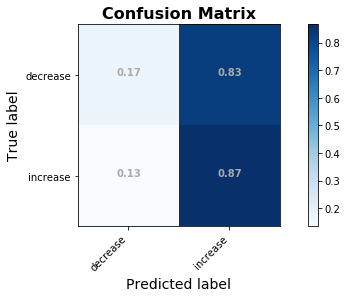

------------------------------------------------------------------------------------------
	TRAINING HISTORY:
------------------------------------------------------------------------------------------


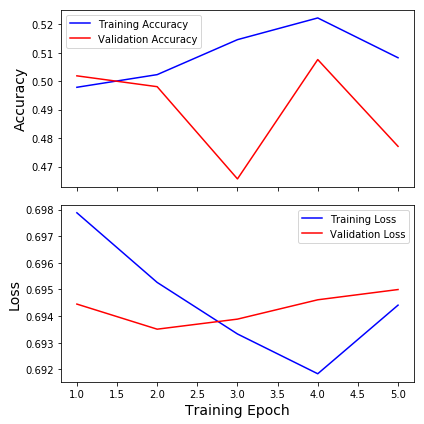



------------------------------------------------------------------------------------------
	EVALUATE MODEL:
------------------------------------------------------------------------------------------

- Evaluating Training Data:
5238/5238 [==============================] - 3s 501us/step
    - Accuracy:0.5202
    - Loss:0.6917

- Evaluating Test Data:
582/582 [==============================] - 0s 502us/step
    - Accuracy:0.5361
    - Loss:0.6920

------------------------------------------------------------------------------------------
	CLASSIFICATION REPORT:
------------------------------------------------------------------------------------------


index,precision,recall,f1-score,support
0,0.5393,0.1733,0.2623,277
1,0.5355,0.8656,0.6617,305
macro avg,0.5374,0.5194,0.462,582
micro avg,0.5361,0.5361,0.5361,582
weighted avg,0.5373,0.5361,0.4716,582


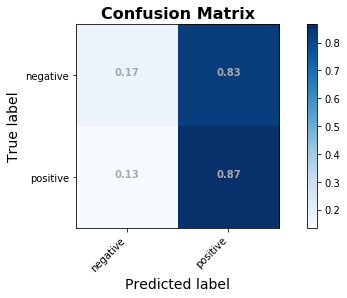

(          index  precision  recall  f1-score  support
 0             0     0.5393  0.1733    0.2623      277
 1             1     0.5355  0.8656    0.6617      305
 2     macro avg     0.5374  0.5194    0.4620      582
 3     micro avg     0.5361  0.5361    0.5361      582
 4  weighted avg     0.5373  0.5361    0.4716      582,
 <Figure size 576x288 with 2 Axes>)

In [310]:
ji.reload(ji)
num_epochs = 5

clock = bs.Clock()
clock.tic()
historyB = model0B.fit(X_train, y_train, epochs=num_epochs, verbose=True, validation_split=0.1,
                     callbacks=callbacks,batch_size=300)#, validation_data=(X_val))
clock.toc()
ji.evaluate_classification(model0B, historyB, 
                           X_train, X_test, y_train,y_test,
                           conf_matrix_classes=['decrease','increase'],
                           normalize_conf_matrix=True
                          )

ji.evaluate_classification(model0B, historyB, 
                           X_train, X_test, y_train,y_test,
                          conf_matrix_classes=None)

In [ ]:
# reload([jik,ji])
# ji.evaluate_classification(model0B,historyB,
#                            X_train,X_test,y_train, y_test,
#                            save_conf_matrix_png=True,
#                            png_filename='results/confusion_matrix_NLP_gru.png');

In [71]:
# ji.reload([jik,ji])
ji.save_model_weights_params(model0,filename_prefix='models/_twitter_gru100_d1')
# stop

Model saved as models/_twitter_gru100_d1_08-25-2019_0738pm.json
Weights saved as models/_twitter_gru100_d1_08-25-2019_0738pm_weights.h5


['models/_twitter_gru100_d1_08-25-2019_0738pm',
 'models/_twitter_gru100_d1_08-25-2019_0738pm_weights.h5',
 'models/_twitter_gru100_d1_08-25-2019_0738pm_model_layers.xlsx',
 '']

# KERAS STOCK PRICE MODELING

In [125]:
## cleaning up after modeling
del_me = ['df_tokenize','df_sampled']
for me in del_me:
    try: 
        exec(f'del {me}')
        print(f'del {me} succeeded')
    except:
        print(f'del {me} succeeded')
        continue
        
ji.inspect_variables(locals())

del df_tokenize succeeded
del df_sampled succeeded


,type,size
variable,,
df,DataFrame,63121681
twitter_df,DataFrame,29391730
X_train,ndarray,1717552
stock_df,DataFrame,628312
df_decomp,DataFrame,357384
df_train,DataFrame,245304
stock_observed,Series,241272
X_test,ndarray,191152
df_shifted2,DataFrame,156684


## KERAS MODEL 1: Using only stock `price` alone

In [126]:
# Display help menu for functions used above
ji.ihelp_menu(function_names=['ji.def_data_params',
              'ji.train_test_split_by_last_days',
              'ji.make_scaler_library',
              'ji.transform_cols_from_library'])

interactive(children=(Checkbox(value=False, description='show_help'), Checkbox(value=True, description='show_s…

In [127]:
## IMPORT PACKAGES
from bs_ds.imports import *
import functions_combined_BEST as ji
import my_keras_functions as jik

# Import some functions directly
from functions_combined_BEST import ihelp, ihelp_menu, reload

# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()

# Reload modules in case files have been updated
reload(jik)
reload(ji)

# Suppress warnings
ji.quiet_mode()
reload(jik)
reload(ji)

### 🧧def functions for saving model_dfs

In [163]:
## For each model need
#1) df_model for true_vs_preds_subplots
#2) df_results for tables (if cant use html export) (includes time_Shifted_metrics)
#3) df_shifted with traces for all shifts (maybe plot)
#4) save normal true_vs_pred_subplots 
file_dict = {}

for i in ['0A','0B','1','2','3']:
                  
    file_dict[f"model{i}"] ={}
    
    file_dict[f'model{i}']['df_model'] = f'assets/model{i}_df_model_true_vs_preds.csv'
    file_dict[f'model{i}']['df_results'] = f'assets/model{i}_df_results.csv' 
    file_dict[f'model{i}']['df_shifted'] = f'assets/model{i}_df_shifted.csv'
    file_dict[f'model{i}']['fig'] = f'assets/model{i}_true_vs_preds'
    file_dict[f'model{i}']['fig_shifted'] = f'assets/model{i}_true_vs_preds_shifted'
                  

pprint(file_dict)

# export = [df_model1,dfs_results,df_shifted]
how_to_use="""
save_model_dfs(file_dict,'model1',
               df_model=df_model1,
              df_results=dfs_results1,
              df_shifted=df_shifted1)
"""                  

{'model0A': {'df_model': 'assets/model0A_df_model_true_vs_preds.csv',
             'df_results': 'assets/model0A_df_results.csv',
             'df_shifted': 'assets/model0A_df_shifted.csv',
             'fig': 'assets/model0A_true_vs_preds',
             'fig_shifted': 'assets/model0A_true_vs_preds_shifted'},
 'model0B': {'df_model': 'assets/model0B_df_model_true_vs_preds.csv',
             'df_results': 'assets/model0B_df_results.csv',
             'df_shifted': 'assets/model0B_df_shifted.csv',
             'fig': 'assets/model0B_true_vs_preds',
             'fig_shifted': 'assets/model0B_true_vs_preds_shifted'},
 'model1': {'df_model': 'assets/model1_df_model_true_vs_preds.csv',
            'df_results': 'assets/model1_df_results.csv',
            'df_shifted': 'assets/model1_df_shifted.csv',
            'fig': 'assets/model1_true_vs_preds',
            'fig_shifted': 'assets/model1_true_vs_preds_shifted'},
 'model2': {'df_model': 'assets/model2_df_model_true_vs_preds.csv',
         

In [155]:
## FUNCTIONS FOR SAVING MODEL
def df2png(df, filename_prefix = 'results/summary_table',sep='_',filename_suffix='',file_ext='.png',
           auto_filename_suffix=True, check_if_exists=True,save_excel=True,auto_increment_name=True, CSS=''):
    '''Accepts a dataframe and a filename (without extention). Saves an image of the stylized table.'''
    # Now save the css and html dataframe to the same text file before conversion
    import imgkit
    import os 
    import time
    import functions_combined_BEST as ji
    
    ## Specify file_format for imgkit
    if '.png' not in file_ext:
        file_format = file_ext.replace('.','')
        imgkitoptions = {'format':file_format}
    else:
        imgkitoptions = {'format':'png'}
     
    ## Provide path to required wkhtmltoimage.exe
    exe_path = "C:\\Program Files\\wkhtmltopdf\\bin\\wkhtmltoimage.exe"
    imgconfig = imgkit.config(wkhtmltoimage = exe_path) #'C:/Users/james/Anaconda3/envs/learn-env-ext/Lib/site-packages/wkhtmltopdf/bin/wkhtmltoimage.exe')

    ## CREATE ANY MISSING FOLDERS FOR DESIRED FOLDERPATH
    ji.create_required_folders(filename_prefix,verbose=0)
    
    ## CREATING FILENAMES
    # add auto suffix
    if auto_filename_suffix:
        suffix_time_format = '%m-%d-%Y_%I%M%p'
        filename = ji.auto_filename_time(prefix=filename_prefix, sep=sep, timeformat=suffix_time_format )
    else:
        filename = filename_prefix

    ## Add suffix to filename
    full_filename = filename + sep + filename_suffix + file_ext


    ## CHECK_IF_FILE_EXISTS
    if check_if_exists:
        import os
        import pandas as pd
        current_files = os.listdir()
        
        # check if file already exists and raise errror if no auto_increment_name
        if full_filename in current_files and auto_increment_name==False:
            raise Exception('Filename already exists')
        
        # if file already exists, find version number and increase by 1 
        elif full_filename in current_files and auto_increment_name==True:
        
            # check if filename ends in version #
            import re
            num_ending = re.compile(r'[vV].?(\d+)')#.json')
            
            curr_file_num = num_ending.findall(full_filename)
            if len(curr_file_num)==0:
                v_num = '_v01'
            else:
                v_num = f"_{int(curr_file_num)+1}"

            ## CHANGE FOR FILE EXTENTSION TYPE
            full_filename = filename +sep+ v_num +file_ext
            print(f'{filename} already exists... incrementing filename to {full_filename}.')

    
    
    ## Make temp filename for css/html text file export
    base_filename = full_filename.split('.')[0]
    text_file_name = base_filename +'_to_convert.html'
    
    ## Add text_file_name to Path [cant remmeber why?]
    from pathlib import Path
    config = Path(text_file_name)    
    if config.is_file():
        # Store configuration file values
        os.remove(text_file_name)

    
    ### GET HTML TABLE TO OUTPUT
    # Check df is styler or normal df
    if isinstance(df,pd.io.formats.style.Styler):
        html_df = df.render()
        
        if save_excel == True:
            df.to_excel(base_filename+'.xlsx')
            
    elif isinstance(df, pd.DataFrame):
        html_df = df.to_html()
        
        if save_excel == True:
            df.to_excel(base_filename+'.xlsx')
    elif isinstance(df,str):
        html_df=df

    
    ## Create text file with CSS and dataframe as cs
    with open(text_file_name,'a') as text_file:
        text_file.write(CSS)
        text_file.write(html_df)
#         text_file.close()

    ## Create image filename and produce figure from text file
    imagename = base_filename+file_ext
    imgkit.from_file(text_file_name, imagename, options = imgkitoptions, config=imgconfig)
    
    # report
#     print('')

    ## delete temporary text file
    os.remove(text_file_name)
    
    return 

#################################################################

def save_model_dfs(file_dict,model_key,df_model=None, df_results=None, df_shifted=None):
    import pandas as pd
    
    filenames = file_dict[model_key]
    
    list_to_save = ['df_model', 'df_results','df_shifted']
    dfs_to_save= [df_model, df_results,df_shifted]
    dict_to_save = dict(zip(list_to_save,dfs_to_save))#[eval(x) for x in list_to_save] ))

    for k,v in dict_to_save.items():
        fname = filenames[k]
        
        if isinstance(v,pd.DataFrame):
            v.to_csv(fname)
            print(f"[i] {k} saved as {fname}")
        
        elif isinstance(v,pd.io.formats.style.Styler):
            if '.' in fname:
                name_parts = fname.split('.')
                file_ext = name_parts[-1]
                filename_prefix = name_parts[0]
            else:
                filename_prefix=fname
            
                
            df2png(v, filename_prefix=fname,file_ext='.png',
                  auto_filename_suffix=False, auto_increment_name=False,
                  save_excel=True)
            show_name = filename_prefix+"."+file_ext
            print(f'[i] {k} saved as {show_name}')
        else:
            print(f'input df for {k} is neither a DataFrame or a Styler')
        

#### NOTE ON PARAMETERS TO CHANGE:
- PARAMETERS TO CHANGE ARE LOCATED WITHIN HASHTAG COMMENTED BANNER SECTIONS
    - Header = `######## Name of section to be edited #######`
    - Footer = `#############################################`
    <br><br>
- **For `ji.def_data_params`:**
    - `num_test_days` = number of days left for test dataset
    - `num_train_days` = number of days prior to test_days to use as training dataset
    - `days_for_x_window` = number of days that should be analyzed together (binned for predictions)
    
    
- **For `ji.make_train_test_series_gens`:**
    - `n_features` = number of features/cols to use (for first model, =1, for second model =# of columns)
    - `batch_size` = 1 -  recommendation for timeseries predictions
    
    
- **For `_def_callbacks_and_params_`:**
    - `loss_function` for model checkpoints
    - `patience` = # of epochs without change before early stopping
    - `min_delta` = threshold for change to be considered significant (and therefore counts as new result)
    <br><br>
    
- **For `_def_callbacks_and_params_`:**
    - `loss` = Loss function for training
    -  `metrics` = Metrics to track during fit (['acc','mae'],)
    - `optimizer`= Optimizer to use during compiling ('optimizers.Nadam())

In [131]:
try:
    stock_df
except: 
    print('loading')
    stock_df = ji.load_processed_stock_data()

In [132]:
reload([jik,ji])
################# USER PARAMETERS: Define data parameters for train_test_split  ##############
model_params={}
model_params['data_params'] = ji.def_data_params(stock_df,
                                                 num_test_days=5, num_train_days=365, 
                                                 days_for_x_window=1, verbose=0)
###############################################################################################


###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######
dp = model_params['data_params']
df_train, df_test = ji.train_test_split_by_last_days(stock_df,
                                                     periods_per_day = dp['periods_per_day'], 
                                                     num_test_days   =  dp['num_test_days'],
                                                     num_train_days  =  dp['num_train_days'],
                                                     verbose=0, iplot=False)

display(df_train.head(2).style.set_caption('df_train - pre-scaling'))
# ji.display_dict_dropdown(model_params)

###### RESCALE DATA USING MinMaxScalers FIT ON TRAINING DATA's COLUMNS ######
scaler_library, df_train, model_params = ji.make_scaler_library(df_train, 
                                                                transform=True,
                                                                model_params=model_params,
                                                                verbose=2)

df_test = ji.transform_cols_from_library(df_test,col_list=None,col_scaler_dict=scaler_library,
                                                      scaler_library=scaler_library,inverse=False)

# Show transformed dataset
display( df_train.head(2).round(3).style.set_caption('training data - scaled'))#,
#         df_test.head(2).round(3).style.set_caption('test data'))



################# USER PARAMETERS: Define n_Features and batch sizes for generators  ##############
# Create timeseries generators
train_generator, test_generator, model_params =\
    ji.make_train_test_series_gens( df_train['price'], df_test['price'],
                                   n_features=1,batch_size=1, model_params=model_params,
                                   verbose=0)
ji.display_dict_dropdown(model_params)
###############################################################################################

# # ji.display_dict_dropdown(model_params)
# funcs_make_model = ['make_train_test_series_gens','def_callbacks_and_params',
#                   'def_compile_params_optimizer','make_model1'] 
# ihelp_menu(funcs_make_model)

,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum
date_time_index,,,,,,,,,,,
2018-03-26 09:30:00,104.8,107.8,108.8,108.8,108,-0.7991,1.529,111.8,105.7,104.6,97.82
2018-03-26 10:30:00,104.5,107.7,108.7,108.7,107.9,-0.8339,1.565,111.9,105.6,104.6,97.53


,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum
date_time_index,,,,,,,,,,,
2018-03-26 09:30:00,0.415,0.478,0.468,0.436,0.437,0.497,0.247,0.385,0.517,0.402,0.415
2018-03-26 10:30:00,0.404,0.474,0.467,0.433,0.433,0.49,0.255,0.388,0.512,0.399,0.404


------------ Dictionary Contents ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 5, 'nu…

In [133]:
# ihelp(ji.make_train_test_series_gens)

In [134]:
def _def_callbacks_and_params_(model_params=None,loss_function='mae',checkpoint_mode='min',filepath=None,
                             stop_mode='min',patience=1,min_delta=.001,verbose=1):
    import functions_combined_BEST as ji
    

            ########## Define loss function and callback params ##########
    callback_params ={}
    callback_params['custom_loss_function'] = loss_function
    callback_params['ModelCheckpoint'] = {'monitor': loss_function, 'mode':checkpoint_mode}
    callback_params['EarlyStopping'] = {'monitor':loss_function, 'mode':stop_mode, 
                                        'patience':patience, 'min_delta':min_delta}

    # CREATING CALLBACKS
    from keras import callbacks

    if filepath is None:
        filepath = f"models/checkpoints/model1_weights_{ji.auto_filename_time(prefix=None)}.hdf5"

    if 'my_rmse' in loss_function:
        import functions_combined_BEST as ji
        loss_function = ji.my_rmse
#         my_rmse=my_rmse
#         loss_function = my_rmse

    # Create ModelCheckPoint
    fun_params=callback_params['ModelCheckpoint']
    checkpoint = callbacks.ModelCheckpoint(filepath=filepath, monitor=loss_function, mode=fun_params['mode'],
                                           save_best_only=True, verbose=verbose)
    # Create EarlyStopping
    fun_params=callback_params['EarlyStopping']
    early_stop = callbacks.EarlyStopping(monitor=loss_function, mode=fun_params['mode'], patience=fun_params['patience'],
                                         min_delta=fun_params['min_delta'],verbose=verbose)
    callbacks = [checkpoint,early_stop]

    if model_params is None:
        model_params=callback_params
    else:
        model_params['callbacks'] = callback_params
    return callbacks, model_params

################# USER PARAMS: Create ModelCheckpoint and early Stopping callbacks ###################
callbacks, model_params = \
    _def_callbacks_and_params_(model_params, loss_function='my_rmse',
                               checkpoint_mode='min', stop_mode = 'min',
                                patience=1, min_delta=0.001, verbose=1)
######################################################################################################


def _def_compile_params_optimizer_(loss='my_rmse',metrics=['acc','my_rmse'],optimizer='optimizers.Nadam()',model_params=None):
    ####### Specify additional model parameters
    from keras import optimizers
         
    compile_params={}
    compile_params['loss']= loss#{'my_rmse':my_rmse}
    compile_params['metrics'] = metrics#['acc',my_rmse]
    
    if type(optimizer) is str:
        optimizer_name = optimizer
        optimizer = eval(optimizer_name)
    else:
        optimizer_name = optimizer.__class__().__str__()
        
    compile_params['optimizer'] = optimizer
    compile_params['optimizer_name'] = optimizer_name#'optimizers.Nadam()'

    if model_params is not None:
        model_params['compile_params'] = compile_params
    else:
        model_params=compile_params
    
    return model_params


################## Add compiler parameters to model_params ############################
model_params = _def_compile_params_optimizer_(
    loss='my_rmse', 
    metrics=['acc','mae'],
    optimizer='optimizers.Nadam()', 
    model_params=model_params)
########################################################################################
ji.display_dict_dropdown(model_params)

------------ Dictionary Contents ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 5, 'nu…

In [135]:
# Create keras model from model_params
def _make_model1_(model_params, summary=True):
    from keras.models import Sequential
    from keras.layers import Bidirectional, Dense, LSTM, Dropout
    from IPython.display import display
    from keras.regularizers import l2

    # Specifying input shape (size of samples, rank of samples?)
    n_input = model_params['input_params']['n_input']
    n_features = model_params['input_params']['n_features']
    print(f'input shape: ({n_input},{n_features}')
    input_shape=(n_input, n_features)
    
    # Create model architecture
    model = Sequential()
    model.add(LSTM(units=50, input_shape =input_shape,return_sequences=True))#,  kernel_regularizer=l2(0.01),recurrent_regularizer=l2(0.01),
#     model.add(Dropout(0.2))
    model.add(LSTM(units=50, activation='relu'))
    model.add(Dense(1))

    # load compile params and compile
    comp_params = model_params['compile_params']
    # metrics = comp_params['metrics']
    loss=comp_params['loss']
    metrics=comp_params['metrics']
    
    if 'my_rmse' in loss or 'my_rmse' in metrics:

        def check_loss_metrics_for_my_rmse(loss,metrics):
            metric_function = metrics
            loss_function = loss
            
            import functions_combined_BEST as ji
            for i,idx in enumerate(metrics):
                if 'my_rmse' in metrics[i]:
                    metric_function[i]=ji.my_rmse
            
            if 'my_rmse' in loss:
                loss_function=ji.my_rmse
                
            return loss_function, metric_function
        
        loss_function,metric_function = check_loss_metrics_for_my_rmse(loss,metrics)
        
    model.compile(loss=loss_function, metrics=metric_function,
                  optimizer=comp_params['optimizer'])##eval(comp_params['optimizer']), metrics=metrics)#optimizer=optimizers.Nadam()
    

    if summary is True:
        display(model.summary())
        
#     if return_params:
#         model_params['compile_params']['loss'] = loss_str
#         model_params['compile_params']['metrics'] = metrics_str
#         return model, model_params
    return model
#########################################################################################

model1=_make_model1_(model_params)

# Display all parameters used to create model
ji.display_dict_dropdown(model_params,title='Parameters for Keras Model')

input shape: (7,1
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_9 (LSTM)                (None, 7, 50)             10400     
_________________________________________________________________
lstm_10 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 51        
Total params: 30,651
Trainable params: 30,651
Non-trainable params: 0
_________________________________________________________________


None

------------ Parameters for Keras Model ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 5, 'nu…

------------------------------------------------------------
	FITTING MODEL:
------------------------------------------------------------ 

--- CLOCK STARTED @:    08/25/19 - 09:29:16 PM           Label:            --- 
Epoch 1/3
 - 33s - loss: 0.0360 - acc: 7.8493e-04 - mean_absolute_error: 0.0360
Epoch 2/3
 - 31s - loss: 0.0229 - acc: 7.8493e-04 - mean_absolute_error: 0.0229
Epoch 3/3
 - 31s - loss: 0.0177 - acc: 7.8493e-04 - mean_absolute_error: 0.0177
--- TOTAL DURATION   =  1 min, 42.452 sec --- 


Lap #,Start Time,Duration,Label
TOTAL,08/25/19 - 09:29:16 PM,"1 min, 42.452 sec",




------------------------------------------------------------------------------------
	EVALUATE MODEL:
------------------------------------------------------------------------------------


,Training Data,Test Data
acc,0.0008,0.0000
loss,0.0099,0.0123
mean_absolute_error,0.0099,0.0123


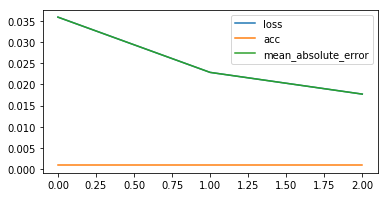

In [136]:
def _fit_model_(model,train_generator,model_params=None,epochs=None,callbacks=None,verbose=2,workers=3):
    import bs_ds as bs
    import functions_combined_BEST as ji
    from IPython.display import display

    quiet_command = ji.quiet_mode(True,True,True)
    exec(quiet_command)
    
    if model_params is None:
        model_params={}
    model_params['fit_params'] = {'epochs':epochs}#,'callbacks':callbacks}

    # Instantiating clock timer
    clock = bs.Clock()

    print('---'*20)
    print('\tFITTING MODEL:')
    print('---'*20,'\n')     
    
    # start the timer
    clock.tic('')

    # Fit the model
    fit_params = model_params['fit_params']
    if callbacks is None:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'], 
                                       verbose=2, use_multiprocessing=True, workers=3)
    else:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'],
                                       callbacks=callbacks,
                                       verbose=2,use_multiprocessing=True, workers=3)
    # model_results = model.history.history
    clock.toc('')
    
    return model,model_params,history


#########################################################################################
# Fit keras model to train_generator

model1,model_params,history =_fit_model_(model1,train_generator,
                                          model_params=model_params,
                                          epochs=3,callbacks=callbacks)

# Get results from model.evaluate_generator()
eval_results = ji.evaluate_model_plot_history(model1, train_generator, test_generator)

### Model 1 Results

In [164]:
ji.reload([jik,ji])

### PREFER NEW WAY - GET DF_MODEL FIRST THEN GET EVALUATE_REGRESSION INFORMATION?
## Get true vs pred data as a dataframe and iplot
df_model1 = ji.get_model_preds_df(model1, 
                                  test_generator = test_generator,
                                  true_train_series = df_train['price'],
                                  true_test_series = df_test['price'],
                                  include_train_data=True,
                                  model_params = model_params,
                                  preds_from_gen = True, 
                                  preds_from_train_preds = True, 
                                  preds_from_test_preds = True,
                                  plot_with_train_data=True,
                                 inverse_tf = True, 
                                  iplot = False)
# display(df_model1.head())
ji.plotly_true_vs_preds_subplots(df_model_preds=df_model1,
                                 true_train_col='true_train_price',
                                 true_test_col='true_test_price',
                                pred_test_columns='pred_from_gen')
# Get evaluation metrics
regr_evals = ji.get_evaluate_regression_dict(df_model1,
                                             metrics=['r2', 'mae', 'U'],
                                             show_results_df=True, 
                                             return_as_styled_df=True)#return_as_df=True)

28 28 28
Removed i_.
Using all columns...


,true_train_price,true_test_price,pred_from_gen,pred_from_test_preds,pred_from_train_preds
2018-03-26 09:30:00,104.82,NaN,NaN,NaN,NaN
2018-03-26 10:30:00,104.53,NaN,NaN,NaN,NaN
2018-03-26 11:30:00,104.15,NaN,NaN,NaN,NaN
2018-03-26 12:30:00,104.15,NaN,NaN,NaN,NaN
2018-03-26 13:30:00,104.69,NaN,NaN,NaN,NaN


Prediction Source,R^2,MAE,U
from_gen,0.652,0.319,1.148
from_test_preds,-3.463,1.308,4.141
from_train_preds,-1.069,0.664,2.781


Pred Shifted,R^2,RMSE,U
-4,-4.304,0.628,2.011
-3,-0.267,0.467,1.122
-2,0.571,0.363,0.884
-1,0.947,0.16,0.397
0,0.652,0.457,1.148
1,0.379,0.613,1.538
2,-0.005,0.793,1.96
3,-0.252,0.902,2.241


[i] Figure saved as assets/model1_true_vs_preds
[i] df_model saved as assets/model1_df_model_true_vs_preds.csv
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               
[i] df_results saved as assets/model1_df_results.csv
[i] df_shifted saved as assets/model1_df_shifted.csv


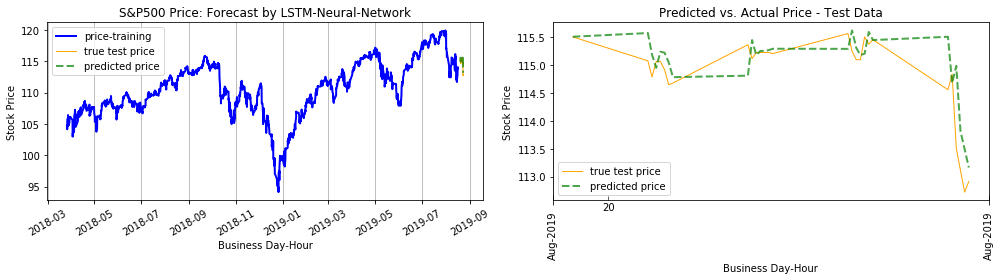

In [165]:
# Compare predictions if predictions timebins shifted
reload([jik,ji])
df_results1, dfs_results1, df_shifted1 =\
ji.compare_eval_metrics_for_shifts(df_model1['true_test_price'],
                                   df_model1['pred_from_gen'],
                                   shift_list=np.arange(-4,4,1),
                                   true_train_series_to_add=df_model1['true_train_price'],
                                   display_results=True,
                                   display_U_info=False,
                                   return_results=True,
                                   return_styled_df=True,
                                   return_shifted_df=True)

ji.plot_true_vs_preds_subplots(df_model1['true_train_price'],
                               df_model1['true_test_price'],
                               df_model1['pred_from_gen'],
                               save_fig=True,
                               filename =file_dict['model1']['fig']);
##SAVING DFS
save_model_dfs(file_dict,'model1',
               df_model=df_model1,
              df_results=dfs_results1,
              df_shifted=df_shifted1)

[i] Figure saved as assets/model1_true_vs_preds_shifted


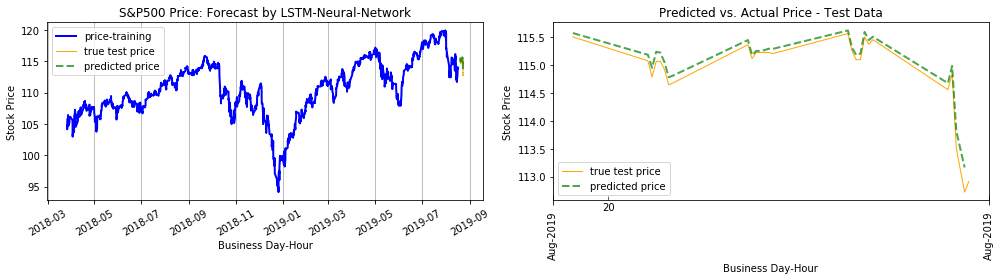

In [166]:
ji.plot_true_vs_preds_subplots(df_model1['true_train_price'], 
                               df_model1['true_test_price'], 
                               df_model1['pred_from_gen'].shift(-1),
                               save_fig=True, filename=file_dict['model1']['fig_shifted']
                              );


In [168]:
save_model=True
if save_model ==True:
    ji.save_model_weights_params(model1,
                                 model_params=model_params,
                                 filename_prefix='models/best_stock/model1_new_data',
                                 auto_increment_name=True,
                                 auto_filename_suffix=True, 
                                 suffix_time_format='%m-%d-%y_%I%M%p',
                                 save_model_layer_config_xlsx=True)

Model saved as models/best_stock/model1_new_data_08-25-19_0952pm.json
Weights saved as models/best_stock/model1_new_data_08-25-19_0952pm_weights.h5


In [87]:
## SHOW AND EXORT ALL MODEL LAYER CONFIGURATION PARAMS
display_summary = False
if display_summary:
    model_summary_df = ji.make_qgrid_model_menu(model1,return_df=True)
    ji.display_dict_dropdown(model_params)

In [89]:
# ## GET SHIFTED RESULTS FOR PREDS FROM GENERATOR
# df_shifted = jicompare_u_for_shifts(df_model1['true_from_gen'],df_model1['pred_from_gen'],
#                         shift_list=np.arange(-4,4,1),
#                         plot_all=False, plot_best=True,
#                         color_coded=True,return_results=False,
#                                      return_shifted_df=True)

# ## GET SHIFTED RESULTS FOR PREDS FROM TRAIN PREDS
# df_shifted2 = jicompare_u_for_shifts(df_model1['true_from_gen'],df_model1['pred_from_train_preds'],
#                         shift_list=np.arange(-4,4,1),
#                         plot_all=False, plot_best=True,
#                         color_coded=True,return_results=False,
#                                      return_shifted_df=True)
# # res_df = ji.compare_time_shifted_model(df_model1,)

# res_df_gen = ji.compare_time_shifted_model(df_model1,true_colname='true_from_gen',
#                                       pred_colname='pred_from_gen',show_U_info=False,
#                                           caption='From Generator')

# res_df_from_train = ji.compare_time_shifted_model(df_model1,true_colname='true_from_train_preds',
#                                       pred_colname='pred_from_train_preds', show_U_info=False,
#                                                  caption='From Preds of Train Preds')

# res_df_from_test = ji.compare_time_shifted_model(df_model1,true_colname='true_from_test_preds',
#                                       pred_colname='pred_from_test_preds', show_U_info=False,
#                                                  caption='From Preds of Test Preds')

In [90]:
# ##### SUPER IMPORTANT CELL
# scaled_train_data = df_train['price']
# scaled_test_data = df_test['price']

# get_model_preds_from_preds= ji.get_model_preds_from_preds
# def get_preds_from_preds(model1,scaled_train_data, scaled_test_data,
#                          model_params=None, n_input=None, n_features=None, 
#                          build_preds_from_train=True, return_df=True,suffix=None):
    
#     """ Gets predictions from model using using its own predictions as the subsequent input.
#     Must provide a model_params dictionary with 'input_params' OR must define ('n_input','n_features').
    
#     * IF build_preds_from_train is True:
#         1. starting true time series for predictions is the last rows [-n_input:] from training data.
#         2. output predicitons will be the same length as the input scaled_test_data
    
#     * IF build_preds_from_train is False:
#         1. starting true time series for predictions is the first rows [:n_input] from test data.
#         2. output predicitons will be shorter by n_input # of rows
#         """
#     test_predictions = []
#     first_eval_batch=[]
#     index_tracker = []
    
#     if model_params is not None:
#         n_input= model_params['input_params']['n_input']
#         n_features = model_params['input_params']['n_features']

#     if model_params is None:
#         if n_input is None or n_features is None:
#             raise Exception('Must provide model params or define n_input and n_features')
        

#     preds_out = [['i','index','pred']]
    
#     # SAVING COPY OF INPUT TEST DATA
#     scaled_test_series = scaled_test_data.copy() 

#     ## SAVING TRAIN AND TEST DATA INDICES AND VALUES
#     train_data_index = scaled_train_data.index
#     scaled_train_data = scaled_train_data.values
#     test_data_index = scaled_test_data.index
#     scaled_test_data = scaled_test_data.values
    
    
#     ## PREPARE THE FIRST EVAL BATCH TIMESERIES FROM TRAIN OR TEST DATA
#     # Change parameters depending on if from train or test data
#     if build_preds_from_train:
        
#         # If using trianing data loop through full test data
#         loop_length = range(len(scaled_test_data))
        
#         # take the last window size of data from training data 
#         first_eval_batch = scaled_train_data[-n_input:]
#         first_batch_idx = train_data_index[-n_input:]
        
#         # set the true index to test_data_index
#         true_index_out = test_data_index
        
#     # Set the loop to be from n_input # of rows into test_data
#     else:
#         loop_length = range(n_input,len(scaled_test_data))
#         first_eval_batch = scaled_test_data[:n_input]
#         true_index_out =  test_data_index[n_input:]
      
    
#     # reshape first batch of data for model.predict 
#     current_batch = first_eval_batch.reshape((1, n_input, n_features))

    
#     ## LOOP THROUGH REMAINING TIMEBINS USING CURRENT PREDICITONS AS NEW DATA FOR NEXT
#     for i in loop_length:

#         # get prediction 1 time stamp ahead ([0] is for grabbing just the number instead of [array])
#         current_pred = model.predict(current_batch)[0]        
#         # store prediction
#         test_predictions.append(current_pred) 

#         # update batch to now include prediction and drop first value
#         current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)
        
#         ## Append the data to the output df list
#         preds_out.append([i,test_data_index[i],current_pred[0]])


#     ## If returning a dataframe,prepare and rename with suffix
#     if return_df:
#         res_df = bs.list2df(preds_out)
#         res_df['index'] = pd.to_datetime(res_df['index'])
#         res_df.set_index('index',inplace=True)
        
#         # adding true price
#         res_df['true'] = scaled_test_series.loc[true_index_out]
#         res_df=res_df[['i','true','pred']]
        
#         if suffix is not None:
#             colnames = [name+suffix for name in res_df.columns]
#         else:
#             colnames = res_df.columns
            
#         res_df.columns=colnames
#         return res_df #test_predictions, checks
    
#     # Else just return array of predictions
#     else:
#         return test_predictions

    
    
# def get_model_preds_from_gen(model,test_generator,true_test_data,model_params=None,
#                        n_input=None, n_features=None, suffix=None, return_df=False):
#         """
#         Gets prediction from model using the generator's timeseries using model.predict_generator()
#         Must provide a model_params dictionary with 'input_params' OR must define ('n_input','n_features').

#         """
#         if model_params is not None:
#             n_input= model_params['input_params']['n_input']
#             n_features = model_params['input_params']['n_features']

#         if model_params is None:
#             if n_input is None or n_features is None:
#                 raise Exception('Must provide model params or define n_input and n_features')

#         # GET TRUE VALUES AND DATETIME INDEX FROM GENERATOR
        
#         # Get true time index from the generator's start_index and end_index 
#         gen_index = true_test_data.index[test_generator.start_index:test_generator.end_index+1]
#         gen_true_targets = test_generator.targets[test_generator.start_index:test_generator.end_index+1]
        
        
#         # Generate predictions from the test_generator
#         gen_preds = model.predict_generator(test_generator)
#         gen_preds_flat = gen_preds.ravel()
        
#         gen_true_targets = gen_true_targets.ravel()
        
        
#         # RETURN OUTPUT AS DATAFRAME OR ARRAY OF PREDS
#         if return_df:
#             # Combine the outputs
#             gen_pred_df = pd.DataFrame({'index':gen_index,'true':gen_true_targets,'pred':gen_preds_flat})
#             gen_pred_df['index'] = pd.to_datetime(gen_pred_df['index'])
#             gen_pred_df.set_index('index',inplace=True)

#             if suffix is not None:
#                 colnames = [name+suffix for name in gen_pred_df.columns]
#             else:
#                 colnames = gen_pred_df.columns
#             return gen_pred_df
#         else:
#             return gen_preds


# def compare_model_pred_methods(model, true_train_series,true_test_series, test_generator=None,
#                                model_params=None, n_input=None, n_features=None, from_gen=True,
#                                from_train_series = True, from_test_series=True, 
#                                iplot=True, plot_with_train_data=True,return_df=True, inverse_tf=True):
#     """ Gets predictions for training data from the 3 options: 
#     1) from generator  --  len(output) = (len(true_test_series)-n_input)
#     2) from predictions on test data  --  len(output) = (len(true_test_series)-n_input)
#     3) from predictions on train data -- len(true_test_series)
#     """
#         if model_params is not None:
#             n_input= model_params['input_params']['n_input']
#             n_features = model_params['input_params']['n_features']

#         if model_params is None:
#             if n_input is None or n_features is None:
#                 raise Exception('Must provide model params or define n_input and n_features')
                
#         if from_gen is True and test_generator is None:
#             raise Exception('If from_gen=True, must provide generator.')

                
#         ### GET the 3 DIFERENT TYPES OF PREDICTIONS    
#         df_list = []
#         if from_gen:
#             gen_df = ji.get_model_preds_from_gen(model, test_generator,true_test_series,
#                                                  model_params=model_params, n_input=n_input, n_features=n_features, 
#                                                 suffix='_from_gen',return_df=True)    
#             df_list.append(gen_df)

#         if from_test_series:
#             func_df_from_test = ji.get_model_preds_from_preds(model, true_train_series,true_test_series,
#                                                           model_params=model_params, n_input=n_input, 
#                                                           n_features=n_features, suffix='_from_test',
#                                                           build_preds_from_train=False, return_df=True)
#             df_list.append(func_df_from_test)

#         if from_train_series:
#             func_df_from_train  = ji.get_model_preds_from_preds(model,true_train_series,true_test_series,
#                                                                 model_params=model_params, n_input=n_input,
#                                                                 suffix='_from_train', build_preds_from_train=True,
#                                                             return_df=True)
#             df_list.append(func_df_from_train)

#         # bs.display_side_by_side(func_df,func_df_from_train)

#         df_all_preds = pd.concat([df for df in df_list],axis=1)
#         df_all_preds = bs.drop_cols(df_all_preds,['i_'])


#         if inverse_tf:
#             df_out = ji.transform_cols_from_library(df_all_preds,single_scaler=model_params['scaler_library']['price'],inverse=True)
#         else:
#             df_out = df_all_preds

#         if iplot:
#             if plot_with_train_data is False:
#                 ji.plotly_time_series(df_out)
#             else:
#                 true_train_price = ji.inverse_transform_series(true_train_series,model_params['scaler_library']['price'])
#                 df_plot = pd.concat([true_train_price,df_out],axis=1)
#                 ji.plotly_time_series(df_plot)

#         if return_df:
#             return df_out

In [91]:
# df_all_preds = ji.compare_model_pred_methods(model1, true_train_series=df_train['price'],
#                                              true_test_series=df_test['price'], test_generator=test_generator,
#                                              model_params=model_params,  n_input=None, n_features=None,
#                                              from_gen=True, from_train_series = True, from_test_series=True,
#                                              iplot=True, plot_with_train_data=True, return_df=True, inverse_tf=True) 


## KERAS MODEL 2: Using stock price + technical indicators


In [ ]:
## IMPORT PACKAGES
from bs_ds.imports import *
import functions_combined_BEST as ji
import my_keras_functions as jik

# Import some functions directly
from functions_combined_BEST import ihelp, ihelp_menu, reload

# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()

# Reload modules in case files have been updated
reload(jik)
reload(ji)

## check for stock_df
try: stock_df
except NameError:
    stock_df= None
    
if stock_df is None:
    stock_df = ji.load_processed_stock_data()
    
## check for df_train 
try: df_train
except NameError:
    df_train = None
try: df_test
except NameError:
    df_test = None
    
if df_train is None or df_test is None:
    use_prior_train_test_data = False
    print('Training or test data not found')
else:
    use_prior_train_test_data =  True

In [96]:
stock_df = stock_df[[
    'price','ma7','ma21','26ema','12ema','MACD','20sd',
    'upper_band','lower_band','ema','momentum']].copy()#,'filled_timebin'
stock_df.dropna(inplace=True)
stock_df.head()

,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum
date_time_index,,,,,,,,,,,
2016-12-29 15:30:00,96.27,96.8649,96.2770,96.5739,96.7305,0.1566,1.0021,98.2811,94.2729,96.2640,89.27
2016-12-30 09:30:00,96.38,96.8502,96.2935,96.5712,96.7220,0.1508,0.9807,98.2548,94.3322,96.3413,89.38
2016-12-30 10:30:00,96.21,96.8316,96.3079,96.5663,96.7096,0.1433,0.9597,98.2273,94.3884,96.2538,89.21
2016-12-30 11:30:00,96.34,96.8143,96.3227,96.5633,96.7006,0.1374,0.9383,98.1992,94.4461,96.3113,89.34
2016-12-30 12:30:00,96.25,96.7947,96.3365,96.5590,96.6897,0.1307,0.9124,98.1613,94.5117,96.2704,89.25


In [173]:
use_prior_train_test_data=False
if use_prior_train_test_data == False:
    print('Making new df_train and df_test')
    ################# USER PARAMETERS: Define data parameters for train_test_split  ##############
    model_params={}
    model_params['data_params'] = ji.def_data_params(stock_df,
                                                     num_test_days=10, num_train_days=365, 
                                                     days_for_x_window=5, verbose=0)
    ###############################################################################################


    ###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######
    dp = model_params['data_params']
    df_train, df_test = ji.train_test_split_by_last_days(stock_df,
                                                         periods_per_day = dp['periods_per_day'], 
                                                         num_test_days   =  dp['num_test_days'],
                                                         num_train_days  =  dp['num_train_days'],
                                                         verbose=0, iplot=False)

    display(df_train.head(2).style.set_caption('df_train - pre-scaling'))
    # ji.display_dict_dropdown(model_params)

    ###### RESCALE DATA USING MinMaxScalers FIT ON TRAINING DATA's COLUMNS ######
    scaler_library, df_train, model_params = ji.make_scaler_library(df_train, 
                                                                    transform=True,
                                                                    model_params=model_params,
                                                                    verbose=2)

    df_test = ji.transform_cols_from_library(df_test,col_list=None,col_scaler_dict=scaler_library,
                                                          scaler_library=scaler_library,inverse=False)

    # Show transformed dataset
display( df_train.head(2).round(3).style.set_caption('training data - scaled'))#,
    #         df_test.head(2).round(3).style.set_caption('test data'))



################# USER PARAMETERS: Define n_Features and batch sizes for generators  ##############
# Create timeseries generators
train_generator, test_generator, model_params =\
    ji.make_train_test_series_gens(train_data_series=df_train, test_data_series=df_test,y_cols='price',
                                   n_features=len(df_train.columns),batch_size=1, model_params=model_params,
                                   verbose=0)
ji.display_dict_dropdown(model_params)

train_generator[0][0].shape

Making new df_train and df_test


,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum
date_time_index,,,,,,,,,,,
2018-03-19 09:30:00,109,109.7,109.3,109.6,109.4,-0.2158,1.106,111.5,107.1,109.1,102
2018-03-19 10:30:00,108.7,109.7,109.3,109.6,109.4,-0.2226,1.103,111.5,107.1,108.8,101.7


,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum
date_time_index,,,,,,,,,,,
2018-03-19 09:30:00,0.577,0.565,0.5,0.485,0.508,0.613,0.155,0.369,0.576,0.578,0.577
2018-03-19 10:30:00,0.564,0.565,0.499,0.484,0.507,0.611,0.154,0.369,0.576,0.566,0.564


------------ Dictionary Contents ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 10, 'n…

(1, 35, 11)

In [181]:
###############################################################################################

# # ji.display_dict_dropdown(model_params)
# funcs_make_model = ['make_train_test_series_gens','def_callbacks_and_params',
#                   'def_compile_params_optimizer','make_model1'] 
# ihelp_menu(funcs_make_model)

def _def_callbacks_and_params_(model_params=None,loss_function='mae',checkpoint_mode='min',filepath=None,
                             stop_mode='min',patience=1,min_delta=.005,verbose=1):
    import functions_combined_BEST as ji
    

            ########## Define loss function and callback params ##########
    callback_params ={}
    callback_params['custom_loss_function'] = loss_function
    callback_params['ModelCheckpoint'] = {'monitor': loss_function, 'mode':checkpoint_mode}
    callback_params['EarlyStopping'] = {'monitor':loss_function, 'mode':stop_mode, 
                                        'patience':patience, 'min_delta':min_delta}

    # CREATING CALLBACKS
    from keras import callbacks

    if filepath is None:
        filepath = f"models/checkpoints/model1_weights_{ji.auto_filename_time(prefix=None)}.hdf5"

    if 'my_rmse' in loss_function:
        import functions_combined_BEST as ji
        loss_function = ji.my_rmse
#         my_rmse=my_rmse
#         loss_function = my_rmse

    # Create ModelCheckPoint
    fun_params=callback_params['ModelCheckpoint']
    checkpoint = callbacks.ModelCheckpoint(filepath=filepath, monitor=loss_function, mode=fun_params['mode'],
                                           save_best_only=True, verbose=verbose)
    # Create EarlyStopping
    fun_params=callback_params['EarlyStopping']
    early_stop = callbacks.EarlyStopping(monitor=loss_function, mode=fun_params['mode'], patience=fun_params['patience'],
                                         min_delta=fun_params['min_delta'],verbose=verbose)
    callbacks = [checkpoint,early_stop]

    if model_params is None:
        model_params=callback_params
    else:
        model_params['callbacks'] = callback_params
    return callbacks, model_params

################# USER PARAMS: Create ModelCheckpoint and early Stopping callbacks ###################
callbacks, model_params = \
    _def_callbacks_and_params_(model_params, loss_function='my_rmse',
                               checkpoint_mode='min', stop_mode = 'min',
                                patience=1, min_delta=0.005, verbose=1)
######################################################################################################


def _def_compile_params_optimizer_(loss='my_rmse',metrics=['acc','my_rmse'],optimizer='optimizers.Nadam()',model_params=None):
    ####### Specify additional model parameters
    from keras import optimizers
         
    compile_params={}
    compile_params['loss']= loss#{'my_rmse':my_rmse}
    compile_params['metrics'] = metrics#['acc',my_rmse]
    
    if type(optimizer) is str:
        optimizer_name = optimizer
        optimizer = eval(optimizer_name)
    else:
        optimizer_name = optimizer.__class__().__str__()
        
    compile_params['optimizer'] = optimizer
    compile_params['optimizer_name'] = optimizer_name#'optimizers.Nadam()'

    if model_params is not None:
        model_params['compile_params'] = compile_params
    else:
        model_params=compile_params
    
    return model_params


################## Add compiler parameters to model_params ############################
model_params = _def_compile_params_optimizer_(
    loss='my_rmse', 
    metrics=['my_rmse','mae'],
    optimizer='optimizers.Nadam()', 
    model_params=model_params)
########################################################################################
ji.display_dict_dropdown(model_params)

------------ Dictionary Contents ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 10, 'n…

In [182]:
# Create keras model from model_params
def _make_model2_(model_params, summary=True):
    import functions_combined_BEST as ji
    from keras.models import Sequential
    from keras.layers import Bidirectional, Dense, LSTM, Dropout
    from IPython.display import display
    from keras.regularizers import l2

    # Specifying input shape (size of samples, rank of samples?)
    n_input = model_params['input_params']['n_input']
    n_features = model_params['input_params']['n_features']
    print(f'input shape: ({n_input},{n_features}')
    input_shape=(n_input, n_features)
    
    # Create model architecture
    model = Sequential()
    model.add(LSTM(units=50, input_shape =input_shape,return_sequences=True))#,  kernel_regularizer=l2(0.01),recurrent_regularizer=l2(0.01),
    model.add(Dropout(0.2))
    model.add(LSTM(units=50, activation='relu'))
    model.add(Dense(1))

    # load compile params and compile
    comp_params = model_params['compile_params']
    # metrics = comp_params['metrics']
    loss=comp_params['loss']
    metrics=comp_params['metrics']
    
    if 'my_rmse' in loss or 'my_rmse' in metrics:

        def check_loss_metrics_for_my_rmse(loss,metrics):
            metric_function = metrics
            loss_function = loss
            
            import functions_combined_BEST as ji
            for i,idx in enumerate(metrics):
                if 'my_rmse' in metrics[i]:
                    metric_function[i]=ji.my_rmse
            
            if 'my_rmse' in loss:
                loss_function=ji.my_rmse
                
            return loss_function, metric_function
        
        loss_function,metric_function = check_loss_metrics_for_my_rmse(loss,metrics)
        
    model.compile(loss=loss_function, metrics=metric_function,
                  optimizer=comp_params['optimizer'])##eval(comp_params['optimizer']), metrics=metrics)#optimizer=optimizers.Nadam()
    
    if summary is True:
        display(model.summary())
    return model
#########################################################################################

model2=_make_model2_(model_params)

# Display all parameters used to create model
ji.display_dict_dropdown(model_params,title='Parameters for Keras Model')

input shape: (35,11
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_13 (LSTM)               (None, 35, 50)            12400     
_________________________________________________________________
dropout_4 (Dropout)          (None, 35, 50)            0         
_________________________________________________________________
lstm_14 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 51        
Total params: 32,651
Trainable params: 32,651
Non-trainable params: 0
_________________________________________________________________


None

------------ Parameters for Keras Model ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 10, 'n…

------------------------------------------------------------
	FITTING MODEL:
------------------------------------------------------------ 

--- CLOCK STARTED @:    08/25/19 - 10:12:30 PM           Label:            --- 
Epoch 1/5
 - 106s - loss: 0.0466 - my_rmse: 0.0466 - mean_absolute_error: 0.0466
Epoch 2/5
 - 104s - loss: 0.0288 - my_rmse: 0.0288 - mean_absolute_error: 0.0288
Epoch 3/5
 - 102s - loss: 0.0242 - my_rmse: 0.0242 - mean_absolute_error: 0.0242
Epoch 4/5
 - 104s - loss: 0.0222 - my_rmse: 0.0222 - mean_absolute_error: 0.0222
Epoch 5/5
 - 105s - loss: 0.0208 - my_rmse: 0.0208 - mean_absolute_error: 0.0208
--- TOTAL DURATION   =  8 min, 48.698 sec --- 


Lap #,Start Time,Duration,Label
TOTAL,08/25/19 - 10:12:30 PM,"8 min, 48.698 sec",




------------------------------------------------------------------------------------
	EVALUATE MODEL:
------------------------------------------------------------------------------------


,Training Data,Test Data
loss,0.012,0.0171
mean_absolute_error,0.012,0.0171
my_rmse,0.012,0.0171


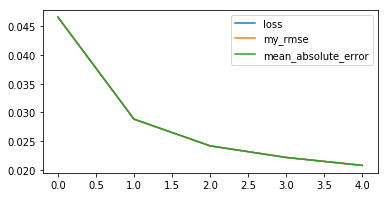

35 35 35
Removed i_.
Using all columns...


,true_train_price,true_test_price,pred_from_gen
2018-03-19 09:30:00,109.01,NaN,NaN
2018-03-19 10:30:00,108.66,NaN,NaN
2018-03-19 11:30:00,108.38,NaN,NaN
2018-03-19 12:30:00,108.06,NaN,NaN
2018-03-19 13:30:00,107.48,NaN,NaN


index,R^2,MAE,U
Value,0.378,0.441,1.33


In [185]:
def _fit_model_(model,train_generator,model_params=None,epochs=None,callbacks=None,verbose=2,workers=3):
    import bs_ds as bs
    import functions_combined_BEST as ji
    from IPython.display import display

    quiet_command = ji.quiet_mode(True,True,True)
    exec(quiet_command)
    
    if model_params is None:
        model_params={}
    model_params['fit_params'] = {'epochs':epochs}#,'callbacks':callbacks}

    # Instantiating clock timer
    clock = bs.Clock()

    print('---'*20)
    print('\tFITTING MODEL:')
    print('---'*20,'\n')     
    
    # start the timer
    clock.tic('')

    # Fit the model
    fit_params = model_params['fit_params']
    if callbacks is None:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'], 
                                       verbose=2, use_multiprocessing=True, workers=3)
    else:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'],
                                       callbacks=callbacks,
                                       verbose=2,use_multiprocessing=True, workers=3)
    # model_results = model.history.history
    clock.toc('')
    
    return model,model_params,history


#########################################################################################
# Fit keras model to train_generator

model2,model_params,history =_fit_model_(model2,train_generator,
                                          model_params=model_params,
                                          epochs=5,callbacks=callbacks)

# Get results from model.evaluate_generator()
eval_results = ji.evaluate_model_plot_history(model2, train_generator, test_generator)


#########################################################################################
#########################################################################################

# ji.reload([jik,ji])
### PREFER NEW WAY - GET DF_MODEL FIRST THEN GET EVALUATE_REGRESSION INFORMATION?
## Get true vs pred data as a dataframe and iplot
df_model2 = ji.get_model_preds_df(model2, test_generator=test_generator,
                                  true_train_series = df_train['price'],
                                  true_test_series = df_test['price'],
                                  model_params=model_params,
                                  preds_from_gen=True, 
                                  preds_from_train_preds=False, 
                                  preds_from_test_preds=False,
                                  inverse_tf=True,iplot=False)

# Get evaluation metrics
regr_evals = ji.get_evaluate_regression_dict(df_model2,metrics=['r2', 'mae', 'U'],
                                             show_results_df=True, return_as_df=True)

In [187]:
# display(df_model1.head())
ji.plotly_true_vs_preds_subplots(df_model_preds=df_model2,
                                 true_train_col='true_train_price',
                                 true_test_col='true_test_price',
                                pred_test_columns='pred_from_gen')
display(df_model2.head(2))

,true_train_price,true_test_price,pred_from_gen
2018-03-19 09:30:00,109.01,NaN,NaN
2018-03-19 10:30:00,108.66,NaN,NaN


### Model 2 Results

In [ ]:
dfs_results2

Pred Shifted,R^2,RMSE,U
-4,-1.106,0.533,1.104
-3,0.16,0.423,0.707
-2,0.674,0.325,0.595
-1,0.687,0.383,0.836
0,0.378,0.598,1.33
1,-0.047,0.765,2.032
2,-0.377,0.884,2.34
3,-0.63,0.969,2.541


[i] Figure saved as assets/model2_true_vs_preds
[i] df_model saved as assets/model2_df_model_true_vs_preds.csv
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               
[i] df_results saved as assets/model2_df_results.csv
[i] df_shifted saved as assets/model2_df_shifted.csv


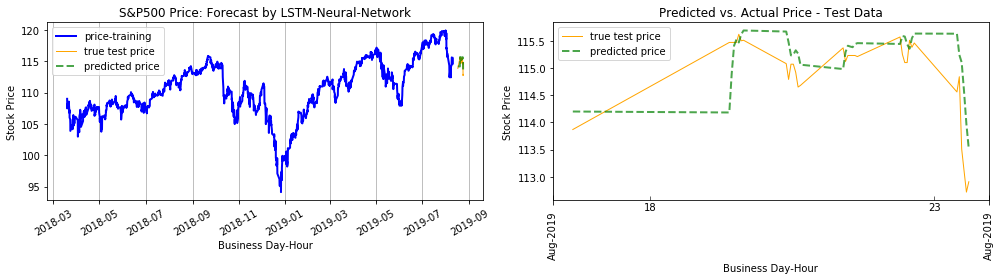

In [188]:
# Compare predictions if predictions timebins shifted
df_results2, dfs_results2, df_shifted2 =\
ji.compare_eval_metrics_for_shifts(df_model2['true_test_price'],
                                   df_model2['pred_from_gen'],
                                   shift_list=np.arange(-4,4,1),
                                   true_train_series_to_add=df_model2['true_train_price'],
                                   display_results=True,
                                   return_styled_df=True,
                                   display_U_info=False,
                                   return_shifted_df=True,
                                   return_results=True)

ji.plot_true_vs_preds_subplots(df_model2['true_train_price'],
                               df_model2['true_test_price'],
                               df_model2['pred_from_gen'], #.shift(-1),
                               save_fig=True,
                               filename =file_dict['model2']['fig']);
##SAVING DFS
save_model_dfs(file_dict,'model2',
               df_model=df_model2,
              df_results=dfs_results2,
              df_shifted=df_shifted2)

[i] Figure saved as assets/model2_true_vs_preds_shifted_shift-2.png


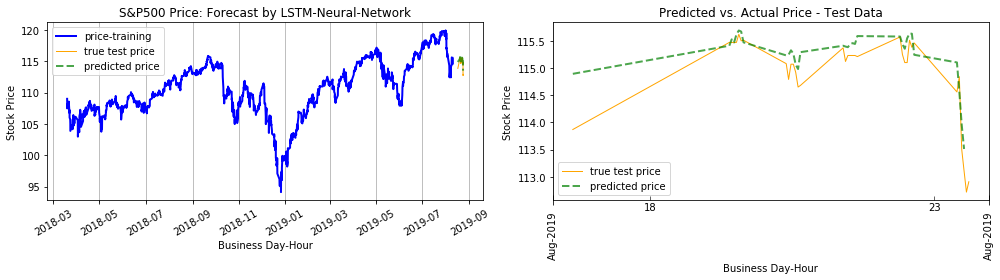

In [189]:

ji.plot_true_vs_preds_subplots(df_model2['true_train_price'],
                               df_model2['true_test_price'],
                               df_model2['pred_from_gen'].shift(-2),
                               save_fig=True,
                               filename =file_dict['model2']['fig_shifted']+'_shift-2.png');

In [191]:
save_model = True
if save_model==True:
    ji.save_model_weights_params(model2,model_params=model_params,
                                 filename_prefix='models/best_stock/model2_U-1_059', auto_increment_name=True,
                                 auto_filename_suffix=True, suffix_time_format='%m-%d-%y_%I%M%p',
                                 save_model_layer_config_xlsx=True)

Model saved as models/best_stock/model2_U-1_059_08-25-19_1037pm.json
Weights saved as models/best_stock/model2_U-1_059_08-25-19_1037pm_weights.h5


# KERAS MODEL 3 - Adding Twitter NLP Model Predictions

### IMPORTING NLP TWITTER NEURAL NETWORK Load In NLP Twitter Model

In [192]:
use_old_model=False

In [193]:

model0.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 60, 300)           2488500   
_________________________________________________________________
lstm_1 (LSTM)                (None, 60, 100)           160400    
_________________________________________________________________
lstm_2 (LSTM)                (None, 100)               80400     
_________________________________________________________________
dense_1 (Dense)              (None, 10)                1010      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 11        
Total params: 2,730,321
Trainable params: 241,821
Non-trainable params: 2,488,500
_________________________________________________________________


In [ ]:
if use_old_model===True:
    ## LOAD IN TWITTER DF (df_tokenize)
    pd.set_option('display.max_columns',None)
    df_tokenize = pd.read_csv('models/best_twitter/twitter_df_tokenized_with_price.csv',index_col=0, parse_dates=True)
    display(df_tokenize.head(3))

    ## LOAD WORD2VEC MODEL
    filename = 'models/best_twitter/word2vec_model_twitter.pickle'
    import pickle
    with open(filename,'rb') as f:
        word_model,vector_size,embedding_matrix = pickle.load(f)

    # LOAD KERAS TWITTER NLP WORDVEC MODEL AS NOT TRAINABLE
    from keras.models import model_from_json
    with open ('models/best_twitter/bestNLPmodel_best_stock_increase.json','r') as f:
        twitter_model = model_from_json(f.read())
        twitter_model.load_weights('models/best_twitter/bestNLPmodel_best_stock_increase.h5')

    for i, model_layer in enumerate(twitter_model.layers):
        twitter_model.get_layer(index=i).trainable=False
        print(model_layer,twitter_model.get_layer(index=i).trainable)


    display(twitter_model.summary())

    ## DISPLAY MODEL LAYERS' CONFIGURATION
    import function_widgets as fw
    ji.reload([jik,fw,ji])
    ji.make_qgrid_model_menu(twitter_model)

#### ~~LOADING IN TWITTER DATA TO GROUP~~

In [ ]:
# ihelp_menu(['ji.load_raw_twitter_file','ji.full_twitter_df_processing'])
ji.reload([jik,ji])
ji.ihelp(ji.load_raw_twitter_file,show_help=False)
ji.ihelp(ji.full_twitter_df_processing, show_help=False)

In [ ]:
## print('Disabled this cell on 07/31, moved to functions_combined_BEST')
    # def make_time_index_intervals(twitter_df,col ='date', start=None,end=None, freq='CBH',num_offset=1):
    #     """Takes a df, rounds first timestamp down to nearest hour, last timestamp rounded up to hour.
    #     Creates 30 minute intervals based that encompass all data."""
    #     import pandas as pd


    #     if freq=='CBH':
    #         freq=pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30')
    #         ofst = pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30') #freq=ji.custom_BH_freq()
    #         ofst_early = pd.offsets.CustomBusinessHour(n=-num_offset,start='09:30',end='16:30') #freq=ji.custom_BH_freq()
    #     if freq=='T':
    #         ofst = pd.offsets.Minute(n=num_offset)
    #         ofst_early = pd.offsets.Minute(n=-num_offset)

    #     if freq=='H':
    #         ofst = pd.offsets.Hour(n=num_offset)
    #         ofst_early=pd.offsets.Hour(n=-num_offset)

    # #     print(ofst)
    #     if start is None:
    #         # Get timebin before the first timestamp that starts     
    #         start_idx = ofst.rollback(twitter_df[col].iloc[0].floor('H'))
    #     else:
    #         start_idx = pd.to_datetime(start)

    #     if end is None:
    #         # Get timbin after last timestamp that starts 30m into the hour.
    #         end_idx= ofst.rollforward(twitter_df[col].iloc[-1].ceil('H'))
    #     else:
    #         end_idx = pd.to_datetime(end)


    #     # Make time bins using the above start and end points 
    #     print(f'start:{start_idx}, end:{end_idx}, freq:{freq}')
    #     time_range = pd.date_range(start =start_idx, end = end_idx, freq=freq)#.to_period()
    #     time_intervals = pd.interval_range(start=start_idx, end=end_idx,freq=freq,name='CBH_intervals',closed='left')

    #     return time_intervals


    # def int_to_ts(int_list, as_datetime=False, as_str=True):
    #     """Helper function: accepts one Panda's interval and returns the left and right ends as either strings or Timestamps."""
    #     import pandas as pd
    #     if as_datetime & as_str:
    #         raise Exception('Only one of `as_datetime`, or `as_str` can be True.')

    #     left_edges =[]
    #     right_edges= []

    #     for interval in int_list:

    #         int_str = interval.__str__()[1:-1]
    #         output = int_str.split(',')
    #         left_edges.append(output)
    # #         right_edges.append(right)


    #     if as_str:
    #         return left_edges#, right_edges

    #     elif as_datetime:
    #         left = pd.to_datetime(left)
    #         right = pd.to_datetime(right)
    #         return left,right


    # def bin_df_by_date_intervals(test_df,time_intervals,column='date',roll_freq='CBH'):
    #     """Uses pd.cut with half_hour_intervals on specified column.
    #     Creates a dictionary/map of integer bin codes. 
    #     Adds column"int_bins" with int codes.
    #     Adds column "left_edge" as datetime object representing the beginning of the time interval. 
    #     Returns the updated test_df and a list of bin_codes."""
    #     import pandas as pd

    #     if roll_freq=='CBH':
    #         ofst = pd.offsets.CustomBusinessHour(start='09:30',end='16:30')

    #         # Make a rolled_date column to use for bining
    #         test_df['rolled_date'] = test_df[column].apply(lambda x: ofst.rollforward(x))

    #     # Cut The Date column into interval bins, 
    #     cut_date = pd.cut(test_df['rolled_date'], bins=time_intervals)#,labels=list(range(len(half_hour_intervals))), retbins=True)
    #     test_df['int_times'] = cut_date    
    #     print(test_df.isna().sum())
    #     test_df.dropna(inplace=True)
    #     # convert to str to be used as group names/codes
    #     unique_bins = cut_date.astype('str').unique()
    #     num_code = list(range(len(unique_bins)))

    #     # Dictioanry of number codes to be used for interval groups
    #     bin_codes = dict(zip(num_code,unique_bins))#.astype('str')


    #     # Mapper dictionary to convert intervals into number codes
    #     bin_codes_mapper = {v:k for k,v in bin_codes.items()}

    #     # Add column to the dataframe, then map integer code onto it
    #     test_df['int_bins'] = test_df['int_times'].astype('str').map(bin_codes_mapper)

    #     # Get the left edge of the bins to use later as index (after grouped)
    #     edges_out =int_to_ts(test_df['int_bins'])#.apply(lambda x: int_to_ts(x))    
    #     test_df['bin_edges'] = edges_out#pd.to_datetime(edges_out)

    #     # bin codes to labels 
    #     bin_codes = [(k,v) for k,v in bin_codes.items()]

    #     return test_df, bin_codes



    # def concatenate_group_data(group_df_or_series):
    #     """Accepts a series or dataframe from a groupby.get_group() loop.
    #     Adds TweetFreq column for # of rows concatenate. If input is series, 
    #     TweetFreq=1 and series is returned."""

    #     import pandas as pd
    #     from pandas.api import types as tp

    #     if isinstance(group_df_or_series, pd.Series):

    #         group_data = group_df_or_series

    # #         group_data.index = group_df_or_series.index
    #         group_data['TweetFreq'] = 1

    #         return group_data

    #     # if the group is a dataframe:
    #     elif isinstance(group_df_or_series, pd.DataFrame):

    #         df = group_df_or_series

    #         # create an output series to collect combined data
    #         group_data = pd.Series(index=df.columns)
    #         group_data['TweetFreq'] = df.shape[0]


    #         for col in df.columns:

    #             combined=[]
    #             col_data = []

    #             col_data = df[col]
    #             combined=col_data.values

    #             group_data[col] = combined

    #     return group_data


    # def collapse_df_by_group_index_col(twitter_df,group_index_col='int_bins', new_col_order=None):
    #     """Loops through the group_indices provided to concatenate each group into
    #     a single row and combine into one dataframe with the ______ as the index"""

    #     import pandas as pd


    #     # Create a Panel to temporarily hold the group series and dataframes
    #     # group_dict_to_df = {}
    #     # create a dataframe with same columns as twitter_df, and index=group ids from twitter_groups

    #     group_indices = twitter_df.groupby(group_index_col).groups
    #     group_indices = [(k,v) for k,v in group_indices.items()]
    #     group_df_index = [x[0] for x in group_indices]


    #     # Create empty shell of twitter_grouped dataframe
    #     twitter_grouped = pd.DataFrame(columns=twitter_df.columns, index=group_df_index)
    #     twitter_grouped['TweetFreq'] =0


    #     # Loop through each group_indices
    #     for (idx,group_members) in group_indices:

    #         group_df = twitter_df.loc[group_members]

    #         # Call on concatenate_group_data to handle the merging of rows
    #         combined_series = concatenate_group_data(group_df)

    # #         twitter_grouped.loc[idx,:] = combined_series
    #         twitter_grouped.loc[idx] = combined_series#.values

    #     # Update Column order, if requested, otherwise return twitter_grouped
    #     if new_col_order==None:
    #         return twitter_grouped
    #     else:
    #         df_out = twitter_grouped[new_col_order].copy()
    #         df_out.index = group_df_index#twitter_grouped.index
    #         return df_out

# ## ORIGINAL CODE FRAMEWORK
# half_hour_intervals = make_half_hour_range(twitter_df)

# twitter_df, bin_codes = bin_df_by_date_intervals(twitter_df, half_hour_intervals)

# ## NOT A FUNCTION:
# group_indices = twitter_df.groupby('int_bins').groups
# group_indices = [(k,v) for k,v in group_indices.items()]

# twitter_grouped = collapse_df_by_group_indices(twitter_df, group_indices)#, new_col_order=new_col_order)
# # twitter_grouped.head(2)

# twitter_grouped['time_bin'] = twitter_grouped['left_edge'].apply(lambda x: pd.to_datetime(x[0]))
# twitter_grouped.set_index('time_bin',drop=True, inplace=True)
# twitter_grouped.head(2)

In [ ]:
# ##TROUBLESHOOTING INT_TO_TS USE BY BIN_DF_BY_DATE_INTERVALS
# skip=True
# if skip==False:
#     # edges =int_to_ts(test_df['int_times'])#.apply(lambda x: int_to_ts(x))    
#     ji.reload([jik,fw,ji])

#     test_df = twitter_df
#     time_intervals=ji.make_time_index_intervals(twitter_df)
#     column='date'
#     import pandas as pd
#     # Cut The Date column into interval bins, 
#     cut_date = pd.cut(test_df[column], bins=time_intervals)#,labels=list(range(len(half_hour_intervals))), retbins=True)
#     test_df['int_times'] = cut_date    

#     # convert to str to be used as group names/codes
#     unique_bins = cut_date.astype('str').unique()
#     num_code = list(range(len(unique_bins)))

#     # Dictioanry of number codes to be used for interval groups
#     bin_codes = dict(zip(num_code,unique_bins))#.astype('str')


#     # Mapper dictionary to convert intervals into number codes
#     bin_codes_mapper = {v:k for k,v in bin_codes.items()}


#     # Add column to the dataframe, then map integer code onto it
#     test_df['int_bins'] = test_df['int_times'].astype('str').map(bin_codes_mapper)
#     edges = ji.int_to_ts(test_df['int_times'])#.apply(lambda x: int_to_ts(x))    
#     test_df.int_times[-10:]
#     # edges[-10:]
#     # ji.int_to_ts(int_list, as_datetime=False, as_str=True)


#### BOOKMARK - 08/06 - 08/06

In [ ]:
# Import some functions directly
from functions_combined_BEST import ihelp, ihelp_menu, reload


## IMPORT STANDARD PACKAGES
from bs_ds.imports import *
from pprint import pprint

# Import my custom functions 
import functions_combined_BEST as ji
import my_keras_functions as jik
import function_widgets as fw
import bs_ds as bs

# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()


bs.big_pandas()
# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Reload modules in case files have been updated
reload(jik)
reload(ji)

In [ ]:
# ## DISPLAY HELP FOR STOCK FUNCTIONS
# ihelp_menu(['ji.load_stock_price_series','ji.load_raw_stock_data_from_txt','ji.set_timeindex_freq',
#            'ji.get_technical_indicators'])

In [ ]:
# ## DISPLAY HELP FOR TWITTER FUNCTIONS
# ihelp_menu(['ji.load_raw_twitter_file',
#             'ji.get_stock_prices_for_twitter_data',
#             'ji.make_time_index_intervals',
#             'ji.bin_df_by_date_intervals',
#             'ji.collapse_df_by_group_index_col',
#             'ji.full_twitter_df_processing'])#,

#### [ OLD ]LOAD IN STOCK DATA

In [ ]:
## believe this is old unused workflow
run_me = False

if run_me:
    # LOAD IN ClosingBig S&P500 stock price as series
    # stock_price = ji.load_stock_price_series()
    clock = bs.Clock()
    clock.tic()

    stock_df_min = ji.load_raw_stock_data_from_txt(clean=True, freq='T',verbose=0)
    # print(stock_df_min['filled_timebin'].value_counts())

    stock_df_min = ji.get_technical_indicators(stock_df_min,make_price_from='BidClose')
    # SELECT DESIRED COLUMNS
    stock_df_min = stock_df_min[[
        'price','ma7','ma21','26ema','12ema','MACD','20sd',
        'upper_band','lower_band','ema','momentum']].copy()#,'filled_timebin'

    # Make stock_price for twitter functions
    stock_price = stock_df_min.copy()
    stock_price.dropna(inplace=True)

    # display(stock_df_min.head(2),stock_df_min.tail(2))
    print(stock_price.index)
    display(stock_price.head(3))
    # print(stock_df_min.index.freq)
    clock.toc()

In [ ]:
### THIS METHOD WAS ABANDONED, I THINK. 
run_me = False
if run_me:
    ### LOAD IN AND PROCESS TWITTER DATA
    reload([jik,ji])

    clock = bs.Clock()
    clock.tic()

    ## LOAD IN RAW TWITTER FILE, PROCESS NLP
    twitter_df= ji.load_raw_twitter_file()
    twitter_df = ji.full_twitter_df_processing(twitter_df,
                                               cleaned_tweet_col='clean_content')

    display(twitter_df.head(3))
    print(twitter_df.index[[0,-1]],twitter_df.index.freq)
    # twitter_df_backup = twitter_df.copy()
    # clock.toc()

    ## LOAD IN STOCK PRICE DATA
    twitter_df = twitter_df.loc[stock_price.index[0]:stock_price.index[-1]];


    ## AM I SURE I WANT TO GET THE PRICE NOW?
    twitter_df = ji.get_stock_prices_for_twitter_data(twitter_df,stock_price['price'])

    display(twitter_df.head(3))
    clock.toc()
    # ji.plotly_time_series(stock_price)

In [ ]:
run_me = False

if run_me:
    twitter_df_backup = twitter_df.copy()    
    clock.tic()
    time_intervals = ji.make_time_index_intervals(twitter_df,col='B_ts_rounded')
    twitter_df, bin_codes = ji.bin_df_by_date_intervals(twitter_df ,time_intervals)

    twitter_grouped = ji.collapse_df_by_group_index_col(twitter_df, group_index_col='int_bins',
                                                       recast_index_freq=False, verbose=1)
    clock.toc()

## FINAL WORKING WORKFLOW  🧧 [@NOW ]

1. Load up stock data in CBH form
2. Load up twitter data without NLP
3. Create time_interval_bins ...
    - from *stock CBH* time index
4. Check twitter_df for any tweets from 1_hour prior
5. Extract the 'content' column and retweet/fav counts 

~~Now, compare stock_df and twitter_grouped indices to see if match
- MAYBE I ACTUALLY NEED TO START WITH STOCK_DF AS CBH, THEN PROCESS TWITTER_DF TO MATCH 

- OR:
    - Take `twitter_grouped`'s `time_bin` column as index
    - Use CBH.rollforward(on twitter_grouped.index)
    - Take fill in `STOCK_DF` with the relevant content from `twitter_grouped`
        - `content', etc. 
    - THEN RUN NLP on `content`
    
    

    

In [ ]:
# Import some functions directly
from functions_combined_BEST import ihelp, ihelp_menu, reload


## IMPORT STANDARD PACKAGES
import bs_ds as bs
from bs_ds.imports import *
from pprint import pprint

# Import my custom functions 
import functions_combined_BEST as ji
import my_keras_functions as jik
import function_widgets as fw


# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()


bs.big_pandas()
# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Reload modules in case files have been updated
reload([jik,fw,ji])


# ihelp(stock_df.index, True, False)

In [ ]:
def preview_dict(d, n=5,print_or_menu='print',return_list=False):
    """Previews the first n keys and values from the dict"""
    from pprint import pprint
    list_keys = list(d.keys())
    prev_d = {}
    for key in list_keys[:n]:
        prev_d[key]=d[key]
    
    if 'print' in print_or_menu:
        pprint(prev_d)
    elif 'menu' in print_or_menu:
        ji.display_dict_dropdown(prev_d)
    else:
        raise Exception("print_or_menu must be 'print' or 'menu'")
        
    if return_list:
        out = [(k,v) for k,v in prev_d.items()]
        return out
    else:
        pass


In [ ]:
# ## USE CODE FROM load_Raw_stock_data_from_text
# filename='IVE_bidask1min.txt'
# folderpath='data/'
# start_index = '2016-12-31'
# clean=True
# fill_or_drop_null='drop'
# fill_method='ffill'
# freq='CBH'
# verbose=2


# # Load in the text file and set headers
# fullfilename= folderpath+filename
# headers = ['Date','Time','BidOpen','BidHigh','BidLow','BidClose','AskOpen','AskHigh','AskLow','AskClose']
# stock_df = pd.read_csv(fullfilename, names=headers,parse_dates=True)

# # Create datetime index
# date_time_index = (stock_df['Date']+' '+stock_df['Time']).rename('date_time_index')
# stock_df['date_time_index'] = pd.to_datetime(date_time_index)
# stock_df.set_index('date_time_index', inplace=True, drop=False)

# # Select only the days after start_index
# stock_df = stock_df[start_index:]
# stock_df.head()

### 🧧BOOKMARK Load full stock data, unprocessed raw tweets

In [ ]:
full_df.head()

In [ ]:
# LOAD IN FULL STOCK DATASET using ClosingBig S&P500 WITH INDEX.FREQ=CBH
full_df = ji.load_processed_stock_data()

# SELECT DESIRED COLUMNS
stock_df = full_df[[
    'price','ma7','ma21','26ema','12ema','MACD',
    '20sd','upper_band','lower_band','ema','momentum','''filled_timebin'
]].copy()
stock_df.head()

stock_df['date_time'] = full_df.index.to_series()
ji.index_report(stock_df)

stock_df.sort_index(inplace=True)
display(stock_df.head(2),stock_df.tail(2))


## REPLACED BY ABOVE
    # stock_df = ji.load_raw_stock_data_from_txt(clean=True, freq='CBH',verbose=0)
    # # print(stock_df_min['filled_timebin'].value_counts())

    # stock_df = ji.get_technical_indicators(stock_df,make_price_from='BidClose')
    # # SELECT DESIRED COLUMNS
    # stock_df = stock_df[[
    #     'price','ma7','ma21','26ema','12ema','MACD','20sd',
    #     'upper_band','lower_band','ema','momentum']].copy()#,'filled_timebin'

    # # Make stock_price for twitter functions
    # stock_df.dropna(inplace=True)

    # print(stock_df.index);

In [ ]:
## LOAD IN RAW TWITTER DATA, NO PROCESSING
twitter_df= ji.load_raw_twitter_file(filename='data/trump_tweets_01202017_06202019.csv',
                                     date_as_index=True,
                                     rename_map={'text': 'content', 'created_at': 'date'})

twitter_df.sort_index(inplace=True)
ji.index_report(twitter_df)
twitter_df.head(3)

In [ ]:
ihelp_menu(['ji.make_time_index_intervals'])


#### and now...
- have int_bins for both dataframes.
- want to bin all of the data using `int_bins` (Even tho `int_bins` is for 24 hours, not BUSINESS HOURS)
    - use the `collapse_df_by_group_index_col` function on BOTH df's first
    - then concat/merge/join
    

In [ ]:
# MAKE TIME INTERVALS BASED ON BUSINESS HOUR START (09:30-10:30)
ji.reload([jik,fw,ji])
clock = bs.Clock(verbose=1)

clock.tic()
time_intervals= \
ji.make_time_index_intervals(stock_df,
                             col='date_time', 
                             closed='right',
                             return_interval_dicts=False) 
clock.lap('time_intervals created.')


## USE THE TIME INDEX TO FILTER OUT TWEETS FROM THE HOUR PRIOR
twitter_df, bin_codes = ji.bin_df_by_date_intervals(twitter_df ,time_intervals)
stock_df, bin_codes_stock = ji.bin_df_by_date_intervals(stock_df, time_intervals, column='date_time')

clock.lap('bins added to dataframes')
# display(twitter_df.head(2), stock_df.head(2))

## COLLAPSE DFs BY CODED BINS
twitter_grouped = ji.collapse_df_by_group_index_col(twitter_df,
                                                    group_index_col='int_bins',
                                                    drop_orig=True,
                                                    verbose=0)

stocks_grouped = ji.collapse_df_by_group_index_col(stock_df,
                                                    drop_orig=True,
                                                    group_index_col='int_bins', 
                                                  verbose=0)

clock.toc('collapsed dfs to _grouped')
display(twitter_grouped.head(3),stocks_grouped.head(3))

In [ ]:
def merge_stocks_and_tweets(stocks_grouped,twitter_grouped, on='int_bins',how='left', show_summary=True):
    """Takes stocks_grouped and twitter_grouped dataframes grouped by hour bins, merges
    them on the 'int_bins' columns."""
    def fix_tweet_times(x):
        time_format="%Y-%m-%d %T"
        if isinstance(x,pd.Timestamp) | isinstance(x,pd.DatetimeIndex):
            return x.strftime(time_format)

        elif  isinstance(x,list) |  isinstance(x,np.ndarray):
            ts = [pd.to_datetime(t,format=time_format) for t in x] 
    #         ts = [t.strftime(time_format) for t in x]#ts]
            return ts

        elif pd.isnull(x): 
    #         print('null')
            return x

        else: 
            ts= pd.to_datetime(str(x)) 
            timestring = ts.strftime(time_format)        #x.strftime(time_format)
            return timestring

    ## MERGE DATAFRAMES
    df_combined = pd.merge(stocks_grouped,twitter_grouped, on='int_bins',how='left')#,indicator=True)

    ## ADDING COLUMNS TO WEED THROUGH MISSING DATA FROM MERGER
    df_combined['has_tweets'] = ~df_combined['group_content'].isna()
    df_combined['has_stocks'] = ~df_combined['price'].isna()
    df_combined['has_both'] =(df_combined['has_tweets']==True) & (df_combined['has_stocks']==True)# 


    ## CLEAN UP DATAFRAME
    # Drop redundant cols
    drop_cols = ['date','int_times_y','time_bin_y','time_bin_x','num_per_bin_x']
    df_combined.drop(drop_cols,axis=1,inplace=True)

    # Rename distinct stock vs tweet columns
    rename_map = {'date_time_index_y':'tweet_times',
                 'date_time_index_x':'stock_times',
                  'int_times_x':'int_times',
                  'num_per_bin_y':'num_tweets',
                  'int_times_x':'int_tweets_for_stocks'
                 }
    df_combined  = df_combined.rename(axis=1,mapper=rename_map)

    ## Add fixed ts for tweet_times
    df_combined['tweet_times'] = df_combined['tweet_times'].apply(lambda x: fix_tweet_times(x))

    df_combined.set_index('date_time', inplace=True,drop=False)
    
    if show_summary:
        n=3
        display(df_combined.groupby('has_both').head(3))
        display(df_combined.loc[ df_combined['num_tweets']>1].head(n))
    return df_combined

## STOCKS AND TWEETS 
df_combined = merge_stocks_and_tweets(stocks_grouped, 
                                      twitter_grouped,
                                      on='int_bins',how='left',
                                      show_summary=True)

In [ ]:
# ji.df_head_tail(df_combined)

In [ ]:
# def fix_tweet_times(x):
#     time_format="%Y-%m-%d %T"
#     import datetime as dt
#     import dateutil

#     if isinstance(x,pd.Timestamp) | isinstance(x,pd.DatetimeIndex):
# #         print('Was timestamp or datetimeindex')#type(x))
#         return x.strftime(time_format)

#     elif pd.isnull(x):
#         return x

#     elif  isinstance(x,list) |  isinstance(x,np.ndarray):
# #         ts = pd.to_datetime(x)
#         ts = [t.strftime(time_format) for t in x]#ts]
#         return ts
#     else:
#         return np.nan
# #
    
# df_combined['test_tweet_times'] = df_combined['tweet_times'].apply(lambda x: fix_tweet_times(x))
# df_combined[['has_both','test_tweet_times']].groupby('has_both').head()

#### ~~BOOKMARK - DF READY FOR NLP - >MODELING~~

In [ ]:
df_combined.to_csv('df_combined.csv')#,index_col=0,parse_dates=True)
df_combined = pd.read_csv('df_combined.csv',index_col=0,parse_dates=True)
df_combined.groupby('has_both').head(2)

In [ ]:
df_combined['group_content'].fillna(" ",inplace=True)

df_nlp = ji.full_twitter_df_processing(df_combined,'group_content',force=True)
display(df_nlp.head())
ji.column_report(df_nlp)

In [ ]:
# ## LOAD IN TWITTER DF (df_tokenize)
# pd.set_option('display.max_columns',None)
# df_tokenize = pd.read_csv('models/best_twitter/twitter_df_tokenized_with_price.csv',index_col=0, parse_dates=True)
# display(df_tokenize.head(3))

# ## LOAD WORD2VEC MODEL
# filename = 'models/best_twitter/word2vec_model_twitter.pickle'
# import pickle
# with open(filename,'rb') as f:
#     word_model,vector_size,embedding_matrix = pickle.load(f)

# # LOAD KERAS TWITTER NLP WORDVEC MODEL AS NOT TRAINABLE
# from keras.models import model_from_json
# with open ('models/best_twitter/bestNLPmodel_best_stock_increase.json','r') as f:
#     twitter_model = model_from_json(f.read())
#     twitter_model.load_weights('models/best_twitter/bestNLPmodel_best_stock_increase.h5')
    
# for i, model_layer in enumerate(twitter_model.layers):
#     twitter_model.get_layer(index=i).trainable=False
#     print(model_layer,twitter_model.get_layer(index=i).trainable)
    
    

In [ ]:
import functions_combined_BEST as ji
import functions_nlp as jic
ji.reload([jic,ji])
# ihelp(jiTEXT,False,True)

In [ ]:
## MOVED TO functions_nlp.TEXT
## class TEXT(object):
#     """Class intended for preprocessing text for use with Word2Vec vectors, Kera's Tokenizer, 
#     creating FreqDists and an embedding_layer for Kera's models.
#     TEXT = TEXT(text_data, text_labels, word2vecmodel)"""
    
#     def __init__(self,df, text_data_col,text_labels_col=None,word2vec_model=None):
#         """Initializes the class with the text_data (series), text_labels (y data), and a word2vecmodel.
#         Performs all processing steps on entire body of text to generate corupus-wide analyses. 
#         i.e. FreqDist, word2vec models, fitting tokenzier
        
#         - if no word2vec model is provided, one is fit on the text_data using TEXT.fit_word2vec()
#         - calls on fit_tokenizer() to fit keras tokenizer to text_sequences.
#         text_data and text_labels are saved as TEXT._text_data_ and TEXT._text_labels_"""
        
#         ## Save text_data
#         text_data = df[text_data_col].copy()
#         self._text_data_ = text_data        
        
#         ## Save or create empty text_labels
#         if text_labels_col is not None:
#             text_labels = df[text_labels_col].copy()
#         else:
#             text_labels = np.empty(len(text_data))
#             text_labels[:] = pd.Series(np.nan)
            
#             text_labels_col='text_labels'
#             df[text_labels_col] = text_labels
            
#         self._text_labels_ = text_labels
        
        
#         ## SAVE TO INTERNAL DATAFRAME
#         self.df = pd.concat([df[text_data_col],df[text_labels_col]],axis=1)
#         self.df.columns=['input_text_data','raw_text_labels']
#         ## CALL ON PREPARE_DATA FUNCTIONS

#         ## Prepare text_body for corpus-wide operations
#         self.prepare_text_body()

#         ## Fit word2vec model if not provided
#         if word2vec_model is None:
#             self.fit_word2vec(self.tokenized_text_body)
#         else:
#             self.wv= word2vec_model.wv 
#             self._word2vec_model_ = word2vec_model        

#         wv = word2vec_model.wv
        
#         ## Fit keras tokenizer
#         self.fit_tokenizer()
        
#         ## Get FreqDist
#         self.make_freq_dist()
        
#         ## Create Embedding Layer
#         self.get_embedding_layer(return_layer=False)
        

        
#     def prepare_text_body(self,text_data_to_prep=None,delim=','):
#         """Joins, regexp_tokenizes text_data"""
#         #         text_data_to_prep=[]
#         if text_data_to_prep is None:
#             text_data_to_prep = self._text_data_


#         if isinstance(text_data_to_prep,list) | isinstance(text_data_to_prep, np.ndarray) \
#         | isinstance(text_data_to_prep,pd.Series):
#         #             text_joined = delim.join(text_data)
#             print('prepare_text: type=',type(text_data_to_prep))
#         #             print(text_data_to_prep)
#             text_data_to_prep =  delim.join(text_data_to_prep)
#         else:
#             print('prepare_text: text not list, array, or series')

#         self._text_body_for_processing_ = text_data_to_prep

#         tokenized_text =  self.regexp_tokenize(text_data_to_prep)
#         self.tokenized_text_body = tokenized_text
#         print('Text processed and saved as TEXT.tokenized_text')       

        

#     def make_stopwords_list(incl_punc=True, incl_nums=True, 
#                             add_custom= ['http','https','...','…','``','co','“','’','‘','”',
#                                          "n't","''",'u','s',"'s",'|','\\|','amp',"i'm"]):
#         from nltk.corpus import stopwords
#         import string

#         stopwords_list = stopwords.words('english')
#         if incl_punc==True:
#             stopwords_list += list(string.punctuation)
#         stopwords_list += add_custom #['http','https','...','…','``','co','“','’','‘','”',"n't","''",'u','s',"'s",'|','\\|','amp',"i'm"]
#         if incl_nums==True:
#             stopwords_list += [0,1,2,3,4,5,6,7,8,9]
            
#         self._stopwords_list_ = stopwords_list

#         return  stopwords_list


#     def apply_stopwords(text_data, stopwords_list=None, tokenize=True,
#                         pattern = "([a-zA-Z]+(?:'[a-z]+)?)",return_tokens=False):
#         """EX: df['text_stopped'] = df['content'].apply(lambda x: apply_stopwords(stopwords_list,x))"""
#         from nltk import regexp_tokenize

#         if stopwords_list is None:
#             stopwords_list = self.make_stopwords_list()
            
# #         if text_data is None:
# #             text_data = self._text_data_
            
#         if tokenize==True:
#             tokenized_text = self.regexp_tokenize()


#         stopped_text = [x.lower() for x in text_data if x.lower() not in stopwords_list]

#         if return_tokens==True:
#             return regexp_tokenize(' '.join(stopped),pattern)
#         else:
#             return ' '.join(stopped)
        
        
        
#     def fit_word2vec(self,text_data,vector_size=300, window=5, min_count=2, workers=3, epochs=10):
#         """Fits a word2vec model on text_data and saves the model.wv object as TEXT.wv and the full model
#         as ._word2vec_model_"""
#         from gensim.models import Word2Vec
# #         vector_size = 300
#         wv_keras = Word2Vec(text_data, size=vector_size, window=window, min_count=min_count, workers=workers)
#         wv_keras.train(text_data,total_examples=wv_keras.corpus_count, epochs=epochs)
                       
#         self._word2vec_model_ =  wv_keras                       
#         self.wv =  wv_keras.wv
# #         vocab_size = len(wv_keras.wv.vocab)
        
        
#         print(f'There are {vocab_size} words in the word2vec vocabulary (TEXT.wv), with a vector size {vector_size}.')
    
#     def fit_tokenizer(self,text_data=None,labels=None):
#         """Fits Keras Tokenizer using tokenizer.fit_on_texts to create TEXT.X_sequences and 
#         also saves the labels as TEXT.y
#         Tokenizer is saved as TEXT._tokenizer_. 
#         Word Index (tokenizer.index_word)  is saved as TEXT.word_index
#         Reverse dictionary is saved as TEXT.reverse_index"""
#         if text_data is None:
#             text_data = self.tokenized_text_body #_text_data_
#         if labels is None:
#             text_labels = self._text_labels_
            
#         from keras.preprocessing.text import Tokenizer                   
#         tokenizer = Tokenizer(num_words=len(self.wv.vocab))
#         tokenizer.fit_on_texts(list(text_data) )#tokenizer.fit_on_texts(text_data)

#         self._tokenizer_ = tokenizer
#         self.word_index = tokenizer.index_word
#         self.reverse_index =  {v:k for k,v in self.word_index.items()}
        
#         ## GET SEQUENCES FROM TOKENIZER
#         X_sequences = self.text_to_sequences(text_data = text_data)
#         self.X_sequences  = X_sequences
        
#         y = text_labels
#         self.y = y
#         print('tokenizer fit and TEXT.X_sequences, TEXT.y created')


        
#     def text_to_sequences(self, text_data = None, regexp_tokenize=False):
#         """Uses fit _tokenzier_ to create X_sequences
#         from tokenzier.texts_to_sequences"""
#         if text_data is None:
#             text_data = self.tokenized_text_body #_text_data_
#         elif regexp_tokenize:
#                 if isinstance(text_data,pd.Series) | isinstance(text_data, pd.DataFrame):
#                     text_data = text_data.apply(lambda x: self.regexp_tokenize(x))
#                 else:
#                     text_data = self.regexp_tokenize(text_data)
            
#         tokenizer = self._tokenizer_
        
#         from keras.preprocessing import text, sequence
#         X = tokenizer.texts_to_sequences(text_data)
#         X_sequences = sequence.pad_sequences(X)
        
#         return X_sequences

#     def sequences_to_text(self,sequences=None):
#         """Return generated sequences back to original text"""
#         if sequences is None:
#             sequences = self.X_sequences
        
#         tokenizer = self._tokenizer_
#         text_from_seq = tokenizer.sequences_to_texts(sequences)
    
#     def regexp_tokenize(self,text_data=None,pattern="([a-zA-Z]+(?:'[a-z]+)?)"):
#         """Apply nltk's regex_tokenizer using pattern"""
#         if text_data is None:
#             text_data = self._text_body_for_processing_
# #             text_data = self._text_data_

#         if pattern is None:
#             pattern = "([a-zA-Z]+(?:'[a-z]+)?)"
#         self._pattern_ = pattern #= "([a-zA-Z]+(?:'[a-z]+)?

#         # CREATING TEXT DICT FOR FREQUENCY DISTRIBUTIONS
#         from nltk import regexp_tokenize
#         try:
#             tokenized_data = regexp_tokenize(text_data, pattern)
#         except:
#             print('Error using regexp_tokenize')
#             print(f"Data Type:\t{type(text_data)}")
#             print(text_data)#[:100])
# #         self.tokens = tokenized_data
#             return None
#         return tokenized_data

#     def get_embedding_layer(self,X_sequences = None,input_size=None, return_matrix=False, return_layer=True):
#         """Uses the word2vec model to construct an embedding_layer for Keras models.
#         To override the default size of the input for the embedding layer, provide an input_size value
#         (which will likely be the size of hte vocabulary being fed in for predictions)."""
#         if X_sequences is None:
#             X_sequences = self.X_sequences
            
#         vocab_size = len(self.wv.vocab)
#         vector_size = self.wv.vector_size
            
#         ## Create the embedding matrix from the vectors in wv model 
#         embedding_matrix = np.zeros((len(word_model.wv.vocab) + 1, vector_size))
#         for i, vec in enumerate(self.wv.vectors):
#             embedding_matrix[i] = vec
#             embedding_matrix.shape
#         self._embedding_matrix_ = embedding_matrix
        
#         from keras import layers 

        
#         embedding_layer =layers.Embedding(vocab_size+1,
#                                           vector_size,
#                                           input_length=X_sequences.shape[1],
#                                           weights=[embedding_matrix],
#                                           trainable=False)
#         self.embedding_layer = embedding_layer
        
#         ## Return outputs
#         return_list=[]
#         if return_matrix:
#             return_list.append(embedding_matrix)
#         if return_layer:
#             return_list.append(embedding_layer)
#         return return_list[:]
        
#     def make_freq_dist(self, plot=False):
#         """ Fits nltk's FreqDist on tokenized text and saved as .freq_dist"""
#         from nltk import FreqDist
#         freq_dist = FreqDist(self.tokenized_text_body)
#         self.FreqDist = freq_dist
        
#         if plot==True:
#             self.freq_dist_plot()
        
#     def freq_dist_plot(self, top_n_words=25):
#         """Create FreqDist plot of top_n_words"""
#         try:
#             self.FreqDist
#         except AttributeError:
#             self.make_freq_dist()
#         with plt.style.context('seaborn-notebook'):
#             self.freq_dist.plot(top_n_words)
        
    
#     def summary_report(self):
#         """Print summary info about word2vec vocab, vectors, tokenized_text and embedding matrix"""
#         print(f"Word2Vec Vocabulary Size = {len(self.wv.vocab)}")
#         print(f"Word2Vec vector size = {self.wv.vector_size}")
#         print(f"\nLength of tokenized_text = {len(self.tokenized_text_body)}")
#         print(f"_embedding_matrix_ size = {self.embedding_layer.shape}")
        
        
#     def prepare_text_sequences(self, process_as_tweets=True, tweet_final_col='cleaned_tweets'):
#         """Individually process each entry in text_data for stopword removal and tokenization:
#         stopwords_list = TEXT.make_stopwords_list()"""
#         self.make_stopwords_list()

#         if process_as_tweets:
#             self.tweet_specific_processing(tweet_final_col='cleaned_tweets')
#             text_to_process = self.df[tweet_final_col]
#             colname_base = tweet_final_col
#         else:
#             text_to_process = self.df['input_text_data']
#             colname_base = 'text'
        
#         # Get stopped, non-tokenzied text
#         proc_text_series = text_to_process.apply(lambda x: self.apply_stopwords(x,
#                                                                                 stopwords_list=None,
#                                                                                 tokenize=True,
#                                                                                 return_tokens=False))
#         self.df[colname_base+'_stopped'] = proc_text_series
        
#         # Get stopped-tokenized text
#         proc_text_tokens = text_to_process.apply(lambda x: self.apply_stopwords(x,
#                                                                         stopwords_list=None,
#                                                                         tokenize=True,
#                                                                         return_tokens=True))
#         self.df[colname_base+'_stopped_tokens'] = proc_text_tokens

        
#     def tweet_specific_processing(self,tweet_final_col='cleaned_tweets'):
#         import re
#         # Get initiial df
#         df = self.df
        
#         raw_tweet_col = 'input_text_data'
#         fill_content_col = tweet_final_col

#         ## PROCESS RETWEETS
#         df['has_RT']=df[raw_tweet_col].str.contains('RT')
#         df['starts_RT']=df[raw_tweet_col].str.contains('^RT')
        
#         re_RT = re.compile('RT [@]?\w*:')

#         df['content_starts_RT'] = df[raw_tweet_col].apply(lambda x: re_RT.findall(x))
#         df[fill_content_col] =  df[raw_tweet_col].apply(lambda x: re_RT.sub(' ',x))
        
        
#         ## PROCESS URLS
#         urls = re.compile(r"(http[s]?://\w*\.\w*/+\w+)")
        
#         check_content_col = fill_content_col
#         df['content_urls'] = df_full[check_content_col].apply(lambda x: urls.findall(x))
#         df[fill_content_col] =  df[check_content_col].apply(lambda x: urls.sub(' ',x))

#         ## PROCESS HASHTAGS
#         hashtags = re.compile(r'\#\w*')

#         df['content_hashtags'] =  df[check_content_col].apply(lambda x: hashtags.findall(x))
#         df[fill_content_col] =  df[check_content_col].apply(lambda x: hashtags.sub(' ',x))
        
#         ## PROCESS MENTIONS
#         # Remove and save mentions (@)'s
#         mentions = re.compile(r'\@\w*')
#         df['content_mentions'] =  df[check_content_col].apply(lambda x: mentions.findall(x))
#         df[fill_content_col] =  df[check_content_col].apply(lambda x: mentions.sub(' ',x))

        
#         self.df = df 
#         def empty_lists_to_strings(x):
#             """Takes a series and replaces any empty lists with an empty string instead."""
#             if len(x)==0:
#                 return ' '
#             else:
#                 return ' '.join(x) #' '.join(tokens)
        
#         def help(self):
#             """
#             Initialize TEXT with a df containing the text_data, text_labels(for classificaiton),
#             and a word2vec model.
#             >> txt = TEXT(df_combined,'content_stop',None,word_model)
            
#             ## FOR GETTING X SEQUENCES FOR NEW INPUT TEXT
#             * To get sequences for each row in a series:
#             >> text_series = df_combined['content_min_clean']
#             >> X_seq = txt.text_to_sequences(text_series,regexp_tokenize=True)
            
#             * To revert generated sequneces back to text:
#             >> text_from_seq = txt.sequences_to_text(X_seq)
            
#             ## TO GET CORPUS-WIDE NLP PROCESSING:
#             * for word frequencies:
#             >> txt.freq_dist.#[anything you can get from nltk's FreqDist]
#             """

In [ ]:
ji.reload([jic,ji])

## LOAD WORD2VEC MODEL
filename = 'models/best_twitter/word2vec_model_twitter.pickle'
import pickle
with open(filename,'rb') as f:
    word_model,vector_size,embedding_matrix = pickle.load(f)

TEXT = jiTEXT(df_combined,'content_stop',text_labels_col=None,word2vec_model=word_model)
# txt.x

### Load in former NLP model and change embedding_layer size

In [ ]:
## [ ] Replace with ji.load_model_weights_params(but need to specify weight name)
# LOAD KERAS TWITTER NLP WORDVEC MODEL AS NOT TRAINABLE
from keras.models import model_from_json
with open ('models/best_twitter/bestNLPmodel_best_stock_increase.json','r') as f:
    twitter_model = model_from_json(f.read())
    twitter_model.load_weights('models/best_twitter/bestNLPmodel_best_stock_increase.h5')
    
for i, model_layer in enumerate(twitter_model.layers):
    twitter_model.get_layer(index=i).trainable=False
    print(model_layer,twitter_model.get_layer(index=i).trainable)
    
    
display(twitter_model.summary())

## DISPLAY MODEL LAYERS' CONFIGURATION
import function_widgets as fw
ji.reload([jik,fw,jic,ji])
# ji.make_qgrid_model_menu(twitter_model)

In [ ]:
## MOVED TO functions_nlp
# def replace_embedding_layer(twitter_model, input_text_series, TEXT, verbose=2):
#     """Takes the original Keras model with embedding_layer, a series of new text, a TEXT object,
#     and replaces the embedding_layer (layer[0]) with a new embedding layer with the correct size for new text"""
#     ## CONVERT MODEL TO JSON, REPLACE OLD INPUT LAYER WITH NEW ONE FROM TEXT object
#     json_model = twitter_model.to_json()
#     from functions_nlp import TEXT
#     # pprint(json_model)
#     import json
#     json_model = json.loads(json_model)
#     # ji.display_dict_dropdown(json_model)

#     if verbose>0:## Find the exact parameters for shape size that need to change
#         print('---'*10,'\n',"json_model['config']['layers'][0]:")
#         print('\t','batch_input_shape: ',json_model['config']['layers'][0]['config']['batch_input_shape'])
#         print('\t','input_dim: ',json_model['config']['layers'][0]['config']['input_dim'])
#         print('\t','input_length:',json_model['config']['layers'][0]['config']['input_length'])


#     # Save layer 0 as separate variable to edit, and then replace in the dict
#     layer_0 = json_model['config']['layers'][0]
#     if verbose>0:
#         ji.display_dict_dropdown(layer_0);
        
        
#     ## FOR SEQUENCES FROM EXTERNAL NEW TEXT (tweets):
#     X_seq = TEXT.text_to_sequences(input_text_series,regexp_tokenize=True)

#     if verbose>0:
#         ## To get Text back from X_seq:
#         # text_from_seq = TEXT.sequences_to_text(X_seq)
#         print('(num_rows_in_df, num_words_in_vocab)')
#         print(X_seq.shape)
        
#     ## Get new embedding layer's config  (that is fit to new text)
#     output = TEXT.get_embedding_layer(X_sequences=X_seq,input_size=X_seq.shape[1])
#     new_emb_config = output[0].get_config()
    
#     ## Copy original model
#     new_json_model = json_model
    
#     ## Replace old layer 0  config with new_emb_config
#     new_json_model['config']['layers'][0]['config'] = new_emb_config
    
#     # convert model to string (json.dumps) so can use model_from_json
#     string_model = json.dumps(json_model)    
    
#     ## Make model from json to return 
#     from keras.models import model_from_json
#     new_model = model_from_json(string_model)
    
#     return new_model

### Work in Progress - Jump over to model 3 loading of df

In [ ]:
run_me = False

In [ ]:
if run_me:
    ji.reload([jik,fw,jic,ji])
    txt = jiTEXT(df_combined,'content_stop',text_labels_col=None,word2vec_model=word_model) # 'content_stop'

    ## FOR SEQUENCES FROM EXTERNAL NEW TEXT (tweets):
    # input_text_series=df_combined['content_min_clean']

    # Get X_Sequences for full dataframe from intput_text_series
    X_seq = txt.text_to_sequences(text_data=input_text_series,regexp_tokenize=True) # text_data= None?

    new_twitter_model = txt.replace_embedding_layer(twitter_model,input_text_series)
    new_twitter_model.summary()

    ##
    print(X_seq.shape)
    print(len(X_seq[0]))
    ##
    np.shape(txt.X_sequences)

    txt_back = txt.sequences_to_text(txt.X_sequences)
    [ x for x in txt_back if '' not in x]

In [ ]:
# ## [IN FUNC] CONVERT MODEL TO JSON, REPLACE OLD INPUT LAYER WITH NEW ONE FROM TEXT object
# json_model = twitter_model.to_json()
# # pprint(json_model)
# import json
# json_model = json.loads(json_model)
# # ji.display_dict_dropdown(json_model)

# ## Find the exact parameters for shape size that need to change
# print('---'*10,'\n',"json_model['config']['layers'][0]:")
# print('\t','batch_input_shape: ',json_model['config']['layers'][0]['config']['batch_input_shape'])
# print('\t','input_dim: ',json_model['config']['layers'][0]['config']['input_dim'])
# print('\t','input_length:',json_model['config']['layers'][0]['config']['input_length'])


# # Save layer 0 as separate variable to edit, and then replace in the dict
# layer_0 = json_model['config']['layers'][0]
# ji.display_dict_dropdown(layer_0);

# ## [IN FUNC] FOR SEQUENCES FROM EXTERNAL NEW TEXT (tweets):
# X_seq = TEXT.text_to_sequences(df_combined['content_min_clean'],regexp_tokenize=True)

# ## To get Text back from X_seq:
# # text_from_seq = TEXT.sequences_to_text(X_seq)
# print('(num_rows_in_df, num_words_in_vocab)')
# print(X_seq.shape)

# # [IN FUNC]
# output = TEXT.get_embedding_layer(X_sequences=X_seq,input_size=X_seq.shape[1])
# new_emb_config = output[0].get_config()
# pprint(new_emb_config)

# layer_0['config']

# ## IN FUNC
# json_model['config']['layers'][0]['config'] = new_emb_config
# string_model = json.dumps(json_model)

# from keras.models import model_from_json
# new_twitter_model = model_from_json(string_model)
# new_twitter_model.summary()

In [ ]:
if run_me:
    ## GET PREDICTIONS FROM NEW MODEL
    preds = new_twitter_model.predict_classes(X_seq)
    print(type(preds), preds.shape)

In [ ]:
if run_me:
    ## ADD PREDICTIONS TO DF_COMBINED
    df_combined['pred_classes'] = preds
    display(df_combined.head())

    print(df_combined['pred_classes'].value_counts())
    df_combined['has_tweets'].value_counts(), 

In [ ]:
# layer_0['config']['batch_input_shape'] =  [None, X_seq.shape[1]] # or make 0, X_seq.shape[1]?
# layer_0['config']['input_length'] = X_seq.shape[1]
# layer_0['config'] 

# KERAS MODEL 3 (for real):

## BOOKMARK - NOW THAT HAVE PREDICTIONS FOR EACH HOUR, MAKE NEW STOCK MODEL

In [ ]:
# df_combined.to_csv('df_combined_ready_model3.csv')#,index_col=0,parse_dates=True)
df_combined_ = pd.read_csv('df_combined_ready_model3.csv',index_col=0,parse_dates=True)
df_combined_.groupby('has_both').head(2)

In [ ]:
df_combined_.columns

In [ ]:
## Make a list of all columns to be used in training the model
model_col_list = ['price', 'ma7', 'ma21', '26ema', '12ema', 'MACD', '20sd', 'upper_band',
       'lower_band', 'ema', 'momentum', 'case_ratio', 'compound_score', 'pred_classes']

df_to_model = df_combined_[model_col_list].copy()

print(df_to_model['price'].isna().sum())
df_to_model.index.freq=ji.custom_BH_freq()
print(df_to_model['price'].isna().sum())
df_to_model.head()

In [ ]:
use_prior_train_test_data=False
## To do:
# list_of_days_for_x_windows for parameter tuning

if use_prior_train_test_data == False:
    print('Making new df_train and df_test')
    
    ################# USER PARAMETERS: Define data parameters for train_test_split  ##############
    model_params={}
    model_params['data_params'] = ji.def_data_params(df_to_model,
                                                     num_test_days=10, num_train_days=365, 
                                                     days_for_x_window=1, verbose=0)
    ###############################################################################################


    ###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######
    dp = model_params['data_params']
    df_train, df_test = ji.train_test_split_by_last_days(df_to_model,
                                                         periods_per_day = dp['periods_per_day'], 
                                                         num_test_days   =  dp['num_test_days'],
                                                         num_train_days  =  dp['num_train_days'],
                                                         verbose=0, iplot=False)

    display(df_train.head(2).style.set_caption('df_train - pre-scaling'))
    # ji.display_dict_dropdown(model_params)

    ###### RESCALE DATA USING MinMaxScalers FIT ON TRAINING DATA's COLUMNS ######
    scaler_library, df_train, model_params = ji.make_scaler_library(df_train, 
                                                                    transform=True,
                                                                    model_params=model_params,
                                                                    verbose=2)

    df_test = ji.transform_cols_from_library(df_test,col_list=None,col_scaler_dict=scaler_library,
                                                          scaler_library=scaler_library,inverse=False)

# Show transformed dataset
display( df_train.head(2).round(3).style.set_caption('training data - scaled'))#,
    #         df_test.head(2).round(3).style.set_caption('test data'))



################# USER PARAMETERS: Define n_Features and batch sizes for generators  ##############
# Create timeseries generators
train_generator, test_generator, model_params =\
    ji.make_train_test_series_gens(train_data_series=df_train, test_data_series=df_test,y_cols='price',
                                   n_features=len(df_train.columns),batch_size=1, model_params=model_params,
                                   verbose=1)
ji.display_dict_dropdown(model_params)

train_generator[0][0].shape

In [ ]:
###############################################################################################

# # ji.display_dict_dropdown(model_params)
# funcs_make_model = ['make_train_test_series_gens','def_callbacks_and_params',
#                   'def_compile_params_optimizer','make_model1'] 
# ihelp_menu(funcs_make_model)

def _def_callbacks_and_params_(model_params=None,loss_function='mae',checkpoint_mode='min',filepath=None,
                             stop_mode='min',patience=1,min_delta=.005,verbose=1):
    import functions_combined_BEST as ji
    

            ########## Define loss function and callback params ##########
    callback_params ={}
    callback_params['custom_loss_function'] = loss_function
    callback_params['ModelCheckpoint'] = {'monitor': loss_function, 'mode':checkpoint_mode}
    callback_params['EarlyStopping'] = {'monitor':loss_function, 'mode':stop_mode, 
                                        'patience':patience, 'min_delta':min_delta}

    # CREATING CALLBACKS
    from keras import callbacks

    if filepath is None:
        filepath = f"models/checkpoints/model1_weights_{ji.auto_filename_time(prefix=None)}.hdf5"

    if 'my_rmse' in loss_function:
        import functions_combined_BEST as ji
        loss_function = ji.my_rmse
#         my_rmse=my_rmse
#         loss_function = my_rmse

    # Create ModelCheckPoint
    fun_params=callback_params['ModelCheckpoint']
    checkpoint = callbacks.ModelCheckpoint(filepath=filepath, monitor=loss_function, mode=fun_params['mode'],
                                           save_best_only=True, verbose=verbose)
    # Create EarlyStopping
    fun_params=callback_params['EarlyStopping']
    early_stop = callbacks.EarlyStopping(monitor=loss_function, mode=fun_params['mode'], patience=fun_params['patience'],
                                         min_delta=fun_params['min_delta'],verbose=verbose)
    callbacks = [checkpoint,early_stop]

    if model_params is None:
        model_params=callback_params
    else:
        model_params['callbacks'] = callback_params
    return callbacks, model_params

################# USER PARAMS: Create ModelCheckpoint and early Stopping callbacks ###################
callbacks, model_params = \
    _def_callbacks_and_params_(model_params, loss_function='my_rmse',
                               checkpoint_mode='min', stop_mode = 'min',
                                patience=1, min_delta=0.005, verbose=1)
######################################################################################################


def _def_compile_params_optimizer_(loss='my_rmse',metrics=['acc','my_rmse'],optimizer='optimizers.Nadam()',model_params=None):
    ####### Specify additional model parameters
    from keras import optimizers
         
    compile_params={}
    compile_params['loss']= loss#{'my_rmse':my_rmse}
    compile_params['metrics'] = metrics#['acc',my_rmse]
    
    if type(optimizer) is str:
        optimizer_name = optimizer
        optimizer = eval(optimizer_name)
    else:
        optimizer_name = optimizer.__class__().__str__()
        
    compile_params['optimizer'] = optimizer
    compile_params['optimizer_name'] = optimizer_name#'optimizers.Nadam()'

    if model_params is not None:
        model_params['compile_params'] = compile_params
    else:
        model_params=compile_params
    
    return model_params


################## Add compiler parameters to model_params ############################
model_params = _def_compile_params_optimizer_(
    loss='my_rmse', 
    metrics=['acc','mae'],
    optimizer='optimizers.Nadam()', 
    model_params=model_params)
########################################################################################
ji.display_dict_dropdown(model_params)

# Create keras model from model_params
def _make_model4_(model_params, summary=True):
    from keras.models import Sequential
    from keras.layers import Bidirectional, Dense, LSTM, Dropout
    from IPython.display import display
    from keras.regularizers import l2

    # Specifying input shape (size of samples, rank of samples?)
    n_input = model_params['input_params']['n_input']
    n_features = model_params['input_params']['n_features']
    print(f'input shape: ({n_input},{n_features}')
    input_shape=(n_input, n_features)
    
    # Create model architecture
    model = Sequential()
    model.add(LSTM(units=50, input_shape =input_shape,return_sequences=True))#,  kernel_regularizer=l2(0.01),recurrent_regularizer=l2(0.01),
    model.add(Dropout(0.2))
    model.add(LSTM(units=50, activation='relu'))
    model.add(Dense(units=10, activation='relu'))
    model.add(Dense(1))

    # load compile params and compile
    comp_params = model_params['compile_params']
    # metrics = comp_params['metrics']
    loss=comp_params['loss']
    metrics=comp_params['metrics']
    
    if 'my_rmse' in loss or 'my_rmse' in metrics:

        def check_loss_metrics_for_my_rmse(loss,metrics):
            metric_function = metrics
            loss_function = loss
            
            import functions_combined_BEST as ji
            for i,idx in enumerate(metrics):
                if 'my_rmse' in metrics[i]:
                    metric_function[i]=ji.my_rmse
            
            if 'my_rmse' in loss:
                loss_function=ji.my_rmse
                
            return loss_function, metric_function
        
        loss_function,metric_function = check_loss_metrics_for_my_rmse(loss,metrics)
        
    model.compile(loss=loss_function, metrics=metric_function,
                  optimizer=comp_params['optimizer'])##eval(comp_params['optimizer']), metrics=metrics)#optimizer=optimizers.Nadam()
    

    if summary is True:
        display(model.summary())
        
#     if return_params:
#         model_params['compile_params']['loss'] = loss_str
#         model_params['compile_params']['metrics'] = metrics_str
#         return model, model_params
    return model
#########################################################################################

model4=_make_model4_(model_params)

# Display all parameters used to create model
ji.display_dict_dropdown(model_params,title='Parameters for Keras Model')

In [ ]:
def _fit_model_(model,train_generator,model_params=None,epochs=None,callbacks=None,verbose=2,workers=3):
    import bs_ds as bs
    import functions_combined_BEST as ji
    from IPython.display import display

    quiet_command = ji.quiet_mode(True,True,True)
    exec(quiet_command)
    
    if model_params is None:
        model_params={}
    model_params['fit_params'] = {'epochs':epochs}#,'callbacks':callbacks}

    # Instantiating clock timer
    clock = bs.Clock()

    print('---'*20)
    print('\tFITTING MODEL:')
    print('---'*20,'\n')     
    
    # start the timer
    clock.tic('')

    # Fit the model
    fit_params = model_params['fit_params']
    if callbacks is None:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'], 
                                       verbose=2, use_multiprocessing=True, workers=3)
    else:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'],
                                       callbacks=callbacks,
                                       verbose=2,use_multiprocessing=True, workers=3)
    # model_results = model.history.history
    clock.toc('')
    
    return model,model_params,history


#########################################################################################
# Fit keras model to train_generator

model4,model_params,history =_fit_model_(model4,train_generator,
                                          model_params=model_params,
                                          epochs=4,callbacks=callbacks)


# Get results from model.evaluate_generator()
eval_results = ji.evaluate_model_plot_history(model4, train_generator, test_generator)


### Model 3 Results

In [ ]:
#########################################################################################
#########################################################################################

# ji.reload([jik,ji])
### PREFER NEW WAY - GET DF_MODEL FIRST THEN GET EVALUATE_REGRESSION INFORMATION?
## Get true vs pred data as a dataframe and iplot
df_model4 = ji.get_model_preds_df(model4, test_generator=test_generator,
                                  true_train_series = df_train['price'],
                                  true_test_series = df_test['price'],
                                  model_params=model_params,
                                  preds_from_gen=True, 
                                  preds_from_train_preds=False, 
                                  preds_from_test_preds=False,
                                  inverse_tf=True,iplot=True)

# Get evaluation metrics
regr_evals = ji.get_evaluate_regression_dict(df_model4,metrics=['r2', 'mae', 'U'],
                                             show_results_df=True, return_as_df=True)

In [ ]:
ji.plotly_true_vs_preds_subplots(df_model_preds=df_model4,
                                 true_train_col='true_train_price',
                                 true_test_col='true_test_price',
                                pred_test_columns='pred_from_gen')
ji.disp_df_head_tail(df_model4)

In [ ]:
# Compare predictions if predictions timebins shifted
df_results4, df_shifted4 =\
ji.compare_eval_metrics_for_shifts(df_model4['true_test_price'],
                                   df_model4['pred_from_gen'],
                                   shift_list=np.arange(-4,4,1),
                                   true_train_series_to_add=df_model4['true_train_price'],
                                   display_results=True, 
                                   display_U_info=False,
                                   return_shifted_df=True,
                                   return_results=True)

ji.plot_true_vs_preds_subplots(df_model4['true_train_price'],
                               df_model4['true_test_price'],
                               df_model4['pred_from_gen'].shift(-2),
                               subplots=True);

In [ ]:
ji.reload([jik,ji])
save_model = True
if save_model==True:
    ji.save_model_weights_params(model4,model_params=model_params,
                                 filename_prefix='models/model4_', 
                                 filename_suffix='_BEST_u_val_666',
                                 auto_increment_name=True,auto_filename_suffix=True,
                                 suffix_time_format='%m-%d-%y_%I%M%p',
                                 save_model_layer_config_xlsx=True)

In [ ]:
stop

## 🧧BOOKMARK🧧 EXPORTING RESULTS

In [ ]:
table_styles = [dict(selector='td,body',props=[('border','1px solid black'),
                                         ('border-collapse','collapse')]),
                 dict(selector='td:nth-child(1)', props=[('font-weight','bold')]),
                dict(selector='th',props=[('border','1px solid black'),
                                         ('border-collapse','collapse')]),                
                dict(selector='tr :nth-child(:even)',props=[('background-color','blue')])
                ]

# dfs_results1.set_table_styles(table_styles) 

html_df = dfs_results1.set_table_styles(table_styles).render()
with open('assets/model_1_time_shifted_results_to_test_1.html','w') as file:
    file.write(html_df)
    

from IPython.display import HTML
HTML(html_df)

In [ ]:
HTML(df_results.to_html(index=False))
df2png(df_results.to_html(index=False))

In [ ]:
# table_css = """
table.dataframe{
    border: 1px solid black;
    
                                         ('border-collapse','collapse')]),
                 dict(selector='td:nth-child(1)', props=[('font-weight','bold')]),
                dict(selector='th',props=[('border','1px solid black'),
                                         ('border-collapse','collapse')]),                
                dict(selector='tr :nth-child(:even)',props=[('background-color','blue')])
                ]
                
                """

In [ ]:
run_me =True
dfs_test = dfs_results1

html_df = dfs_test.render()
pprint(html_df)

In [ ]:
# Commented this out so that computers without imgkit can run the notebook. 
# Export pandas tables to images using imgkit and wkhtmltopdf
run_me=False
import imgkit
import os 
import time

reload([ji])
def df2png(df, filename_prefix = 'results/summary_table',sep='_',filename_suffix='',file_ext='.png',
           auto_filename_suffix=True, check_if_exists=True,save_excel=True,auto_increment_name=True, CSS=''):
    '''Accepts a dataframe and a filename (without extention). Saves an image of the stylized table.'''
    # Now save the css and html dataframe to the same text file before conversion
    import imgkit
    import os 
    import time
    import functions_combined_BEST as ji
    

    
    ## Specify file_format for imgkit
    if '.png' not in file_ext:
        file_format = file_ext.replace('.','')
        imgkitoptions = {'format':file_format}
    else:
        imgkitoptions = {'format':'png'}
     
    ## Provide path to required wkhtmltoimage.exe
    exe_path = "C:\\Program Files\\wkhtmltopdf\\bin\\wkhtmltoimage.exe"
    imgconfig = imgkit.config(wkhtmltoimage = exe_path) #'C:/Users/james/Anaconda3/envs/learn-env-ext/Lib/site-packages/wkhtmltopdf/bin/wkhtmltoimage.exe')

    ## CREATE ANY MISSING FOLDERS FOR DESIRED FOLDERPATH
    ji.create_required_folders(filename_prefix)
    
    ## CREATING FILENAMES
    # add auto suffix
    if auto_filename_suffix:
        suffix_time_format = '%m-%d-%Y_%I%M%p'
        filename = ji.auto_filename_time(prefix=filename_prefix, sep=sep, timeformat=suffix_time_format )
    else:
        filename = filename_prefix

    ## Add suffix to filename
    full_filename = filename + sep + filename_suffix + file_ext


    ## CHECK_IF_FILE_EXISTS
    if check_if_exists:
        import os
        import pandas as pd
        current_files = os.listdir()
        
        # check if file already exists and raise errror if no auto_increment_name
        if full_filename in current_files and auto_increment_name==False:
            raise Exception('Filename already exists')
        
        # if file already exists, find version number and increase by 1 
        elif full_filename in current_files and auto_increment_name==True:
        
            # check if filename ends in version #
            import re
            num_ending = re.compile(r'[vV].?(\d+)')#.json')
            
            curr_file_num = num_ending.findall(full_filename)
            if len(curr_file_num)==0:
                v_num = '_v01'
            else:
                v_num = f"_{int(curr_file_num)+1}"

            ## CHANGE FOR FILE EXTENTSION TYPE
            full_filename = filename +sep+ v_num +file_ext
            print(f'{filename} already exists... incrementing filename to {full_filename}.')

    
    
    ## Make temp filename for css/html text file export
    base_filename = full_filename.split('.')[0]
    text_file_name = base_filename +'_to_convert.html'
    
    ## Add text_file_name to Path [cant remmeber why?]
    from pathlib import Path
    config = Path(text_file_name)    
    if config.is_file():
        # Store configuration file values
        os.remove(text_file_name)

    
    ### GET HTML TABLE TO OUTPUT
    # Check df is styler or normal df
    if isinstance(df,pd.io.formats.style.Styler):
        html_df = df.render()
        
        if save_excel == True:
            df.to_excel(base_filename+'.xlsx')
            
    elif isinstance(df, pd.DataFrame):
        html_df = df.to_html()
        
        if save_excel == True:
            df.to_excel(base_filename+'.xlsx')
    elif isinstance(df,str):
        html_df=df

    
    ## Create text file with CSS and dataframe as cs
    with open(text_file_name,'a') as text_file:
        text_file.write(CSS)
        text_file.write(html_df)
#         text_file.close()

    ## Create image filename and produce figure from text file
    imagename = base_filename+file_ext
    imgkit.from_file(text_file_name, imagename, options = imgkitoptions, config=imgconfig)
    
    # report
    print('')

    ## delete temporary text file
    os.remove(text_file_name)
    
    return 


if run_me:
    df2png(dfs_results1,filename_prefix='results/model1_eval_metrics_shifted')

In [ ]:
import imgkit
exe_path = "C:\\Program Files\\wkhtmltopdf\\bin\\wkhtmltoimage.exe"
imgconfig = imgkit.config(wkhtmltoimage = exe_path)
filename = ji.auto_filename_time(prefix='assets/model_1_results')
filename+='.png'
print(filename)

imgkit.from_string(html_df,filename,options={'format':'png'}, config=imgconfig)

In [ ]:
# def get_css():
#     css_style = """
#     table.dataframe{
#         text-align: center;
#     }
#     table.dataframe td, table.dataframe th { 
#         border-collapse:collapse;
#     }
#     table.dataframe th {
#         text-align: center;
#         background-color: #000000;
#         color: #ffffff;
#         font-weight: bold;
#         font-size: 12pt
#         font-weight: bold;
#         padding: 0.5em 0.5em;
#     }
#     table.dataframe td:not(:th){
#         background-color: gainsboro;
#         font-size: 10pt;
#         padding: 0.7em 1em;
#     }
#     table.dataframe tr:not(:last-child) {
#         border-bottom: 1px solid gainsboro;
#     }
#     table.dataframe {
#         background-color: gainsboro; 
#         border: 2px solid black;
#     }
#     table.dataframe th:not(:empty), table.dataframe td{
#         border-right: 1px solid white;
#     }
#     table.dataframe td:not(:empty){
#         text-align: center
#     }
#     """
#     return css_style

In [ ]:
dfs_test

In [ ]:
print(dfs_test.render())

In [ ]:
# if run_me:
#     # display styled df
#     display(dfs_results1)

#     # can exports style, data separately
#     style_used = dfs_results1.export()
#     df_from_styler = dfs_results1.data

#     # Can convert stylers to html using .render()
#     html_table = dfs_results1.render()


#     display(dfs_results1.data)

In [ ]:
pd.set_option('display.html.border',2)


In [ ]:
## UPDATE STYLE
dfs_test.set_table_styles(
[dict(selector="th", props=[("background-color", "black"),
                            ("color","white")]),
 dict(selector= "th,td", props=[('border', '1px solid black')]),
 #('border','2px'), ('border-color','black')
 dict(selector='td:nth-child(1)', props=[('font-weight','bold')]),

]   
)
dfs_test

In [ ]:
df2png(dfs_test,filename_prefix='results/model1_eval_metrics_shifted',auto_filename_suffix=False,
      auto_increment_name=False)

<img src='results/model1_eval_metrics_shifted_.png'>

In [ ]:
img= plt.imread('results/model1_eval_metrics_shifted_.png')
plt.imshow(img)

In [ ]:
html_df = df.to_html(notebook=True,justify='center')
from bs4 import BeautifulSoup
soup=BeautifulSoup(html_df,'lxml')
# with open('html_df.html','w') as file:
#     file.write(html_df)

table_style=soup.find_all('style')
table[0]

In [ ]:
try_css = """
<style >
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>
"""
reset_css = ' '
HTML("<style>{}</style>".format(reset_css))

In [ ]:
print(dfs_results1.data.to_html())

In [ ]:
# run_me=True
# if run_me:
from IPython.display import HTML
my_file = "df_css_style.css"
blog_file = "blog_css.css"
default = "default_html_for_df.html"

with open(my_file,'r') as file:
    my_css = file.read()

test_css = 'table.dataframe th{background-color:red}'
HTML("<style>{}</style>".format(test_css))#my_css))

In [ ]:
import json
json.loads(my_css)
# type(my_css)

In [ ]:
ihelp(dfs_results1,True,False)

In [ ]:
# display(regr_evals,dfs_results1)
dfs_results1.data

In [ ]:
dfs_html = dfs_results1.render()
pprint(dfs_html)

## NEXT:
1. Verify that the stock prices from the original stock_df in CBH frequency matches the prices here
### Ok, now what?

- Get the twitter DF on custom_BH and then.... re-train the NLP network?

In [ ]:
twitter_grouped.index

In [ ]:
twitter_grouped['time_bin'] = pd.to_datetime(twitter_grouped['time_bin'])
twitter_grouped.set_index('time_bin',inplace=True,drop=False)
twitter_grouped.head(10)


#### Verify that the stock prices from the original stock_df in CBH frequency matches the prices here

In [ ]:
# Load stock_df data from functions detailed above
"""NOTE: current processed filename ready for modeling is: processed_datafile"""
processed_datafile = '_stock_df_with_technical_indicators.csv'
clock2=bs.Clock()
clock2.tic()
# LOAD IN FULL STOCK DATASET 
full_df = ji.load_processed_stock_data()

# SELECT DESIRED COLUMNS
stock_df = full_df[[
    'price','ma7','ma21','26ema','12ema','MACD',
    '20sd','upper_band','lower_band','ema','momentum','filled_timebin'
]].copy()

# print(stock_df.index.freq)
display(stock_df.head(3))
# fig = ji.plotly_time_series(stock_df['price'])
print(stock_df.index)
clock2.toc()

In [ ]:
ihelp(ji.custom_BH_freq, False, True)

In [ ]:
twitter_grouped.index
# twitter_grouped.index.freq = pd.offsets.BusinessHour(start='09:30',end='16:30')

In [ ]:
test_indices = [x in twitter_grouped.index for x in stock_df.index]
test_indices

In [ ]:
import functions_combined_BEST as ji
import my_keras_functions as jik
import function_widgets as fw 
ji.reload([fw,jik,ji])

#### Testing code for new `collapse_df_by_group_col`

In [ ]:
# def _concatenate_group_data_(group_df_or_series):
#     """Accepts a series or dataframe from a groupby.get_group() loop.
#     Adds TweetFreq column for # of rows concatenate. If input is series, 
#     TweetFreq=1 and series is returned."""
    
#     import pandas as pd
#     from pandas.api import types as tp
    
#     if isinstance(group_df_or_series, pd.Series):
        
#         group_data = group_df_or_series
        
# #         group_data.index = group_df_or_series.index
#         group_data['TweetFreq'] = 1

#         return group_data
    
#     # if the group is a dataframe:
#     elif isinstance(group_df_or_series, pd.DataFrame):
        
#         df = group_df_or_series
        
#         # create an output series to collect combined data
#         group_data = pd.Series(index=df.columns)
#         group_data['TweetFreq'] = df.shape[0]
        

#         for col in df.columns:
            
#             combined=[]
#             col_data = []
            
#             col_data = df[col]
#             combined=col_data.values
            
#             group_data[col] = df[col].values

#     return group_data


# def _concatenate_group_data_2(group_df_or_series):
#     """Accepts a series or dataframe from a groupby.get_group() loop.
#     Adds TweetFreq column for # of rows concatenate. If input is series, 
#     TweetFreq=1 and series is returned."""
    
#     import pandas as pd
#     from pandas.api import types as tp
    
#     # make input a dataframe
#     if isinstance(group_df_or_series, pd.Series):
#         df = pd.DataFrame(group_df_or_series)
#     elif isinstance(group_df_or_series, pd.DataFrame):
#         df = group_df_or_series
        
#     # create an output series to collect combined data
#     group_data = pd.Series(index=df.columns)
#     group_data['TweetFreq'] = df.shape[0]

#     ## For each columns:
#     for col in df.columns:

#         combined=[]
#         col_data = []

# #         col_data = df[col]
# #         combined=col_data.values

#         group_data[col] = df[col].to_numpy()

#     return group_data


# def _collapse_df_by_group_index_col_(twitter_df,group_index_col='int_bins', new_col_order=None):
#     """Loops through the group_indices provided to concatenate each group into
#     a single row and combine into one dataframe with the ______ as the index"""

#     import pandas as pd


#     # Create a Panel to temporarily hold the group series and dataframes
#     # group_dict_to_df = {}
#     # create a dataframe with same columns as twitter_df, and index=group ids from twitter_groups
        
#     group_indices = twitter_df.groupby(group_index_col).groups
#     group_indices = [(k,v) for k,v in group_indices.items()]
#     group_df_index = [x[0] for x in group_indices]
    
    
#     # Create empty shell of twitter_grouped dataframe
#     twitter_grouped = pd.DataFrame(columns=twitter_df.columns, index=group_df_index)
#     twitter_grouped['TweetFreq'] =0

    
#     # Loop through each group_indices
#     for (idx,group_members) in group_indices:

#         group_df = twitter_df.loc[group_members]

#         # Call on concatenate_group_data to handle the merging of rows
#         combined_series = _concatenate_group_data_(group_df)

# #         twitter_grouped.loc[idx,:] = combined_series
#         twitter_grouped.loc[idx] = combined_series#.values
    
    
#     # ADD A NEW TIME BIN INDEX BASED ON LEFT EDGE OF 
#     twitter_grouped['time_bin'] = twitter_grouped['left_edge'].apply(lambda x: x[0])
#     twitter_grouped['time_bin'] = pd.to_datetime(twitter_grouped['time_bin']) #twitter_grouped # apply(lambda x: pd.to_datetime(x[0]))
#     twitter_grouped.set_index('time_bin',drop=True, inplace=True)

#     # collapse 'int_bins' into single value
#     twitter_grouped['int_bins'].apply(lambda x: np.unique(x)[0])    
#     twitter_grouped['int_times'].apply(lambda x: np.unique(x)[0])    
#     twitter_grouped['left_edge'].apply(lambda x: np.unique(x)[0])    

    
    

#     # Update Column order, if requested, otherwise return twitter_grouped
#     if new_col_order==None:
#         return twitter_grouped
#     else:
#         df_out = twitter_grouped[new_col_order].copy()
#         df_out.index = group_df_index#twitter_grouped.index
#         return df_out

In [ ]:
# # group_df['content']

# def concat_or_get_values(x):
#     if x.shape[0]==1:
#         return x.values
#     else:
#         return np.vstack(x.values)

# values_stacked = group_df.apply(lambda x: concat_or_get_values(x))#, axis=1)#values_temp)
# values_stacked

In [ ]:
# ## TRYING TO WRITE SIMPLER VERSION 
# verbose=1
# # group_indices = twitter_df.groupby('int_bins').groups
# # Get list of groups
# group_list = twitter_df['int_bins'].unique()

# combine = pd.DataFrame()
# group_dict = {}

# for group in group_list:
    
    
#     # Get df for current group and save under [group]['df']
#     group_df = twitter_df.groupby('int_bins').get_group(group)

#     group_dict[group] = {}
#     group_dict[group]['df'] = group_df.copy()
    
    
    
#     def concat_or_get_values(x, group_df=group_df):
        
#         if x.shape[0]==1:
#             return x.values
#         else:
#             return np.vstack(x)

#     group_dict[group]['concat'] = [concat_or_get_values(group_df[col]) for col in group_df.columns]
# #     values_stacked = group_df.apply(lambda x: concat_or_get_values(x))#, axis=1)#values_temp)
# #     values_stacked
    
    
# #     # Save vstacked group values if possible
# #     values_temp = group_df.values
# #     try:
# #         values_stacked = group_df.apply(lambda x: np.vstack(x),axis=0)#values_temp)
    
# #     # otherwise just take values_tenp
# #     except:
# #         values_stacked = values_temp

        
# #     if verbose>0:
# #         print(type(values_temp))
# #         print(values_temp.shape)
    
# #     # Save [group]['values']
# #     group_dict[group]['values'] = values_temp
    
    
# #     # save the stacked values as a series
# #     group_series = pd.Series(index=group_df.columns,data=values_temp)
# #     group_dict[group]['series'] = group_series

# group_keys = list(group_dict.keys())    

# #     for col in group_df.columns:
# #         try:
# #             group_series[col] = np.vstack(group_df[col].values)
# #         except ValueError:
# #             continue
# #         group_series[col] = 
# #     group_series = pd.Series(index=twitter_df.columns, data=np.vstack(group_df.values))
# #         combine = pd.concat([combine, group_series],axis=0)
# # combine.head()

```python
print('BOOKMARK!!!')
reload([ji,jik])
twitter_df = twitter_backup_int_bins.copy()

import numpy as np
import pandas as pd
clock = bs.Clock()

clock.tic('Starting processing')


# Group columns by 'int_bins'
group_index_col='int_bins'

# Get the groups integer_index and current timeindex values 
group_indices = twitter_df.groupby(group_index_col).groups
group_indices = [(k,v) for k,v in group_indices.items()]
group_df_index = [x[0] for x in group_indices]


# Create empty shell of twitter_grouped dataframe
twitter_grouped = pd.DataFrame(columns=twitter_df.columns, index=group_df_index)
twitter_grouped['TweetFreq'] = 0
twitter_grouped['time_bin'] = 0

# results_list =[]

# Loop through each group_indices
for (idx,group_members) in group_indices:
    group_df = twitter_df.loc[group_members]
    
    combined_series = _concatenate_group_data_2(group_df)
#     results_list.append(combined_series)
    
    combined_series['time_bin'] = combined_series['left_edge'][0] #.apply(lambda x: x[0])
    combined_series['time_bin'] = pd.to_datetime(combined_series['time_bin']) #twitter_gr
    
    combined_series['left_edge'] = combined_series['left_edge'][0] #.apply(lambda x: x[0])
    combined_series['left_edge'] = pd.to_datetime(combined_series['left_edge']) #twitter_gr
    
    
    # Append result_list and fill in proper idx in twitter_grouped
#     results_list.append(combined_series)    
    twitter_grouped.iloc[idx] = combined_series
#     display(twitter_grouped)

print('twitter_grouped populated. Now processing grouped data...')

# List of columns to unpack
col_list = ['int_bins','int_times','time','B_day','B_time','dayofweek','B_shifted','time_shift','B_dt_index','B_dt_minutes','B_ts_rounded',
           'pre_tweet_price','post_tweet_price','delta_time','delta_price','delta_price_class','null_results',
           'B_ts_post_tweet','mins_after_tweet']

## unpack values on completed dataframe
for col in col_list:
    twitter_grouped[col] = twitter_grouped[col].apply(lambda x: np.unique(x)[0])

# Date cols to process
time_cols = ['time','int_times','time_bin','B_ts_post_tweet']

for col in time_cols:
    try:
        twitter_grouped[col] = pd.to_datetime(twitter_grouped[col])
    except:
        continue

# String cols to join 
string_cols = ['content']

twitter_grouped['content'] = twitter_grouped['content'].apply(lambda x: ','.join(x))
# List of columns to join together
clock.toc('completed')


display(
twitter_grouped.head(2)
)



#########
keep_columns = ['time_bin','source', 'content', 'date', 'retweet_count', 'favorite_count',
       'is_retweet', 'id_str','B_dt_index','dayofweek','time_shift','B_shifted','null_results',
                   'B_ts_rounded','pre_tweet_price', 'mins_after_tweet','B_ts_post_tweet',
                    'post_tweet_price', 'delta_time', 'delta_price','delta_price_class','TweetFreq','int_bins']


twitter_grouped = twitter_grouped[keep_columns]
twitter_grouped.set_index('int_bins',inplace=True)
twitter_grouped.head(3)
```

# BOOKMARK 08/07/19 

- [x] **NOW TRYING TO GET THE GROUPED CONTENT FOR `TWITTER_GROUPED['CONTENT']` TO RUN NLP VIA `FULL_TWITTER_DF_PROCESSING`**

In [ ]:
# ## MAKE TIME INTERVALS FOR BIN AND ADD COLUMN CODED BIN  COLUMN
# col='B_ts_rounded'
# # ## CODE FROM MAKE_TIME_INDEX_INTERVALS
# num_offset=1
# freq=pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30')
# ofst = pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30') #freq=ji.custom_BH_freq()
# ofst_early = pd.offsets.CustomBusinessHour(n=-num_offset,start='09:30',end='16:30') #freq=ji.custom_BH_freq()
# min_ofst = pd.offsets.Minute(n=30)
# twitter_df[col].iloc[0]
# # min_ofst
# start_idx = twitter_df[col].iloc[0].floor('30min')#.floor('H'))

# start_idx

# start_idx = ofst.rollback(twitter_df[col].iloc[0])#.floor('H'))
# end_idx= ofst.rollforward(twitter_df[col].iloc[-1])#.ceil('H'))
# start_idx.floor('30min'), end_idx

# # B_ofst = pd.offsets.BusinessHour(start='09:30',end='16:30') #    BH = pd.tseries.offsets.BusinessHour(start='09:30',end='16:30')
# # start_idx = B_ofst.rollback(twitter_df[col].iloc[0])#.round(B_ofst)#.floor('H'))
# # start_idx

# # Make time bins using the above start and end points 
# time_range = pd.date_range(start =start_idx, end = end_idx, freq=freq)#.to_period()
# time_intervals = pd.interval_range(start=start_idx, end=end_idx,freq=freq,name='interval_index',closed='left')

In [ ]:
ihelp_menu(['ji.load_stock_price_series','ji.get_stock_prices_for_twitter_data',
            'ji.make_time_index_intervals','ji.bin_df_by_date_intervals',
            'ji.collapse_df_by_group_index_col'])#,
#            'ji.match_stock_price_to_tweets'])

In [ ]:
# BOOKMARKS
# ihelp_menu(['ji.get_stock_prices_for_twitter_data','ji.match_stock_price_to_tweets'])

In [ ]:
# ## RAW CODE FROM get_stock_prices_for_twitter_data

# ji.reload([jik,ji])

# ## RAW CODE FROM get_stock_prices_for_twitter_data
# import numpy as np
# # Get get the business day index to account for tweets during off-hours
# import pandas as pd
# twitter_df = twitter_df_backup.copy()
# twitter_df = ji.get_B_day_time_index_shift(twitter_df,verbose=1)
# # twitter_df.groupby('B_shifted').head()

# # Make temporary B_dt_index var in order to round that column to minute-resolution
# B_dt_index = twitter_df[['B_dt_index','B_day']]#.asfreq('T')
# B_dt_index['B_dt_index']= pd.to_datetime(B_dt_index['B_dt_index'])
# B_dt_index['B_dt_index']= B_dt_index['B_dt_index'].dt.round('T')
# twitter_df['B_dt_minutes'] = B_dt_index['B_dt_index'].copy()

# # twitter_df.groupby('B_shifted').head()

# # Get stock_prices for each twitter timestamp

# # twitter_df['B_dt_minutes'] = B_dt_index['B_dt_index'].copy()
# twitter_df['stock_price_results'] = twitter_df['B_dt_minutes'].apply(\
#     lambda x: ji.match_stock_price_to_tweets(x,
#                                           time_after_tweet=60,
#                                           stock_price=stock_price))
# twitter_df['null_results'] = twitter_df['stock_price_results'].isna()


# df_to_add = twitter_df['stock_price_results'].apply(lambda x: ji.unpack_match_stocks(x))

# if all(df_to_add.index == twitter_df.index):
#     new_twitter_df = pd.concat([twitter_df,df_to_add],axis=1)
# #     display(df_out.head())
# else:
#     print('Mismatch')
    
    


# ## WHY??: twitter_df = new_twitter_df.loc[~new_twitter_df['post_tweet_price'].isna()]
# # twitter_df.drop(['0'],axis=1,inplace=True)
# twitter_df = new_twitter_df
# twitter_df['delta_price_class'] = np.where(twitter_df['delta_price'] > 0,'pos','neg')
# twitter_df.head()
# # twitter_df.drop([0],axis=1, inplace=True)
# # display(twitter_df.head())
# # print(twitter_df.isna().sum())
# twitter_df.isna().sum()

# # check_null_df = twitter_df.groupby('null_results').get_group(True)
# # check_non_null_df =twitter_df.groupby('null_results').get_group(False)
# # # twitter_df.groupby('null_results').head()
# # display(check_null_df.head())
# # display(check_non_null_df.head())

In [ ]:
# ## testing rolling of ts

# tweet_timestamp = check_null_df['B_dt_minutes'][0]
# print(tweet_timestamp)

# BH = pd.tseries.offsets.BusinessHour(start='09:30',end='16:30')

# # ts = pd.to_datetime(tweet_timestamp).round('T')
# # print(ts)
# print(ts in stock_price.index)
# ts2 = BH.rollforward(ts)   
# print(ts2)

# print(ts2 in stock_price.index)

In [ ]:
# ihelp_menu(['ji.get_stock_prices_for_twitter_data','ji.match_stock_price_to_tweets','ji.unpack_match_stocks'])

### from `modeling_twitter_nlp_sp500-ExtFunctionsCopy.ipynb`:

```python
# TROUBLESHOOTING
bad_tweets = twitter_df.loc[new_df['pre_tweet_price']=='NaN in stock_price']
# bad_tweets = bad_tweets[['B_day','dayofweek','B_dt_minutes','time_shift','stock_price_results']]
bad_tweets.drop(['source','content','content_raw','retweet_count','favorite_count','date','B_dt_index'], axis=1, inplace=True)
# print(stock_price.index)
display(bad_tweets.head(20))
print(bad_tweets.info())
print(len(bad_tweets),len(twitter_df))
# print(bad_tweets.index)




### OTHER CELL:

bad_TS = bad_tweets['B_dt_minutes']
BH = pd.tseries.offsets.BusinessHour(start='09:30',end='16:30')

TS = bad_TS[0]
print(TS)
test_ts = BH.rollforward(TS)
test_roll = bad_TS.apply(lambda x: BH.rollforward(x))
# BH, test_ts
test_roll
```

In [ ]:
## PREVIEWING EFFECT OF ROLLING OFFSETS
def test_ofst_rolling(twitter_df, i=0):
    """Tool to help visualize the effect of offsets when deterimining a time interval range."""
    ofst = pd.offsets.CustomBusinessHour(start='09:30',end='16:30',)
    print('TS: \t\t',twitter_df.index[i])
    print('TS.floor(H): \t',twitter_df.index[i].floor('H'))
    print('TS rollback: \t\t',ofst.rollback(twitter_df.index[i]))
    print('TS rollforward: \t',ofst.rollforward(twitter_df.index[i]))
    print('\n')
    print('TS floor(H)-rollback: \t',ofst.rollback(twitter_df.index[i].floor('H')))
    print('TS floor(H)-rollforward: ',ofst.rollforward(twitter_df.index[i].floor('H')))

test_ofst_rolling(twitter_df,0)

In [ ]:
# CBH = custom_BH_freq()

# grouped_resampled = twitter_grouped.loc['02-21-2017':].asfreq(CBH)
# stock_resampled = stock_df.loc['02-21-2017':].asfreq(CBH)
# # grouped_resampled = grouped_resampled.loc[stock_df.index[0]:stock_df.index[-1]]

# grouped_resampled['join_date'] = grouped_resampled.index
# stock_df['join_date'] =  stock_df.index

# print(grouped_resampled.join_date)
# print(stock_df.join_date)

# # print(len(grouped_resampled),len(twitter_grouped))

# # compare_indices = [True for i in grouped_resampled.index if i in stock_df.index]
# # np.sum(compare_indices==False)

# twitter_grouped = collapse_df_by_group_indices(twitter_df, group_indices)#, new_col_order=new_col_order)
# twitter_grouped.head(2)

In [ ]:
# #***#
# new_col_order = ['date','left_edge','content_raw','content_stopped','tokens_stopped',
#                   'retweet_count','favorite_count','case_ratio','sentiment_scores','compound_score','int_bins']
# for col in new_col_order:
#     print(col,'\t',col in twitter_df.columns)

In [ ]:
# twitter_grouped.info()

## ADDING TWITTER EXTRACTION TO MODEL-PREPARATION

- get frozen_twitter_model.predict(twitter_grouped[)

In [ ]:
# NEED TO HAVE DATA COMBINED ALREADY (THO DONT WANT TO SCALE??)


In [ ]:
########## SET TRAINING AND TEST SET PARAMETERS: ############
num_test_days=45 # Number of days for test data 
num_train_days=365 # Number of days for training data - 5 days/week * 52 weeks
days_for_x_window = 5 # Number of days to 
############################################################

# Calculate number of rows to bin for x_windows
periods_per_day = ji.get_day_window_size_from_freq(stock_df, ji.custom_BH_freq()) # get the # of rows that == 1 day
x_window = periods_per_day * days_for_x_window 
print(f'X_window size = {x_window} -- ({days_for_x_window} day(s) * {periods_per_day} rows/day)\n')
    
###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######
df_train, df_test = ji.train_test_split_by_last_days(stock_df, periods_per_day=periods_per_day, num_test_days=num_test_days,
                                                  num_train_days=num_train_days,verbose=1, plot=True)


###### RESCALE DATA USING MinMaxScalers FIT ON TRAINING DATA's COLUMNS ######
scaler_library , df_train = ji.make_scaler_library(df_train,transform=True)
# Transform test data with train data's scaler_library
df_test = ji.transform_cols_from_library(df_test,scaler_library)

## Display Preview of Scaled Dataset
# display(df_train.head(2).style.set_caption('df_train'),df_test.head(2).style.set_caption('df_test') )

## REPLACE MADE_DF_TIMESERIES_BINS_BY_COLUMN with Kera's TimeseriesGenerator
from keras.preprocessing.sequence import TimeseriesGenerator

# Define shape of data by specifing these vars:
n_input = x_window # Number of timebins to analyze at once. Note: try to choose # greater than length of seasonal cycles
n_features= 1 # Number of columns
batch_size = 1 # Generally 1 for sequence data

# RESHAPING TRAINING AND TEST DATA 
train_data = df_train['price'].values.reshape(-1,1)
test_data = df_test['price'].values.reshape(-1,1)
train_data_index =  df_train['price'].index
test_data_index = df_test['price'].index


## Create Generator for Training Data
train_generator = TimeseriesGenerator(data=train_data, targets=train_data,length=n_input, batch_size=batch_size )
test_generator = TimeseriesGenerator(data=test_data, targets=test_data,length=n_input, batch_size=batch_size )


# What does the first batch look like?
X,y = train_generator[0]
print(f'Given the Array: \t(with shape={X.shape}) \n{X.flatten()}')
print(f'\nPredict this y: \n {y}')

# Twitter Processing 

- NLP Pre-Processing 
    - stopword removal and regexp tokenization
    - extraction and removal of hashtags, @'s and urls' using regex
- Word Frequency Disributions and Bigrams
    - Word Frequencies - tweet, #'s
    - Bigrams - tweets
    - WordClouds - tweet, #'s, @'s

- Upper to lower case ratio

### Word Frequency Distributions & Bigrams

In [ ]:
twitter_df.head()

In [ ]:
# FOR TWEET WORD CONTENT
column = 'content_stopped'
pattern = "([a-zA-Z]+(?:'[a-z]+)?)"

tweets_combined = df[column]
tweets_combined = ' '.join(tweets_combined)
tweets_tokenized = regexp_tokenize(tweets_combined, pattern)

# CREATING TEXT DICT FOR FREQUENCY DISTRIBUTIONS
TEXT = dict()
TEXT['tokens'] = tweets_tokenized
TEXT['text'] = tweets_combined

# Frequency Distributions with NLTK FreqDist
from nltk import FreqDist
freq_tweets = FreqDist(TEXT['tokens'])
with plt.style.context('seaborn-notebook'):
    freq_tweets.plot(25)
    

In [ ]:
# MAKE BIGRAMS
from nltk.collocations import BigramAssocMeasures, BigramCollocationFinder, TrigramAssocMeasures, TrigramCollocationFinder
import mod4functions_JMI as jmi

bigram_measures =BigramAssocMeasures()

tweet_finder = BigramCollocationFinder.from_words(TEXT['tokens'])
tweets_scored = tweet_finder.score_ngrams(bigram_measures.raw_freq)

df_1 = quick_table(tweets_scored[:25], col_names =['Bigram','Frequency'],
                       caption='Tweet Bigrams', display_df=False)
df_1['Bigram'] = df_1['Bigram'].apply(lambda x: ' '.join(x))
df_1.set_index('Bigram',inplace=True)
df_1.columms=['Frequency']
df_1

In [ ]:
# CREATING HASHTAG DICT
column = 'hashtag_strings'
tag_pattern ='(#\w*)'
tags_combined = df[column]
tags_combined = ' '.join(tags_combined)
tags_tokenized = regexp_tokenize(tags_combined, tag_pattern)

TAGS = dict()
TAGS['tokens'] = tags_tokenized
TAGS['text'] = tags_combined

# Frequency Distributions with NLTK FreqDist
from nltk import FreqDist
freq_tags = FreqDist(TAGS['tokens'])
with plt.style.context('seaborn-notebook'):
    freq_tags.plot(25)

In [ ]:
# CREATING METNION DICT
column = 'mention_strings'
at_pattern ='(@\w*)'
ats_combined = df[column]
ats_combined = ' '.join(ats_combined)
ats_tokenized = regexp_tokenize(ats_combined, at_pattern)

ATS = dict()
ATS['tokens'] = ats_tokenized
ATS['text'] = ats_combined

# Frequency Distributions with NLTK FreqDist
from nltk import FreqDist
freq_ats = FreqDist(ATS['tokens'])
with plt.style.context('seaborn-notebook'):
    freq_ats.plot(25)

#### Creating multiple kinds of wordclouds
- tweet words, tweet bigrams
- #'s, @'s


In [ ]:
# Instantiazting wordcloud and defining properties
from wordcloud import WordCloud

max_font_size=100
width=300
height=300
max_words=100
background_color='white'
cloud_stopwords=[]
# collocations=False

wordcloud = WordCloud(max_font_size=max_font_size, width=width, height=height, max_words=max_words, background_color=background_color,
                        stopwords=cloud_stopwords,collocations=False,
                       mask=mask_f_right, contour_color='cornflowerblue', contour_width=2)

wordcloud.generate(TEXT['text'])
fig,ax = plot_fit_cloud(wordcloud)

In [ ]:
# Plotting bigram wordcloud
wordcloud_bigram= WordCloud(max_font_size=max_font_size, width=width, height=height, max_words=max_words,
                            background_color=background_color, collocations=True,normalize_plurals=False,
                            stopwords=[], mask=mask_f_left, contour_color='cornflowerblue', contour_width=2)
wordcloud_bigram.generate(TEXT['text'])
fig,ax = plot_fit_cloud(wordcloud_bigram, 'Most Common Bigrams')

In [ ]:
# Combine and Tokenize hashtags
tags = df['hashtag_strings']
tags = ' '.join(tags)
tags_tokens = regexp_tokenize(tags,'(#\w*)')


# WordClouds for Hashtags
max_font_size=300
width=300
height=300
max_words=100
background_color='white'
cloud_stopwords=[]
collocations=False
regexp=r'(#\w*)'


tag_cloud = WordCloud(max_font_size=max_font_size, width=width, height=height,
                            max_words=max_words, background_color=background_color,
                        stopwords=cloud_stopwords,collocations=collocations, regexp=regexp,
                            mask=mask_hashtag, contour_color='black', contour_width=2)#, include_numbers=True)


tag_cloud.generate(' '.join(tags_tokens))
plot_fit_cloud(tag_cloud,'Most Common Hashtags',figsize=(5,5))

In [ ]:
# Combine and Tokenize hashtags
mentions = df['mention_strings']
mentions = ' '.join(mentions)
mentions_tokens = regexp_tokenize(mentions,'(@\w*)')


# WordClouds for Mentions
max_font_size=300
width=500
height=500
max_words=200
background_color='white'
cloud_stopwords=[]
collocations=False
regexp=r'(@\w*)'

mentions_cloud = WordCloud(
    
    max_font_size=max_font_size, width=width, height=height,
    
    max_words=max_words, background_color=background_color,
    
    stopwords=cloud_stopwords,collocations=collocations, regexp=regexp,
    
    mask=mask_at, contour_color='black', contour_width=2
)#, include_numbers=True)


mentions_cloud.generate(' '.join(mentions_tokens))

plot_fit_cloud(mentions_cloud,"Most Common @'s",figsize=(3,3))

### Additional Tweet Processing and Feature Extraction

In [ ]:
def case_ratio(msg):
    """Accepts a twitter message (or used with .apply(lambda x:)).
    Returns the ratio of capitalized characters out of the total number of characters."""
    import numpy as np
    msg_length = len(msg)
    test_upper = [1 for x in msg if x.isupper()]
    test_lower = [1 for x in msg if x.islower()]
    test_ratio = np.round(sum(test_upper)/msg_length,5)
    return test_ratio

# df['case_ratio'] = df['content'].apply(lambda x: case_ratio(x))
# df.sort_values('case_ratio',ascending=False).head()

### Sentiment Analysis

In [ ]:
## NEW 07/11/19 - function for all sentiment analysis

def full_sentiment_analysis(twitter_df, source_column='content_min_clean',separate_cols=True):#, plot_results=True):
    from nltk.sentiment.vader import SentimentIntensityAnalyzer
    sid = SentimentIntensityAnalyzer()

    source_column='content_min_clean'
    twitter_df['sentiment_scores'] = twitter_df[source_column].apply(lambda x: sid.polarity_scores(x))
    twitter_df['compound_score'] = twitter_df['sentiment_scores'].apply(lambda dict: dict['compound'])
    twitter_df['sentiment_class'] = twitter_df['compound_score'].apply(lambda score: 'pos' if score >=0 else 'neg')
    
    
    # Separate result dictionary into columns  (optional)
    if separate_cols==True:
        # Separate Scores into separate columns in df
        twitter_df_out = get_group_sentiment_scores(twitter_df)
    else:
        twitter_df_out = twitter_df
        
    
#     # plot results (optional)
#     if plot_results==True:
        
#         print("RESULTS OF SENTIMENT ANALYSIS BINARY CLASSIFICATION:\n",'-'*60)
#         # Normalized % of troll sentiment classes
#         plot_sent_class = twitter_df_out['sentiment_class'].value_counts()
#         plot_sent_class_norm = plot_sent_class/(sum(plot_sent_class))
#         print('\tNormalized Troll Classes:\n',plot_sent_class_norm)


#         with plt.style.context('seaborn-notebook'):
#             boxplot = df_sents.boxplot(column=['neg','neu','pos'],notch=True,figsize=(6,4))
#             boxplot.set_xticklabels(['Negative','Neutral','Positive']);
#             boxplot.set_title('Sentiment Scores By Word Type')
#             boxplot.set_ylabel('Sentiment Score')
    
    return twitter_df_out
        
        

# Write a function to extract the group scores from the dataframe
def get_group_sentiment_scores(df, score_col='sentiment_scores'):
    import pandas as pd
    series_df = df[score_col]
    series_neg = series_df.apply(lambda x: x['neg'])
    series_pos = series_df.apply(lambda x: x['pos'])
    series_neu = series_df.apply(lambda x: x['neu'])
    
    series_neg.name='neg'
    series_pos.name='pos'
    series_neu.name='neu'
    
    df = pd.concat([df,series_neg,series_neu,series_pos],axis=1)
    return df

In [ ]:
# import bs_ds as bs
# import mod4functions_JMI as jmi
# # from bs_ds.imports import *

# from nltk.sentiment.vader import SentimentIntensityAnalyzer
# sid = SentimentIntensityAnalyzer()

# source_column='content_min_clean'
# df['sentiment_scores'] = df[source_column].apply(lambda x: sid.polarity_scores(x))
# df['compound_score'] = df['sentiment_scores'].apply(lambda dict: dict['compound'])
# df['sentiment_class'] = df['compound_score'].apply(lambda score: 'pos' if score >=0 else 'neg')


# # Separate Scores into separate columns in df
# df = get_group_sentiment_scores(df)

In [ ]:

print("RESULTS OF SENTIMENT ANALYSIS BINARY CLASSIFICATION:\n",'-'*60)
# Normalized % of troll sentiment classes
plot_sent_class = df['sentiment_class'].value_counts()
plot_sent_class_norm = plot_sent_class/(sum(plot_sent_class))
print('\tNormalized Troll Classes:\n',plot_sent_class_norm)


with plt.style.context('seaborn-notebook'):
    boxplot = df_sents.boxplot(column=['neg','neu','pos'],notch=True,figsize=(6,4))
    boxplot.set_xticklabels(['Negative','Neutral','Positive']);
    boxplot.set_title('Sentiment Scores By Word Type')
    boxplot.set_ylabel('Sentiment Score')